Course: MSc. Artificial Intelligence 2024 - 2025 (September Start)
Module Name and Code: Project Summer Module (COM7303-24-UOB-Q)
Student Name: Bogomil Iliev
Student ID: 2011184
Supervisor: PhD. Naveed Islam

Project Name: Detection and Classification of Gallbladder Diseases through Lightweight Deep Learning Techniques.

# 1. Environment Setup

1.1. Checking what CPU/GPU you are connected to. Accessing GoogleDrive

In [ ]:
#Checking the GPU the notebook is connected to.
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Tue Aug 26 10:58:42 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA L4                      Off |   00000000:00:03.0 Off |                    0 |
| N/A   31C    P8             12W /   72W |       0MiB /  23034MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
#Load the Drive helper and mount the Gdrive.
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Check current Python Version - Should be Python v.3.11.13
import sys
print(sys.version)

3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]


1.2. Dataset download. Change the Download directory to your own, if you are running the Code!!!

In [ ]:
#Importing Path from pathlib library - to work easier with file paths.
from pathlib import Path

# Setting Paths
ZIP_URL   = "https://prod-dcd-datasets-cache-zipfiles.s3.eu-west-1.amazonaws.com/r6h24d2d3y-1.zip" #Do NOT change this path. It is the direct link to download the dataset.
DEST_DIR  = Path("/content/drive/MyDrive/AI/Project_Summer_Module")   #CHANGE your chosen DESTINATION folder where you want to save the dataset.
LOCAL_ZIP = Path("/content") / "UIdataGB_dataset.zip"                  #Temporary download path for the zip.

#Create destination (if it doesn’t exist)
DEST_DIR.mkdir(parents=True, exist_ok=True)

print(f"Zip will be downloaded to: {LOCAL_ZIP}")
print(f"Dataset will be extracted to: {DEST_DIR}")



Zip will be downloaded to: /content/UIdataGB_dataset.zip
Dataset will be extracted to: /content/drive/MyDrive/AI/Project_Summer_Module


In [ ]:
#Setting up the downloading of the Dataset from the URL safely and resumably, showing a progress bar.

#Importing of Libraries needed.
import requests #requests is a HTTP client library. Used for HEAD/GET requests, streaming content, handling timeouts, and headers.
from tqdm.auto import tqdm #automatically picks a progress-bar backend that works in notebooks or terminals, and updates it as bytes arrive.


"""
    The get_remote_size(url) method tries to obtain the remote file size in bytes.
    - Makes a HEAD request to read the 'Content-Length' header.
    - If the server doesn't return it on HEAD, falls back to a streaming GET.
    Returns: int size in bytes, or None if unknown.
"""
def get_remote_size(url):
    #Try to obtain remote file size (bytes).
    try:
      #Quick metadata check
        r = requests.head(url, allow_redirects=True, timeout=20)
        size = r.headers.get("Content-Length")
        if not size:
          #Some servers don't give size on HEAD; try GET headers instead.
            r = requests.get(url, stream=True, timeout=20)
            size = r.headers.get("Content-Length")
        return int(size) if size else None
    except Exception:
      #If anything goes wrong (e.g., network), treat size as unknown.
        return None





"""
    Stream-download a file with resume support and a progress bar.

    Args:
      url (str): remote file URL
      dst (pathlib.Path): local destination path (final filename)
      chunk_size (int): read size per network iteration (default 1 MiB)

    Behavior:
      - Writes to 'dst.suffix + .part' first (temp file).
      - If that temp file exists, resumes from its current size using HTTP Range.
      - Shows a tqdm progress bar (bytes), with a total if known.
      - On success, renames the temp file to 'dst' atomically.
"""

def download_with_resume(url, dst, chunk_size=2**20):

    #Ensure destination directory exists.
    dst.parent.mkdir(parents=True, exist_ok=True)

    #Temp file we write to while downloading.
    temp_path = dst.with_suffix(dst.suffix + ".part")

    #If a partial file exists, we will try to resume from this position.
    resume_pos = temp_path.stat().st_size if temp_path.exists() else 0

    #Get total size (if the server provides Content-Length).
    total_size = get_remote_size(url)

    #Build headers: only set Range if we can actually resume.
    headers = {}
    if total_size and resume_pos and resume_pos < total_size:
        headers["Range"] = f"bytes={resume_pos}-"

    #If we’re resuming - append to file; otherwise start fresh.
    mode = "ab" if "Range" in headers else "wb"

    #Stream the response so we don’t load the entire file into memory.
    with requests.get(url, headers=headers, stream=True, timeout=60) as r:
        r.raise_for_status()
        initial = resume_pos if total_size else 0
        total   = total_size if total_size else None

        #tqdm needs an initial and a total to display a complete progress bar
        with open(temp_path, mode) as f, tqdm(total=total, initial=initial, unit="B", unit_scale=True, desc="Downloading") as pbar:
            for chunk in r.iter_content(chunk_size=chunk_size):
                if chunk:
                    f.write(chunk)
                    pbar.update(len(chunk))

    #Only rename once the whole file is written.
    temp_path.rename(dst)
    print(f"[OK] Download complete: {dst} ({dst.stat().st_size:,} bytes)")

#Run the download
download_with_resume(ZIP_URL, LOCAL_ZIP)


Downloading:   0%|          | 0.00/2.00G [00:00<?, ?B/s]

[OK] Download complete: /content/UIdataGB_dataset.zip (1,999,257,940 bytes)


In [ ]:
#Unzipping of the Dataset Zips.
import zipfile, shutil
from pathlib import Path
from tqdm.auto import tqdm

def is_within_directory(directory: Path, target: Path) -> bool:
    """Prevent zip-slip by ensuring target stays inside directory."""
    try:
        return directory.resolve() in target.resolve().parents or directory.resolve() == target.resolve()
    except Exception:
        return False

def safe_unzip(zip_path: Path, dest_dir: Path):
    """Safely extract a ZIP file to dest_dir (no path traversal)."""
    dest_dir.mkdir(parents=True, exist_ok=True)
    with zipfile.ZipFile(zip_path, 'r') as zf:
        for m in tqdm(zf.infolist(), desc=f"Extracting {zip_path.name}", unit="file"):
            target_path = dest_dir / m.filename
            if not is_within_directory(dest_dir, target_path):
                raise RuntimeError(f"Blocked unsafe path: {m.filename}")
            if m.is_dir():
                target_path.mkdir(parents=True, exist_ok=True)
            else:
                target_path.parent.mkdir(parents=True, exist_ok=True)
                with zf.open(m, 'r') as src, open(target_path, 'wb') as dst:
                    shutil.copyfileobj(src, dst)
    print(f"[OK] Extracted to: {dest_dir}")

# Unzip the main archive
safe_unzip(LOCAL_ZIP, DEST_DIR)


Extracting UIdataGB_dataset.zip:   0%|          | 0/9 [00:00<?, ?file/s]

[OK] Extracted to: /content/drive/MyDrive/AI/Project_Summer_Module


In [ ]:
"""
    This code block unzips an archive safely into a destination folder, with a progress bar and without loading the whole files into RAM.
    It performs a security check - before writing each file, it verifies the target path is inside the destination directory.
    It loops over all entries in the ZIP, creates any needed folders, then streams each file from the archive to disk.
"""
#zipfile is a standard library module to read ZIP archives; shutil is used to prevent files from loading into the RAM.
import zipfile, shutil

#Provides object-oriented file paths and makes it easy to resolve absolute paths and join paths safely.
from pathlib import Path

#progress bars.
from tqdm.auto import tqdm

#Root where inner zips live (we'll search recursively from DEST_DIR)
SEARCH_ROOT = DEST_DIR

#Temp extraction on VM (fast). Will be cleaned as we go.
TMP_ROOT = Path("/content/tmp_extract_inner")
TMP_ROOT.mkdir(parents=True, exist_ok=True)

def safe_extract_all(zf: zipfile.ZipFile, dest_dir: Path):
    #Extracts all members safely into dest_dir.
    dest_dir.mkdir(parents=True, exist_ok=True)
    for m in zf.infolist():
        target_path = dest_dir / m.filename
        if not is_within_directory(dest_dir, target_path):
            raise RuntimeError(f"Blocked unsafe path: {m.filename}")
        if m.is_dir():
            target_path.mkdir(parents=True, exist_ok=True)
        else:
            target_path.parent.mkdir(parents=True, exist_ok=True)
            with zf.open(m, 'r') as src, open(target_path, 'wb') as dst:
                shutil.copyfileobj(src, dst)

def move_all(src: Path, dst: Path):
    #Move all children of src into dst (merge/overwrite if needed).
    dst.mkdir(parents=True, exist_ok=True)
    for item in src.iterdir():
        target = dst / item.name
        if target.exists():
            if target.is_dir() and item.is_dir():
                #merge directories
                for child in item.iterdir():
                    shutil.move(str(child), str(target / child.name))
                item.rmdir()
                continue
            #remove existing and replace
            if target.is_dir():
                shutil.rmtree(target)
            else:
                target.unlink()
        shutil.move(str(item), str(target))

#Find all zip files recursively (inner/class zips)
inner_zips = sorted([p for p in SEARCH_ROOT.rglob("*.zip") if p.is_file()])
print(f"Found {len(inner_zips)} inner zip(s) under {SEARCH_ROOT}")

for zip_path in tqdm(inner_zips):
    #Desired final folder: same name as the zip (without .zip), in the same parent
    final_dir = zip_path.with_suffix("")
    tmp_dir   = TMP_ROOT / final_dir.name

    #Clean temp and extract there first
    if tmp_dir.exists():
        shutil.rmtree(tmp_dir)
    tmp_dir.mkdir(parents=True, exist_ok=True)

    with zipfile.ZipFile(zip_path, 'r') as zf:
        safe_extract_all(zf, tmp_dir)

    #If the zip contains a single top-level folder, flatten it.
    children = [c for c in tmp_dir.iterdir()]
    inner_root = children[0] if (len(children) == 1 and children[0].is_dir()) else tmp_dir

    #Move everything up to the final_dir (merge/overwrite safe)
    move_all(inner_root, final_dir)

    #Cleanup temp and remove the original zip to save space
    shutil.rmtree(tmp_dir, ignore_errors=True)
    try:
        zip_path.unlink()
    except Exception as e:
        print(f"[WARN] Could not delete {zip_path}: {e}")

    print(f"[OK] {zip_path.name} → {final_dir} (flattened)")

print("All inner zips extracted, flattened, and removed.")


Found 9 inner zip(s) under /content/drive/MyDrive/AI/Project_Summer_Module


  0%|          | 0/9 [00:00<?, ?it/s]

[OK] 1Gallstones.zip → /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset/1Gallstones (flattened)
[OK] 2Abdomen and retroperitoneum.zip → /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset/2Abdomen and retroperitoneum (flattened)
[OK] 3cholecystitis.zip → /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset/3cholecystitis (flattened)
[OK] 4Membranous and gangrenous cholecystitis.zip → /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset/4Membranous and gangrenous cholecystitis (flattened)
[OK] 5Perforation.zip → /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset/5Perforation (flattened)
[OK] 6Polyps and cholesterol crystals.zip → /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset/6Polyps and cholesterol crystals (flattened)
[OK] 7Adenomyomatosis.zip → /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset/7Adenomyomatosis

In [ ]:
from pathlib import Path

#Provides a summary to double-check what was extracted, if there are any top-level folders and what is the approximate size of the data.
def summarize_directory(root: Path):
    """Lightweight summary: class folders, file/image counts, size."""
    IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff"}
    n_files = 0
    n_images = 0
    total_bytes = 0
    for p in root.rglob("*"):
        if p.is_file():
            n_files += 1
            total_bytes += p.stat().st_size
            if p.suffix.lower() in IMG_EXTS:
                n_images += 1
    top = [p.name for p in root.iterdir() if p.is_dir()]
    print("—"*60)
    print(f"[SUMMARY] Root: {root}")
    print(f"Top-level folders (first 20): {top[:20]}{' ...' if len(top) > 20 else ''}")
    print(f"Total files: {n_files:,} | Image files: {n_images:,}")
    print(f"Approx size: {total_bytes/1e9:.2f} GB")
    print("—"*60)

summarize_directory(DEST_DIR)


————————————————————————————————————————————————————————————
[SUMMARY] Root: /content/drive/MyDrive/AI/Project_Summer_Module
Top-level folders (first 20): ['Gallblader Diseases Dataset']
Total files: 10,694 | Image files: 10,692
Approx size: 2.04 GB
————————————————————————————————————————————————————————————


In [ ]:
#Check if the Dataset .zip was deleted.
try:
    LOCAL_ZIP.unlink()
    print(f"[OK] Deleted local zip: {LOCAL_ZIP}")
except FileNotFoundError:
    pass


[OK] Deleted local zip: /content/UIdataGB_dataset.zip


# 2. Exploratory Data Analysis.

2.1. Imports, Paths and Helper Methods.

In [ ]:
#Installation of needed packages and libraries.
from pathlib import Path #to operate safely with paths on OS level.
import os, re, random, math

"""
   os to make folders, read environmental variables, list directories, set NumPy/torch thread counts, etc.;
   re to manipulate regular expressions for parsing strings and to extract PatientIDs from filenames;
   random - a randomiser for quick sampling, shuffling and seeding;
   math helpers used in cosine learning-rate schedules and small numeric utilities;
"""

from collections import Counter, defaultdict #lightweight data counters and dicts with defaults.
import numpy as np #Numerical arrays and fast ops. Used to hold images as arrays, compute statistics (means/std), Laplacian/HP measures, thresholds, etc.
import pandas as pd #Tabular dataframes for EDA/manifests. To store filepaths, class labels, patient IDs, blur scores, etc.
import cv2 #OpenCV for image I/O and processing.
import matplotlib.pyplot as plt #Used for plotting.
from tqdm.auto import tqdm #For progress bars.


#PATHS CONFIGURATION
DATA_ROOT = Path("/content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset") #Root Directory of the dataset. CHANGE if you are running on your own machine.
EDA_OUT   = DATA_ROOT / "eda_outputs" #Setting the Output directory for the outputs of the EDA.
EDA_OUT.mkdir(parents=True, exist_ok=True) #Create the folder if it does not exist.

print(f"[OK] DATA_ROOT: {DATA_ROOT} | exists={DATA_ROOT.exists()}")
print(f"[OK] EDA_OUT:   {EDA_OUT}")


#IMAGE HELPERS
#Acceptable image extensions
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff"}

#Returns True if p is a regular file with a known image extension.
def is_image(p: Path) -> bool:
    return p.is_file() and p.suffix.lower() in IMG_EXTS


#Robust grayscale reader that copes with non-ASCII paths.Returns a uint8 grayscale image or None on failure.
def safe_imread_gray(path: str | Path):

    path = str(path)
    try:
        arr = np.fromfile(path, dtype=np.uint8)
        img = cv2.imdecode(arr, cv2.IMREAD_GRAYSCALE)
        if img is None:
            img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        return img
    except Exception:
        return None

#Focus measure used for blur QC: higher = sharper.
def variance_of_laplacian(gray_img: np.ndarray) -> float:
    return float(cv2.Laplacian(gray_img, cv2.CV_64F).var())

#Used later for letterbox/resize in preprocessing & VoL scoring
def letterbox_square(img_gray: np.ndarray, pad_value: int = 0):
    """
    Pad a grayscale image to a square canvas while keeping content centered.
    Returns (square_image, (top, bottom, left, right)).
    """
    h, w = img_gray.shape[:2]
    side = max(h, w)
    top    = (side - h) // 2
    bottom = side - h - top
    left   = (side - w) // 2
    right  = side - w - left
    img_sq = cv2.copyMakeBorder(img_gray, top, bottom, left, right,
                                borderType=cv2.BORDER_CONSTANT, value=pad_value)
    return img_sq, (top, bottom, left, right)


#PATIENT ID EXTRACTION
def guess_patient_id_v2(filename: str) -> str | None:
    """
    Heuristic parser for filenames like: 'a31 (16).jpg', 'a6 (44).jpg', 'a32 (225).jpg'
    Priority:
      1) letters+digits at the VERY START (e.g., 'a31', 'pat123')  -> 'a31'
      2) digits+letters at the start      (e.g., '12a')            -> '12a'
      3) fallback: token before first space or '('                 -> 'a31'
    Returns a lowercase token or None if nothing sensible is found.
    """
    stem = Path(filename).stem.strip()
    s = stem.replace('_', ' ').replace('-', ' ')

    #1. letters+digits at start
    m = re.match(r'^([A-Za-z]+[0-9]+)', s)
    if m:
        return m.group(1).lower()

    #2. digits+letters at start
    m = re.match(r'^([0-9]+[A-Za-z]+)', s)
    if m:
        return m.group(1).lower()

    #3. fallback token before space or (
    token = re.split(r'[ \(]', s, maxsplit=1)[0].strip()
    return token.lower() if token else None


#(Optional) QUICK HELPERS THAT MIGHT BE USED IN LATER CELLS.
#Returns sorted list of immediate subfolders (each expected to be a class).
def discover_class_dirs(root: Path) -> list[Path]:
    class_dirs = [d for d in root.iterdir() if d.is_dir()]
    class_dirs = sorted(class_dirs, key=lambda p: p.name)
    return class_dirs

#Fast width/height/aspect reader (no full decode to RGB). Returns (width, height, aspect) or (None, None, None) if failed.
def image_geometry(path: str | Path):
    path = str(path)
    try:
        arr = np.fromfile(path, dtype=np.uint8)
        img = cv2.imdecode(arr, cv2.IMREAD_UNCHANGED)
        if img is None:
            img = cv2.imread(path, cv2.IMREAD_UNCHANGED)
        if img is None:
            return None, None, None
        h, w = img.shape[:2]
        return int(w), int(h), (float(w) / float(h) if h else None)
    except Exception:
        return None, None, None

print("[READY] Helpers loaded: is_image, safe_imread_gray, variance_of_laplacian, letterbox_square, guess_patient_id_v2, image_geometry")


[OK] DATA_ROOT: /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset | exists=True
[OK] EDA_OUT:   /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset/eda_outputs
[READY] Helpers loaded: is_image, safe_imread_gray, variance_of_laplacian, letterbox_square, guess_patient_id_v2, image_geometry


2.2. Discover dataset structure and collect file list.




In [ ]:
#Uses helpers from the previous cell: discover_class_dirs, is_image, image_geometry, guess_patient_id_v2

#Used to count how many times each item appears in a list or sequence.
from collections import Counter

#1. Find class folders (each immediate subdir is treated as a class)
class_dirs = discover_class_dirs(DATA_ROOT)
print(f"Found {len(class_dirs)} class folders:")
for d in class_dirs:
    print("  •", d.name)

#2. Build a manifest of all images
rows = []
for cdir in class_dirs:
    cname = cdir.name
    for imgp in cdir.rglob("*"):
        if not is_image(imgp):
            continue
        w, h, asp = image_geometry(imgp)
        rows.append({
            "filepath": str(imgp),
            "class": cname,
            "filename": imgp.name,
            "patient_id": guess_patient_id_v2(imgp.name),  #robust patient ID
            "width": w, "height": h, "aspect": asp,
        })

df_all = pd.DataFrame(rows).sort_values(["class", "filename"]).reset_index(drop=True)
print(f"\nTotal images discovered: {len(df_all):,}")

#3. Class index mapping (stable order = alphabetical by folder name)
class_to_idx = {d.name: i for i, d in enumerate(class_dirs)}
idx_to_class = {i: c for c, i in class_to_idx.items()}
df_all["class_idx"] = df_all["class"].map(class_to_idx)

#4. Quick reports
print("\nClass counts:")
display(df_all["class"].value_counts())

coverage = df_all["patient_id"].notna().mean()
print(f"[patient_id] coverage: {coverage*100:.1f}%  "
      f"({df_all['patient_id'].notna().sum()} / {len(df_all)})")

#Peek at a few unresolved cases, if any
unresolved = df_all[df_all["patient_id"].isna()].head(10)
if len(unresolved):
    print("\n[Examples with None patient_id] — eyeball these to refine the regex if needed:")
    display(unresolved[["filename", "class"]])

#5. Save the manifest for later steps (splits, QC, etc.)
idx_csv = EDA_OUT / "image_index.csv"
df_all.to_csv(idx_csv, index=False)
print(f"\n[OK] Saved image index to: {idx_csv}")

#6. Preview
display(df_all.head(10))


Found 10 class folders:
  • 1Gallstones
  • 2Abdomen and retroperitoneum
  • 3cholecystitis
  • 4Membranous and gangrenous cholecystitis
  • 5Perforation
  • 6Polyps and cholesterol crystals
  • 7Adenomyomatosis
  • 8Carcinoma
  • 9Various causes of gallbladder wall thickening
  • eda_outputs

Total images discovered: 10,692

Class counts:


,count
class,
8Carcinoma,1590
1Gallstones,1326
4Membranous and gangrenous cholecystitis,1224
2Abdomen and retroperitoneum,1170
7Adenomyomatosis,1164
3cholecystitis,1146
5Perforation,1062
6Polyps and cholesterol crystals,1020
9Various causes of gallbladder wall thickening,990


[patient_id] coverage: 100.0%  (10692 / 10692)

[OK] Saved image index to: /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset/eda_outputs/image_index.csv


,filepath,class,filename,patient_id,width,height,aspect,class_idx
0,/content/drive/MyDrive/AI/Project_Summer_Modul...,1Gallstones,a1 (1).jpg,a1,1200,900,1.333333,0
1,/content/drive/MyDrive/AI/Project_Summer_Modul...,1Gallstones,a1 (10).jpg,a1,1200,900,1.333333,0
2,/content/drive/MyDrive/AI/Project_Summer_Modul...,1Gallstones,a1 (11).jpg,a1,1200,900,1.333333,0
3,/content/drive/MyDrive/AI/Project_Summer_Modul...,1Gallstones,a1 (12).jpg,a1,1200,900,1.333333,0
4,/content/drive/MyDrive/AI/Project_Summer_Modul...,1Gallstones,a1 (13).jpg,a1,1200,900,1.333333,0
5,/content/drive/MyDrive/AI/Project_Summer_Modul...,1Gallstones,a1 (14).jpg,a1,1200,900,1.333333,0
6,/content/drive/MyDrive/AI/Project_Summer_Modul...,1Gallstones,a1 (15).jpg,a1,1200,900,1.333333,0
7,/content/drive/MyDrive/AI/Project_Summer_Modul...,1Gallstones,a1 (16).jpg,a1,1200,900,1.333333,0
8,/content/drive/MyDrive/AI/Project_Summer_Modul...,1Gallstones,a1 (17).jpg,a1,1200,900,1.333333,0
9,/content/drive/MyDrive/AI/Project_Summer_Modul...,1Gallstones,a1 (18).jpg,a1,1200,900,1.333333,0


2.3. Basic counts: classes, (guessed) patients, top structure

Classes detected: 9


,count
class,
8Carcinoma,1590
1Gallstones,1326
4Membranous and gangrenous cholecystitis,1224
2Abdomen and retroperitoneum,1170
7Adenomyomatosis,1164
3cholecystitis,1146
5Perforation,1062
6Polyps and cholesterol crystals,1020
9Various causes of gallbladder wall thickening,990


[patient_id] coverage: 100.0%  (10692 / 10692)
Distinct patients (guessed): 220


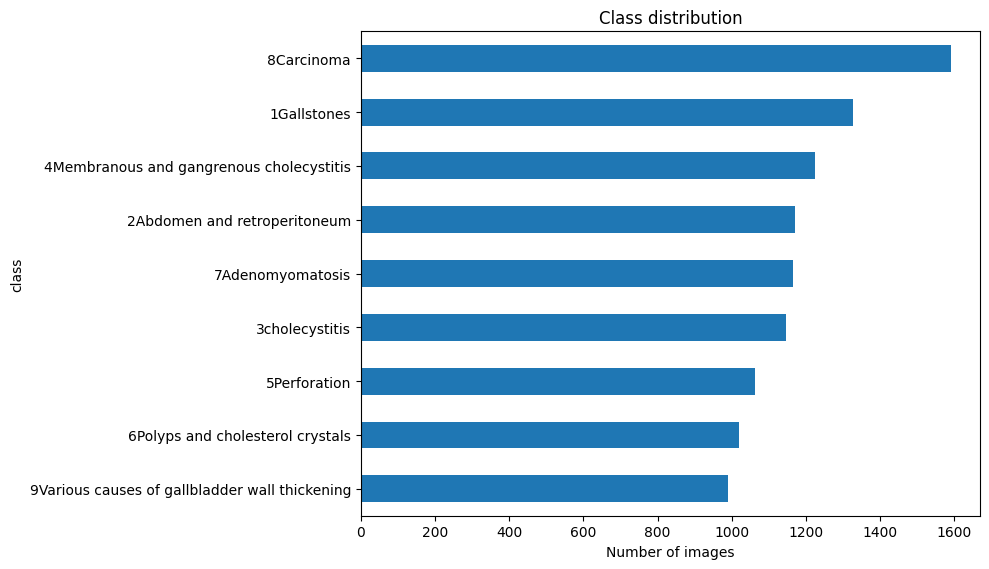

Top-level entries under DATA_ROOT: ['1Gallstones', '2Abdomen and retroperitoneum', '3cholecystitis', '4Membranous and gangrenous cholecystitis', '5Perforation', '6Polyps and cholesterol crystals', '7Adenomyomatosis', '8Carcinoma', '9Various causes of gallbladder wall thickening', 'eda_outputs'] 


In [ ]:
#Safety checks
try:
    _ = df_all
except NameError:
    raise SystemExit("df_all is not defined. Run Cell 2 first to build the file list.")

if len(df_all) == 0:
    raise SystemExit("No images found; cannot continue EDA.")

#Class counts
class_counts = df_all["class"].value_counts().sort_values(ascending=False)
n_classes = class_counts.shape[0]
print(f"Classes detected: {n_classes}")
display(class_counts)

#Patient coverage and counts (using robust patient_id)
coverage = df_all["patient_id"].notna().mean()
n_patients = df_all["patient_id"].nunique(dropna=True)
print(f"[patient_id] coverage: {coverage*100:.1f}%  ({df_all['patient_id'].notna().sum()} / {len(df_all)})")
print(f"Distinct patients (guessed): {n_patients}")

patient_counts = df_all["patient_id"].value_counts(dropna=True).sort_values(ascending=False)

#Save summaries
(class_counts).to_csv(EDA_OUT / "class_counts.csv")
(patient_counts).to_csv(EDA_OUT / "patient_counts_guess.csv")

#Plot class distribution
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 4 + 0.2 * n_classes))
class_counts.plot(kind="barh")
plt.gca().invert_yaxis()
plt.title("Class distribution")
plt.xlabel("Number of images")
plt.tight_layout()
plt.savefig(EDA_OUT / "class_distribution.png", dpi=220)
plt.show()

#Quick top-level structure under DATA_ROOT
top_entries = [p.name for p in DATA_ROOT.iterdir()]
print("Top-level entries under DATA_ROOT:", top_entries[:30], "..." if len(top_entries) > 30 else "")


2.4. Image geometry: sizes, aspect ratios, grayscale check

,width,height,aspect
count,10692.000000,10692.000000,10692.000000
mean,1198.919753,901.447811,1.330825
std,25.610173,23.172051,0.038181
min,900.000000,876.000000,0.750000
5%,1200.000000,900.000000,1.333333
50%,1200.000000,900.000000,1.333333
95%,1200.000000,900.000000,1.333333
max,2400.000000,1800.000000,1.335616


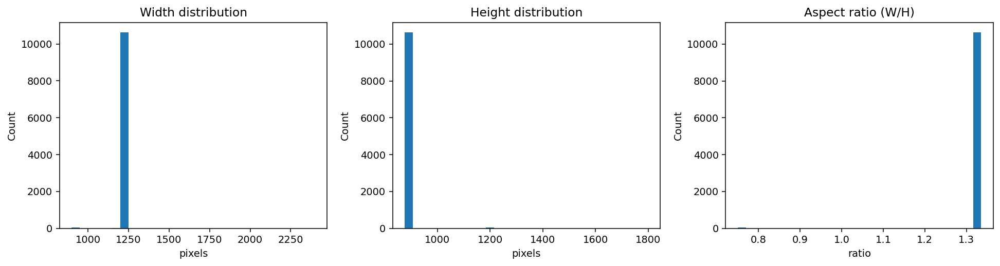

Channel probe:   0%|          | 0/1000 [00:00<?, ?img/s]

[Channels] Sampled 1000 images (skipped 0).
  3-channel: 1000
[OK] geometry_distributions.png saved; image_index.csv refreshed at: /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset/eda_outputs/image_index.csv


In [ ]:
#Safety check: make sure df_all exists
try:
    _ = df_all
except NameError:
    raise SystemExit("df_all is not defined. Run Cell 2 first.")

if len(df_all) == 0:
    raise SystemExit("No images found; cannot continue EDA.")

#If any geometry is missing, compute it now using image_geometry()
geom_cols = ["width", "height", "aspect"]
missing_mask = df_all[geom_cols].isna().any(axis=1)

if missing_mask.any():
    print(f"[INFO] Filling geometry for {missing_mask.sum()} images with missing width/height/aspect...")
    widths, heights, aspects = [], [], []
    for fp in tqdm(df_all.loc[missing_mask, "filepath"], desc="Computing geometry", unit="img"):
        w, h, asp = image_geometry(fp)
        widths.append(w); heights.append(h); aspects.append(asp)
    df_all.loc[missing_mask, "width"]  = widths
    df_all.loc[missing_mask, "height"] = heights
    df_all.loc[missing_mask, "aspect"] = aspects

#Describe geometry
geom_df = df_all[geom_cols].dropna().astype(float)
display(geom_df.describe(percentiles=[0.05, 0.50, 0.95]))

#Plots: width, height, aspect ratio
import matplotlib.pyplot as plt
plt.rcParams["figure.dpi"] = 140

fig, ax = plt.subplots(1, 3, figsize=(14, 3.8))
ax[0].hist(geom_df["width"], bins=30)
ax[0].set_title("Width distribution")
ax[0].set_xlabel("pixels")

ax[1].hist(geom_df["height"], bins=30)
ax[1].set_title("Height distribution")
ax[1].set_xlabel("pixels")

ax[2].hist(geom_df["aspect"], bins=30)
ax[2].set_title("Aspect ratio (W/H)")
ax[2].set_xlabel("ratio")

for a in ax:
    a.set_ylabel("Count")

plt.tight_layout()
plt.savefig(EDA_OUT / "geometry_distributions.png", dpi=220)
plt.show()

#Quick grayscale vs 3-channel probe (sample)
from collections import Counter
import numpy as np
import cv2

def detect_channels(fp: str) -> int | None:
    arr = np.fromfile(fp, dtype=np.uint8)
    img = cv2.imdecode(arr, cv2.IMREAD_UNCHANGED)
    if img is None:
        img = cv2.imread(fp, cv2.IMREAD_UNCHANGED)
    if img is None:
        return None
    if img.ndim == 2:    # H x W
        return 1
    return int(img.shape[2])  # H x W x C

SAMPLE_N = min(1000, len(df_all))
sample_paths = df_all["filepath"].sample(SAMPLE_N, random_state=42)

chan_counts = Counter()
skipped = 0
for fp in tqdm(sample_paths, desc="Channel probe", unit="img"):
    c = detect_channels(fp)
    if c is None:
        skipped += 1
        continue
    chan_counts[c] += 1

print(f"[Channels] Sampled {SAMPLE_N} images (skipped {skipped}).")
for k, v in sorted(chan_counts.items()):
    label = "grayscale (1 ch)" if k == 1 else f"{k}-channel"
    print(f"  {label}: {v}")

#Save updated df_all with geometry (if it changed)
df_all.to_csv(EDA_OUT / "image_index.csv", index=False)
print(f"[OK] geometry_distributions.png saved; image_index.csv refreshed at: {EDA_OUT / 'image_index.csv'}")


2.5. Blur distribution (Variance-of-Laplacian) + suggested threshold

VoL scoring @320×320:   0%|          | 0/10692 [00:00<?, ?img/s]

[VoL] Scored: 10692 images  |  Skipped: 0
Suggested VoL thresholds (dataset-wide; we will recompute per train fold):
  τ_5%  = 104.58
  τ_8%  = 122.76
  τ_10% = 131.84
[SET] Provisional blur threshold τ = 122.76 (8th percentile)


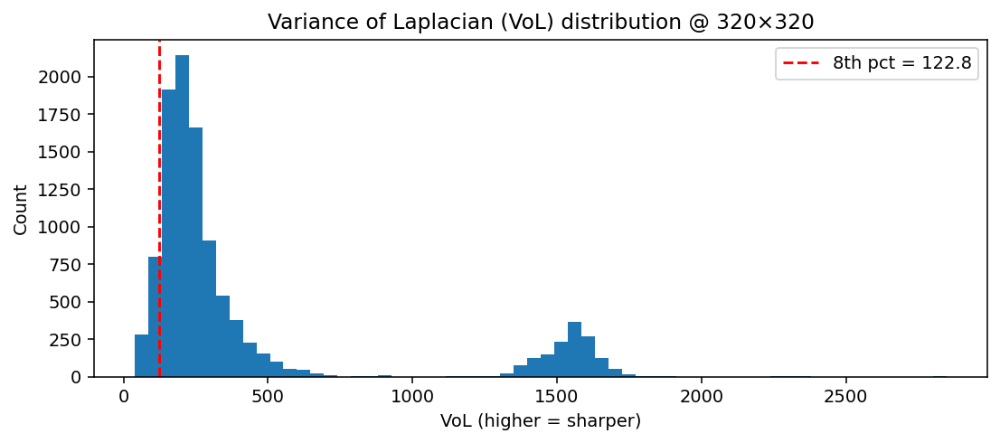

[OK] Saved: /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset/eda_outputs/vol_scores.csv and /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset/eda_outputs/vol_distribution.png


In [ ]:
#Uses helpers from Cell 1: safe_imread_gray, letterbox_square, variance_of_laplacian
import numpy as np #for saving pictures in arrays, calculations, etc.
import matplotlib.pyplot as plt #to plot graphs
from tqdm.auto import tqdm #for progress bars

#Safety
try:
    _ = df_all
except NameError:
    raise SystemExit("df_all is not defined. Run Cell 2 first to build the file list.")

if len(df_all) == 0:
    raise SystemExit("No images found; cannot continue EDA.")

TARGET_SIZE = 320

#Load grayscale, letterbox to square, resize to 320x320, return VoL score.
def vol_score_at_320(fp: str) -> float | None:

    g = safe_imread_gray(fp)
    if g is None:
        return None
    g_sq, _ = letterbox_square(g, pad_value=0)
    g_320 = cv2.resize(g_sq, (TARGET_SIZE, TARGET_SIZE), interpolation=cv2.INTER_LINEAR)
    return variance_of_laplacian(g_320)


#Compute VoL over a (possibly sampled) list of filepaths. Returns np.array of scores (floats). Skips unreadable images.
def compute_vol_distribution(filepaths, max_samples=None, seed=42):
    rng = np.random.default_rng(seed)
    fps = list(filepaths)
    if max_samples and len(fps) > max_samples:
        fps = list(rng.choice(fps, size=max_samples, replace=False))
    scores = []
    skipped = 0
    for fp in tqdm(fps, desc="VoL scoring @320×320", unit="img"):
        s = vol_score_at_320(fp)
        if s is None:
            skipped += 1
            continue
        scores.append(s)
    scores = np.array(scores, dtype=np.float64)
    print(f"[VoL] Scored: {len(scores)} images  |  Skipped: {skipped}")
    return scores

#Run on all images (set MAX_VOL_SAMPLES to e.g. 6000 for speed if needed)
MAX_VOL_SAMPLES = None  # or e.g., 6000
vol_scores = compute_vol_distribution(df_all["filepath"].tolist(), max_samples=MAX_VOL_SAMPLES)

#Save raw scores for the thesis appendix
(vol_scores.astype(np.float64)).tofile(str(EDA_OUT / "vol_scores.bin"))
np.savetxt(str(EDA_OUT / "vol_scores.csv"), vol_scores, fmt="%.6f", delimiter=",")

#Suggested thresholds (dataset-wide preview; per-fold thresholds later)
p5, p8, p10 = np.percentile(vol_scores, [5, 8, 10])
print("Suggested VoL thresholds (dataset-wide; we will recompute per train fold):")
print(f"  τ_5%  = {p5:.2f}")
print(f"  τ_8%  = {p8:.2f}")
print(f"  τ_10% = {p10:.2f}")

#Set a provisional working threshold (used only for exploratory EDA now)
VOL_THRESHOLD = float(p8)
print(f"[SET] Provisional blur threshold τ = {VOL_THRESHOLD:.2f} (8th percentile)")

#Plot distribution
plt.figure(figsize=(8, 3.6))
plt.hist(vol_scores, bins=60)
plt.axvline(p8, color="r", linestyle="--", label=f"8th pct = {p8:.1f}")
plt.title("Variance of Laplacian (VoL) distribution @ 320×320")
plt.xlabel("VoL (higher = sharper)")
plt.ylabel("Count")
plt.legend()
plt.tight_layout()
plt.savefig(EDA_OUT / "vol_distribution.png", dpi=220)
plt.show()

print(f"[OK] Saved: {EDA_OUT / 'vol_scores.csv'} and {EDA_OUT / 'vol_distribution.png'}")


2.6. Per-class random montages (quick visual audit)

Montages:   0%|          | 0/9 [00:00<?, ?it/s]

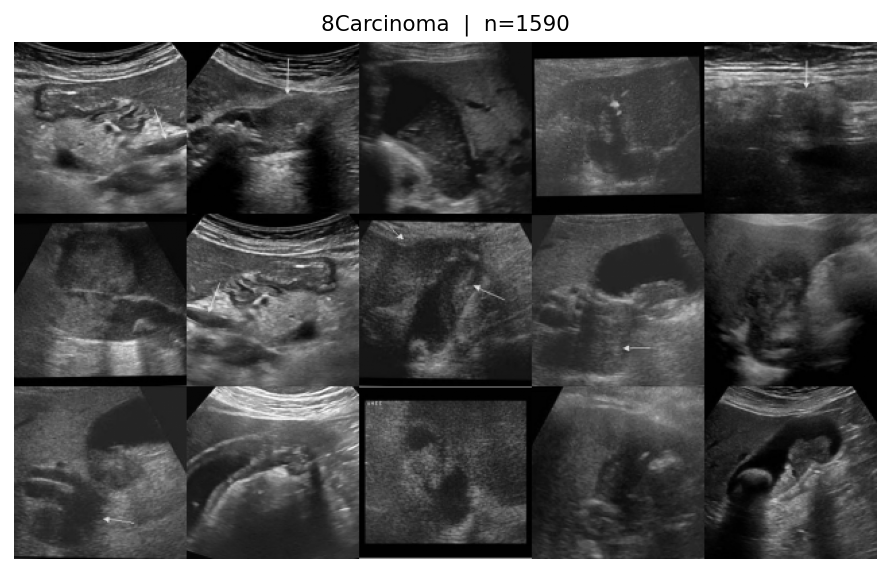

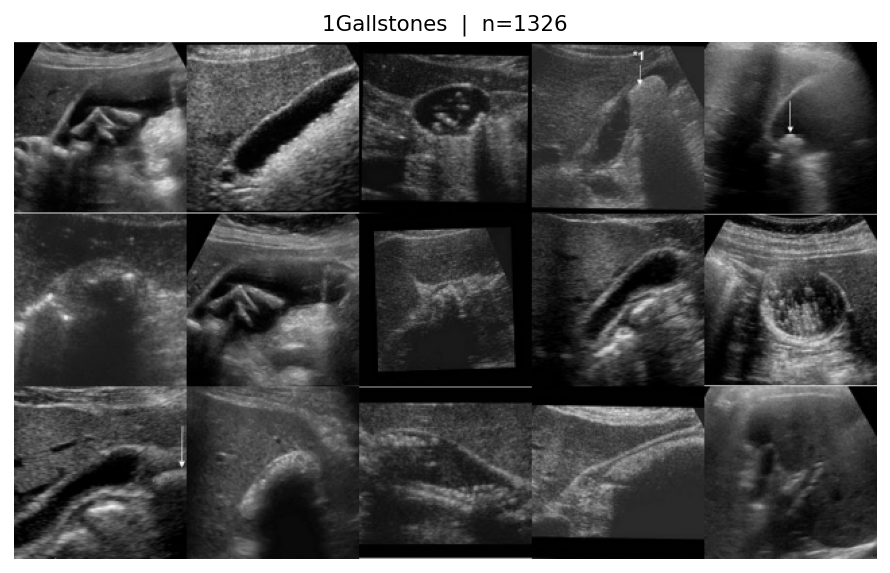

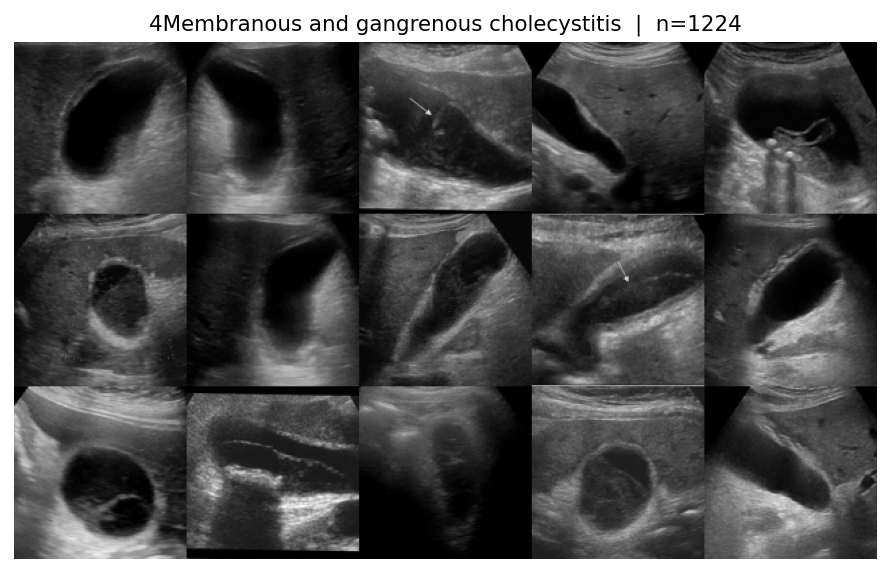

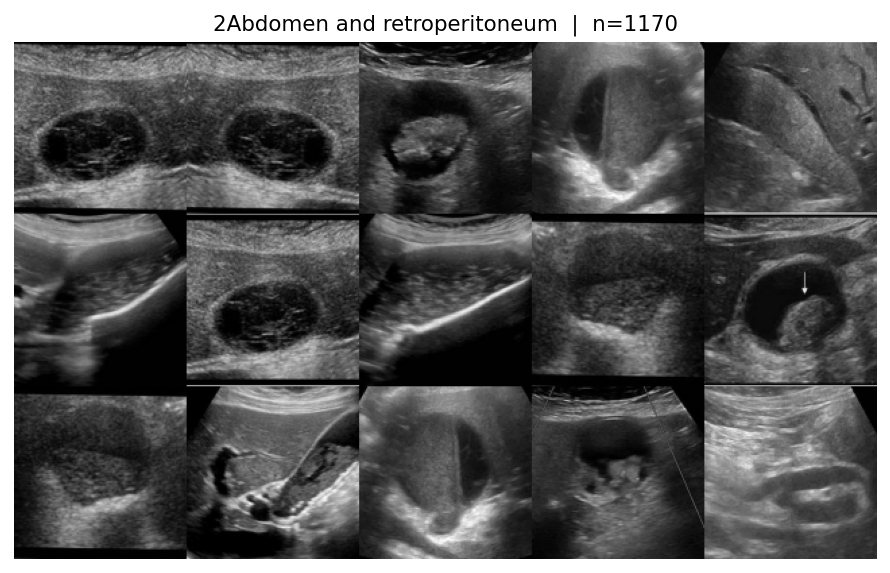

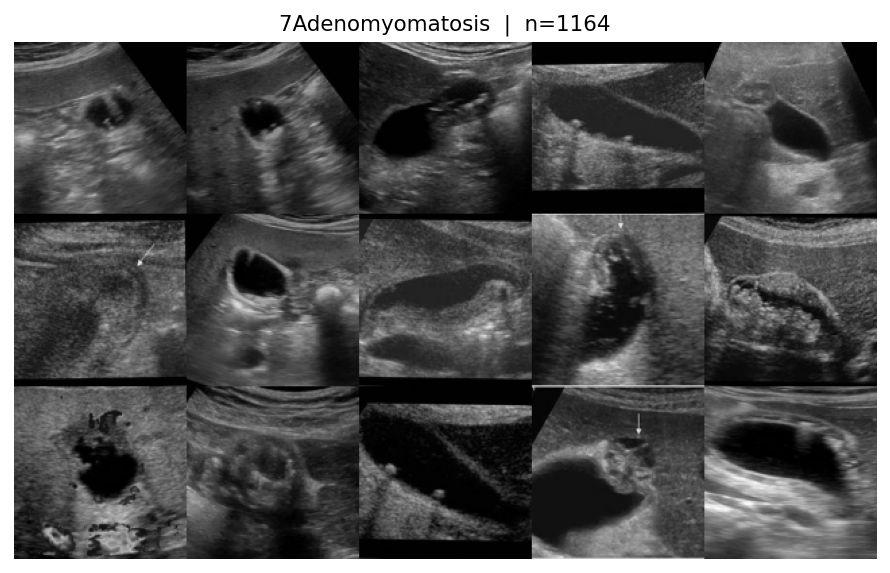

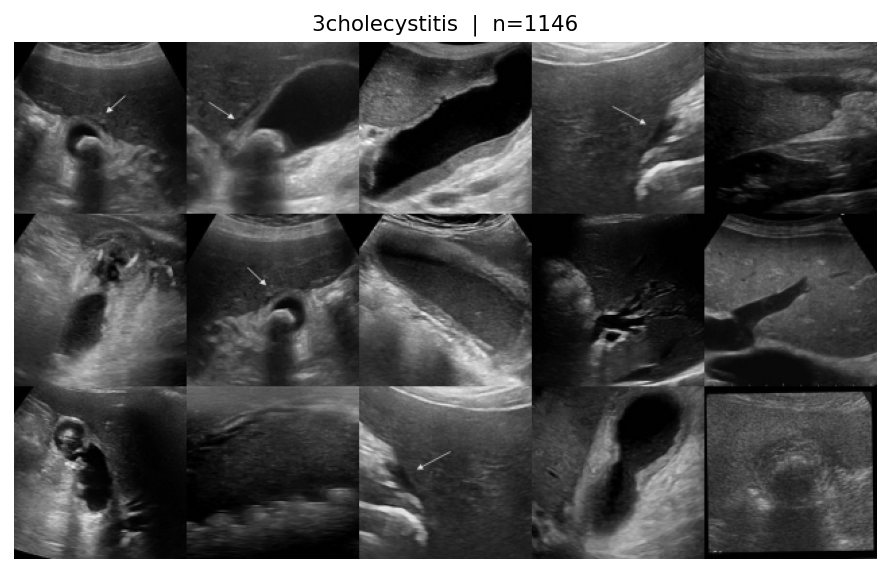

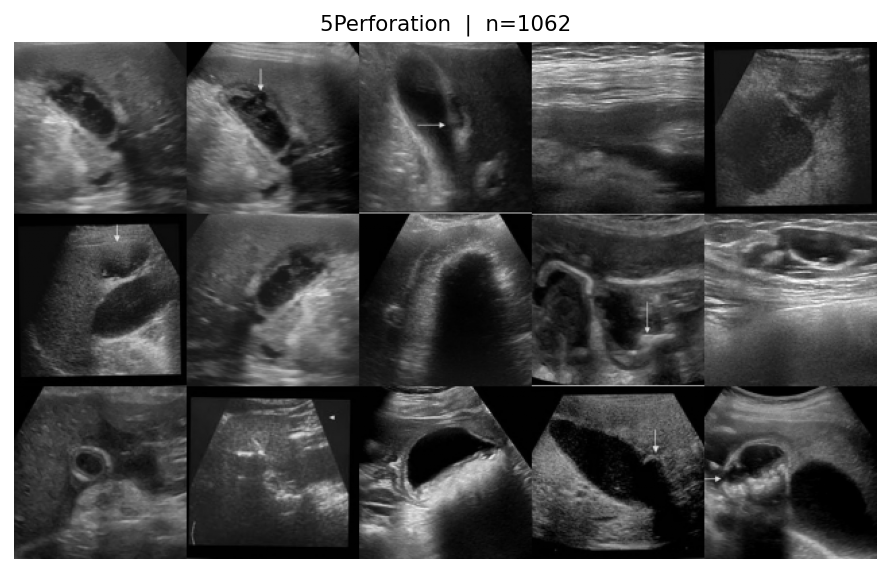

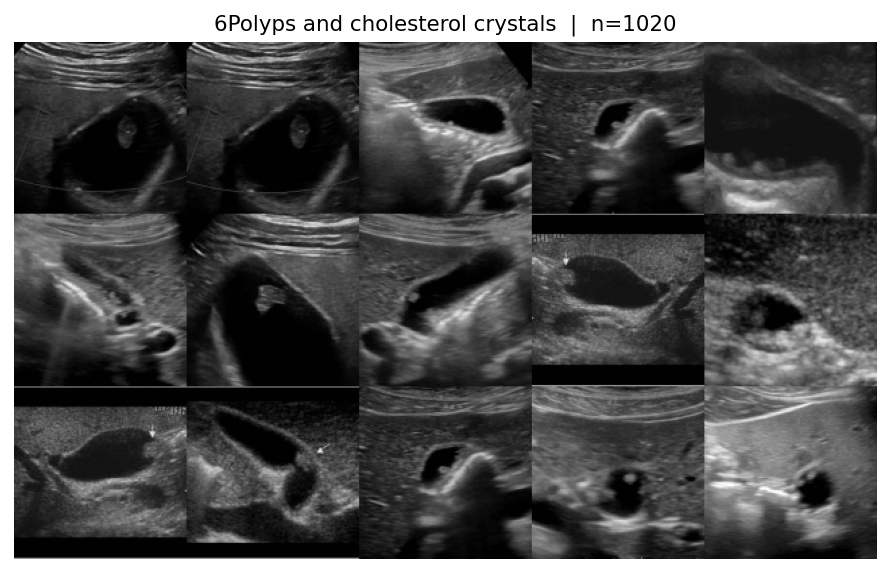

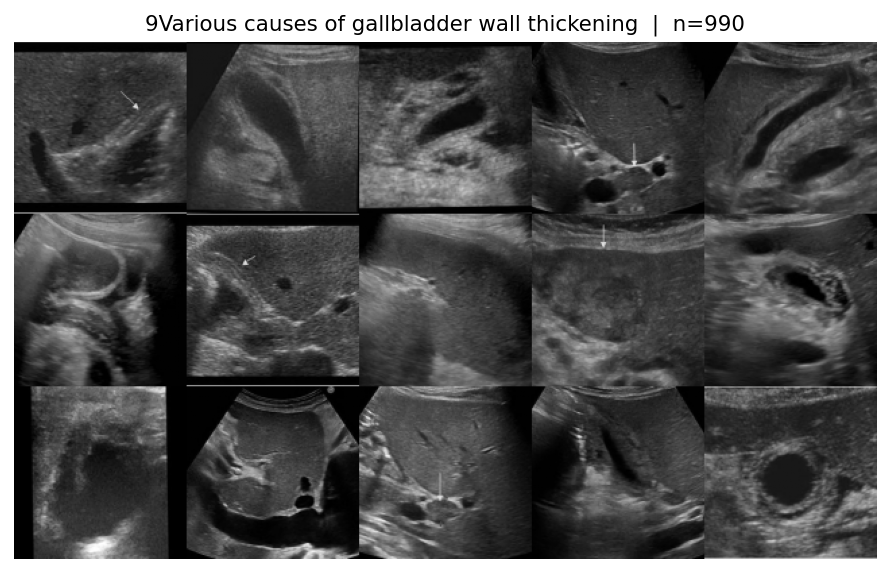


[OK] Saved montages:
  • /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset/eda_outputs/montage_8Carcinoma.png
  • /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset/eda_outputs/montage_1Gallstones.png
  • /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset/eda_outputs/montage_4Membranous_and_gangrenous_cholecystitis.png
  • /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset/eda_outputs/montage_2Abdomen_and_retroperitoneum.png
  • /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset/eda_outputs/montage_7Adenomyomatosis.png
  • /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset/eda_outputs/montage_3cholecystitis.png
  • /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset/eda_outputs/montage_5Perforation.png
  • /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset/eda_outputs/montage_6Polyps_and_

In [ ]:
#Builds one grid image per class so you can eyeball variability/artefacts.
#Uses: df_all (from Cell 2), EDA_OUT, safe_imread_gray (from Cell 1)

import numpy as np #for faster math. operations, storing of images as arrays, etc.
import matplotlib.pyplot as plt #for plotting
import re #Tools for working with text using regular expressions.
from pathlib import Path #to work with paths on OS level.
from tqdm.auto import tqdm #for progress bars.

plt.rcParams["figure.dpi"] = 140

#Center-crop a grayscale image to a square (min(H, W)).
def center_square_crop(img: np.ndarray) -> np.ndarray:
    h, w = img.shape[:2]
    side = min(h, w)
    y0 = (h - side) // 2
    x0 = (w - side) // 2
    return img[y0:y0+side, x0:x0+side]

"""
Create and save a montage for a given class.
- n_rows x n_cols tiles
- grayscale center-crop → resize to tile_size
Returns saved path or None if no images could be read.
"""
def save_class_montage(class_name: str,
                       df_class,
                       n_rows: int = 3,
                       n_cols: int = 5,
                       tile_size: int = 128,
                       seed: int = 42) -> Path | None:
    rng = np.random.default_rng(seed)
    max_tiles = n_rows * n_cols

    #Sample without replacement (or take all if class is small)
    filepaths = df_class["filepath"].to_numpy()
    if len(filepaths) == 0:
        return None
    if len(filepaths) > max_tiles:
        idx = rng.choice(len(filepaths), size=max_tiles, replace=False)
        filepaths = filepaths[idx]

    tiles = []
    for fp in filepaths:
        g = safe_imread_gray(fp)
        if g is None:
            continue
        g_sq = center_square_crop(g)
        g_res = cv2.resize(g_sq, (tile_size, tile_size), interpolation=cv2.INTER_AREA)
        tiles.append(g_res)

    if len(tiles) == 0:
        print(f"[WARN] Could not read any images for class '{class_name}'.")
        return None

    #Prepare canvas
    H = n_rows * tile_size
    W = n_cols * tile_size
    canvas = np.zeros((H, W), dtype=np.uint8)

    #Paste tiles row by row
    for i, img in enumerate(tiles[:max_tiles]):
        r = i // n_cols
        c = i % n_cols
        canvas[r*tile_size:(r+1)*tile_size, c*tile_size:(c+1)*tile_size] = img

    #Save figure
    fig = plt.figure(figsize=(n_cols*1.6, n_rows*1.6))
    plt.imshow(canvas, cmap="gray")
    plt.axis("off")
    plt.title(f"{class_name}  |  n={len(df_class)}", fontsize=11, pad=6)

    #Safe filename
    safe_name = re.sub(r"[^A-Za-z0-9._-]+", "_", class_name)
    out_path = EDA_OUT / f"montage_{safe_name}.png"
    plt.savefig(out_path, dpi=220, bbox_inches="tight", pad_inches=0.05)
    plt.show()
    plt.close(fig)
    return out_path

#Build montages for top-k classes (by count)
class_counts = df_all["class"].value_counts()
top_k = min(len(class_counts), 9)  #change if you want more/less
targets = class_counts.index[:top_k].tolist()

saved = []
for cname in tqdm(targets, desc="Montages"):
    df_c = df_all[df_all["class"] == cname]
    p = save_class_montage(cname, df_c, n_rows=3, n_cols=5, tile_size=128, seed=42)
    if p is not None:
        saved.append(p)

print("\n[OK] Saved montages:")
for p in saved:
    print("  •", p)


2.7. Save a clean EDA report CSV

In [ ]:
#Consolidates key fields into a single CSV and writes summary files.

import json
import numpy as np

#Safety
try:
    _ = df_all
except NameError:
    raise SystemExit("df_all is not defined. Run Cell 2 first.")

if len(df_all) == 0:
    raise SystemExit("No images found; cannot continue EDA.")

#1. Clean report with stable column order
cols_order = ["filepath", "filename", "class", "class_idx", "patient_id", "width", "height", "aspect"]
missing = [c for c in cols_order if c not in df_all.columns]
if missing:
    raise ValueError(f"Missing expected columns in df_all: {missing}")

df_report = df_all[cols_order].copy()
df_report.sort_values(["class", "patient_id", "filename"], inplace=True)

report_csv = EDA_OUT / "eda_report.csv"
df_report.to_csv(report_csv, index=False)
print(f"[OK] EDA report saved to: {report_csv}")

#2. Per-class and per-patient counts
class_counts = df_all["class"].value_counts().sort_values(ascending=False)
patient_counts = df_all["patient_id"].value_counts().sort_values(ascending=False)

class_counts.to_csv(EDA_OUT / "class_counts.csv")
patient_counts.to_csv(EDA_OUT / "patient_counts.csv")
print(f"[OK] Saved class_counts.csv and patient_counts.csv")

#3. Compact JSON summary (nice for the thesis appendix / reproducibility)
summary = {
    "n_images": int(len(df_all)),
    "n_classes": int(df_all["class"].nunique()),
    "n_patients": int(df_all["patient_id"].nunique()),
    "image_width_mean": float(np.nanmean(df_all["width"])),
    "image_height_mean": float(np.nanmean(df_all["height"])),
    "aspect_mean": float(np.nanmean(df_all["aspect"])),
    "aspect_p5_p95": [
        float(np.nanpercentile(df_all["aspect"].dropna(), 5)),
        float(np.nanpercentile(df_all["aspect"].dropna(), 95)),
    ],
}

#If VoL scores were computed in Cell 5, include suggested thresholds here too
vol_csv = EDA_OUT / "vol_scores.csv"
if vol_csv.exists():
    try:
        vol_scores = np.loadtxt(vol_csv, delimiter=",")
        if vol_scores.size > 0:
            summary["vol_thresholds"] = {
                "p5": float(np.percentile(vol_scores, 5)),
                "p8": float(np.percentile(vol_scores, 8)),
                "p10": float(np.percentile(vol_scores, 10)),
            }
    except Exception as e:
        print(f"[WARN] Could not load vol_scores.csv: {e}")

with open(EDA_OUT / "eda_summary.json", "w") as f:
    json.dump(summary, f, indent=2)
print(f"[OK] Wrote eda_summary.json to: {EDA_OUT}")

#4. Preview first few rows
display(df_report.head(10))


[OK] EDA report saved to: /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset/eda_outputs/eda_report.csv
[OK] Saved class_counts.csv and patient_counts.csv
[OK] Wrote eda_summary.json to: /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset/eda_outputs


,filepath,filename,class,class_idx,patient_id,width,height,aspect
0,/content/drive/MyDrive/AI/Project_Summer_Modul...,a1 (1).jpg,1Gallstones,0,a1,1200,900,1.333333
1,/content/drive/MyDrive/AI/Project_Summer_Modul...,a1 (10).jpg,1Gallstones,0,a1,1200,900,1.333333
2,/content/drive/MyDrive/AI/Project_Summer_Modul...,a1 (11).jpg,1Gallstones,0,a1,1200,900,1.333333
3,/content/drive/MyDrive/AI/Project_Summer_Modul...,a1 (12).jpg,1Gallstones,0,a1,1200,900,1.333333
4,/content/drive/MyDrive/AI/Project_Summer_Modul...,a1 (13).jpg,1Gallstones,0,a1,1200,900,1.333333
5,/content/drive/MyDrive/AI/Project_Summer_Modul...,a1 (14).jpg,1Gallstones,0,a1,1200,900,1.333333
6,/content/drive/MyDrive/AI/Project_Summer_Modul...,a1 (15).jpg,1Gallstones,0,a1,1200,900,1.333333
7,/content/drive/MyDrive/AI/Project_Summer_Modul...,a1 (16).jpg,1Gallstones,0,a1,1200,900,1.333333
8,/content/drive/MyDrive/AI/Project_Summer_Modul...,a1 (17).jpg,1Gallstones,0,a1,1200,900,1.333333
9,/content/drive/MyDrive/AI/Project_Summer_Modul...,a1 (18).jpg,1Gallstones,0,a1,1200,900,1.333333


# 3. Pre-processing and Quality Check.

3.1. Config & reproducibility

In [ ]:
#Import Needed libraries.
import os, random
import numpy as np
import torch

#Core config
IMG_SIZE = 320
VOL_PERCENTILE = 8.0   #blur threshold percentile for train filtering
MEDIAN_FILTER = True   #apply 3x3 median denoise
BATCH_SIZE = 32
NUM_WORKERS = 2        #adjust to between 2-4.

#Repro seeding
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

#Make CuDNN behavior deterministic (slower but reproducible)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

print(f"[CFG] IMG_SIZE={IMG_SIZE}, VOL_PERCENTILE={VOL_PERCENTILE}, MEDIAN_FILTER={MEDIAN_FILTER}")


[CFG] IMG_SIZE=320, VOL_PERCENTILE=8.0, MEDIAN_FILTER=True


3.2. Albumentations pipelines (train vs eval).

In [ ]:
#Import Needed libraries.

#Restricting the environment to certain versions due to deprications in the latest ones or errors.
!pip -q install albumentations==1.4.4 opencv-python==4.9.0.80

import albumentations as A
from albumentations.pytorch import ToTensorV2

#Definition of Z-score function.
class PerImageZScore(A.ImageOnlyTransform):
    """Per-image z-score: (x - mean) / std, applied after photometric augs."""
    def __init__(self, p=1.0, eps=1e-6):
        super().__init__(always_apply=True, p=p)
        self.eps = eps
    def apply(self, img, **params):
        img = img.astype(np.float32)
        mu = img.mean()
        sigma = img.std()
        sigma = max(sigma, self.eps)
        return (img - mu) / sigma

def make_train_transform():
    return A.Compose([
        #photometric + geometric (small, conservative)
        A.HorizontalFlip(p=0.5),
        A.ShiftScaleRotate(shift_limit=0.0, scale_limit=0.10, rotate_limit=10,
                           border_mode=cv2.BORDER_CONSTANT, p=0.8),
        A.RandomBrightnessContrast(brightness_limit=0.15, contrast_limit=0.15, p=0.8),
        #standardise after augs
        PerImageZScore(p=1.0),
        ToTensorV2(),
    ])

def make_eval_transform():
    return A.Compose([
        PerImageZScore(p=1.0),
        ToTensorV2(),
    ])

train_tf = make_train_transform()
eval_tf  = make_eval_transform()

print("[OK] Transforms ready (train vs eval).")


NameError: name 'cv2' is not defined

3.3 PyTorch Dataset with preprocessing stages.

In [ ]:
#Reuses: safe_imread_gray, letterbox_square, median_3x3, to_rgb3_from_gray (from earlier)

#Function to transform 1-channel (gray) to 3-channels (RGB)
def to_rgb3_from_gray(img_gray: np.ndarray):
    """Stack gray to 3 channels (RGB order)."""
    return cv2.cvtColor(img_gray, cv2.COLOR_GRAY2RGB)

#Function for Blur filtering.
def median_3x3(img_gray: np.ndarray):
    return cv2.medianBlur(img_gray, 3)

from torch.utils.data import Dataset, DataLoader

class GBDDataset(Dataset):
    """
    Pipeline (per sample):
      1) read grayscale
      2) letterbox to square
      3) resize to IMG_SIZE
      4) optional 3x3 median denoise
      5) convert to RGB
      6) Albumentations (train or eval)
      7) return tensor, label, filepath
    """
    def __init__(self, df, class_to_idx: dict, transform: A.Compose,
                 img_size: int = 320, use_median: bool = True):
        self.df = df.reset_index(drop=True)
        self.class_to_idx = class_to_idx
        self.transform = transform
        self.img_size = img_size
        self.use_median = use_median

    def __len__(self):
        return len(self.df)

    def __getitem__(self, i):
        row = self.df.iloc[i]
        fp = row.filepath
        label = self.class_to_idx[row["class"]]

        #1. read grayscale
        g = safe_imread_gray(fp)
        if g is None:
            raise RuntimeError(f"Failed to read image: {fp}")

        #2. letterbox to square
        g_sq, _ = letterbox_square(g, pad_value=0)

        #3. resize
        g_rz = cv2.resize(g_sq, (self.img_size, self.img_size), interpolation=cv2.INTER_LINEAR)

        #4. optional median denoise
        if self.use_median:
            g_rz = median_3x3(g_rz)

        #5. to rgb
        rgb = to_rgb3_from_gray(g_rz)  # uint8, HWC

        #6. albumentations
        aug = self.transform(image=rgb)
        img_t = aug["image"]  # CHW float tensor

        return img_t, int(label), fp


3.4 Blur QC utilities (VoL threshold on train only)

In [ ]:


def vol_score_at_size(fp: str, size: int = IMG_SIZE) -> float | None:
    """Load gray → letterbox → resize → VoL."""
    g = safe_imread_gray(fp)
    if g is None:
        return None
    g_sq, _ = letterbox_square(g, pad_value=0)
    g_rz = cv2.resize(g_sq, (size, size), interpolation=cv2.INTER_LINEAR)
    return variance_of_laplacian(g_rz)

def compute_vol_scores(filepaths, max_samples=None, seed=SEED):
    """Compute VoL scores for a list of filepaths; optionally subsample for speed."""
    rng = np.random.default_rng(seed)
    fps = list(filepaths)
    if max_samples and len(fps) > max_samples:
        fps = list(rng.choice(fps, size=max_samples, replace=False))
    scores = []
    skipped = 0
    for fp in tqdm(fps, desc="VoL", unit="img"):
        s = vol_score_at_size(fp, size=IMG_SIZE)
        if s is None:
            skipped += 1
            continue
        scores.append(s)
    scores = np.array(scores, dtype=np.float64)
    print(f"[VoL] Scored={len(scores)} | Skipped={skipped}")
    return scores

def choose_threshold_from_train(train_df, percentile: float = VOL_PERCENTILE):
    """Choose τ from the train pool only (e.g., 8th percentile)."""
    scores = compute_vol_scores(train_df["filepath"].tolist(), max_samples=None)
    tau = float(np.percentile(scores, percentile))
    return tau, scores

def filter_train_by_blur(train_df, tau: float, log_dir: Path):
    """
    Keep only images with VoL >= tau.
    Writes CSVs of kept/dropped for reproducibility.
    """
    keep_mask = []
    kept_rows, dropped_rows = [], []
    for _, row in tqdm(train_df.iterrows(), total=len(train_df), desc="QC filter", unit="img"):
        s = vol_score_at_size(row.filepath, size=IMG_SIZE)
        ok = (s is not None) and (s >= tau)
        keep_mask.append(ok)
        (kept_rows if ok else dropped_rows).append({**row.to_dict(), "vol": None if s is None else float(s)})

    kept_df = pd.DataFrame(kept_rows).reset_index(drop=True)
    dropped_df = pd.DataFrame(dropped_rows).reset_index(drop=True)

    log_dir.mkdir(parents=True, exist_ok=True)
    kept_df.to_csv(log_dir / "train_kept_after_blur.csv", index=False)
    dropped_df.to_csv(log_dir / "train_dropped_blur.csv", index=False)

    print(f"[QC] Kept {len(kept_df):,} | Dropped {len(dropped_df):,} (τ={tau:.2f})")
    return kept_df, dropped_df


3.5 Example: dev/test split, then apply blur QC to train only, then build DataLoaders

In [ ]:
#Installation of needed libraries.

from sklearn.model_selection import StratifiedShuffleSplit

#Safety: needs df_all and class_to_idx from EDA Cell 2
try:
    _ = df_all, class_to_idx
except NameError:
    raise SystemExit("Run EDA Cell 2 first (it defines df_all and class_to_idx).")

#(Demo) stratified image-level split 85/15 (we'll replace with patient-level CV later)
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.15, random_state=SEED)
y = df_all["class"].map(class_to_idx).values
tr_idx, te_idx = next(sss.split(df_all, y))
df_dev  = df_all.iloc[tr_idx].reset_index(drop=True)
df_test = df_all.iloc[te_idx].reset_index(drop=True)
print(f"Dev={len(df_dev):,} | Test={len(df_test):,}")

#Choose blur threshold tau from DEV (train pool)
QC_LOG_DIR = (EDA_OUT / "qc_demo")
tau, scores = choose_threshold_from_train(df_dev, percentile=VOL_PERCENTILE)
print(f"[QC] τ (p{VOL_PERCENTILE:.0f}) = {tau:.2f}")

#Filter DEV by tau (train only); Test remains untouched
df_train_qc, df_train_dropped = filter_train_by_blur(df_dev, tau=tau, log_dir=QC_LOG_DIR)

#Build Datasets
train_ds = GBDDataset(df_train_qc, class_to_idx, transform=train_tf,
                      img_size=IMG_SIZE, use_median=MEDIAN_FILTER)
test_ds  = GBDDataset(df_test,      class_to_idx, transform=eval_tf,
                      img_size=IMG_SIZE, use_median=MEDIAN_FILTER)

#DataLoaders
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=NUM_WORKERS, pin_memory=True)
test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=NUM_WORKERS, pin_memory=True)

#Peek at one batch
xb, yb, fps = next(iter(train_loader))
print("Train batch:", xb.shape, yb.shape, "| dtype", xb.dtype)
print("Classes in this batch:", sorted(set(yb.tolist())))


Dev=9,088 | Test=1,604


VoL:   0%|          | 0/9088 [00:00<?, ?img/s]

[VoL] Scored=9088 | Skipped=0
[QC] τ (p8) = 122.76


QC filter:   0%|          | 0/9088 [00:00<?, ?img/s]

[QC] Kept 8,361 | Dropped 727 (τ=122.76)
Train batch: torch.Size([32, 3, 320, 320]) torch.Size([32]) | dtype torch.float32
Classes in this batch: [0, 1, 2, 3, 4, 5, 6, 7, 8]


3.6 Visual sanity check: original to preprocessed to augmented

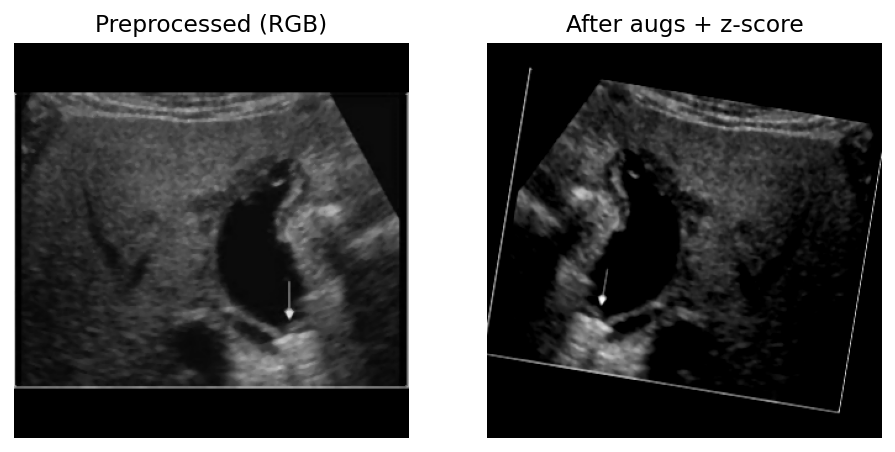

In [ ]:
#Install needed packages and libraries.

import matplotlib.pyplot as plt

def show_sample(df_row, transform):
    g = safe_imread_gray(df_row.filepath)
    g_sq, _ = letterbox_square(g, pad_value=0)
    g_rz = cv2.resize(g_sq, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_LINEAR)
    if MEDIAN_FILTER:
        g_rz = median_3x3(g_rz)
    rgb = to_rgb3_from_gray(g_rz)

    #Apply transform once (e.g., train_tf with augs)
    out = transform(image=rgb)["image"]
    #convert to HWC for plotting
    out_np = out.permute(1, 2, 0).cpu().numpy()
    #undo z-score for display (min-max to 0-1 for quick view)
    out_disp = (out_np - out_np.min()) / (out_np.max() - out_np.min() + 1e-6)

    fig, ax = plt.subplots(1, 2, figsize=(8, 4))
    ax[0].imshow(rgb, cmap=None)
    ax[0].set_title("Preprocessed (RGB)"); ax[0].axis("off")
    ax[1].imshow(out_disp, cmap=None)
    ax[1].set_title("After augs + z-score"); ax[1].axis("off")
    plt.show()

#Try it on a random kept training image
if len(df_train_qc):
    show_sample(df_train_qc.sample(1, random_state=SEED).iloc[0], transform=train_tf)


# 4. Splitting and Test Validation

4.1. Config & load manifest.

In [ ]:
#Importing of Libraries and Packages that are needed.
from pathlib import Path
import os, json, hashlib
import numpy as np
import pandas as pd
import cv2
from tqdm.auto import tqdm

#PATHS
PROJ_ROOT   = Path("/content/drive/MyDrive/AI/Project_Summer_Module") #Setting up of the root folder where the project is situated. CHANGE if you are running the code on your machine.
DATA_ROOT   = PROJ_ROOT / "Gallblader Diseases Dataset"   #your class folders
EDA_OUT     = DATA_ROOT / "eda_outputs"                   #setting the path for the EDA output
CACHE_ROOT  = PROJ_ROOT / "cache_320_rgb_v1"              #preprocessed images (RGB 320x320)
SPLITS_ROOT = PROJ_ROOT / "splits_5fold_v1"               #CSVs + metadata

CACHE_ROOT.mkdir(parents=True, exist_ok=True)
SPLITS_ROOT.mkdir(parents=True, exist_ok=True)

#PREPROCESSING SETTINGS
IMG_SIZE          = 320
USE_MEDIAN        = True          # apply 3×3 median denoise
VOL_PERCENTILE    = 8.0           # per-train-fold tau (VoL) percentile
SEED              = 42

#Load manifest from EDA (or fallback to df_all if still in memory)
manifest_csv = EDA_OUT / "eda_report.csv"
if manifest_csv.exists():
    df_all = pd.read_csv(manifest_csv)
    print(f"[OK] Loaded manifest: {manifest_csv}  (rows={len(df_all):,})")
else:
    try:
        _ = df_all
        print("[OK] Using df_all from memory (EDA not saved to CSV).")
    except NameError:
        raise SystemExit("No manifest found. Please run EDA to produce eda_outputs/eda_report.csv first.")

#Sanity: ensure columns
need_cols = {"filepath", "filename", "class", "class_idx", "patient_id"}
missing = need_cols - set(df_all.columns)
if missing:
    raise ValueError(f"Manifest missing columns: {missing}")

#Fallback: if any patient_id is NaN, assign a unique pseudo-ID (safe for grouping)
if df_all["patient_id"].isna().any():
    fill_ids = [f"img_{i}" for i in range(len(df_all))]
    df_all["patient_id"] = df_all["patient_id"].fillna(pd.Series(fill_ids, index=df_all.index))

#Helper: safe grayscale read
def safe_imread_gray(path: str):
    arr = np.fromfile(path, dtype=np.uint8)
    img = cv2.imdecode(arr, cv2.IMREAD_GRAYSCALE)
    if img is None:
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    return img

#Helper: letterbox to square
def letterbox_square(img_gray: np.ndarray, pad_value=0):
    h, w = img_gray.shape[:2]
    side = max(h, w)
    top    = (side - h) // 2
    bottom = side - h - top
    left   = (side - w) // 2
    right  = side - w - left
    sq = cv2.copyMakeBorder(img_gray, top, bottom, left, right, cv2.BORDER_CONSTANT, value=pad_value)
    return sq

#Helper: variance of Laplacian
def vol(gray_img: np.ndarray) -> float:
    return float(cv2.Laplacian(gray_img, cv2.CV_64F).var())

#Safe PNG write (supports non-ASCII paths)
def imwrite_png(path: Path, img_bgr_or_rgb: np.ndarray):
    ext = ".png"
    path = path.with_suffix(ext)
    ok, enc = cv2.imencode(ext, img_bgr_or_rgb)
    if not ok:
        raise IOError(f"Failed to encode {path}")
    enc.tofile(str(path))
    return path


[OK] Loaded manifest: /content/drive/MyDrive/AI/Project_Summer_Module/Gallblader Diseases Dataset/eda_outputs/eda_report.csv  (rows=10,692)


In [ ]:
#IF You GET AN ERROR WITH COMPATIBILITY OF CV2 AND NUMPY RUN THIS CODE AND RESTART THE RUNTIME. RUN THE SANITY CHECK BELOW AND START AGAIN FROM 4.1.
#Clean re-pin to a stable stack for Colab
!pip -q uninstall -y opencv-python opencv-python-headless numpy
!pip -q install --upgrade --force-reinstall \
  "numpy==1.26.4" \
  "scikit-learn>=1.6.0" \
  opencv-python==4.9.0.80 \
  albumentations==1.4.4 \
  timm==0.9.12

#(Optional) silence a common IPython warning in some Colab images
!pip -q install "jedi>=0.18.0"

print("Now go to: Runtime then Restart runtime. After it restarts, run your imports again.")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.0/68.0 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.7/57.7 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 118.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 59.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 139.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.7/307.7 kB 32.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.0/50.0 MB 45.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 444.8/444.8 kB 42.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 105.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15

In [ ]:
#After the restart, run sanity-check imports
import numpy, cv2, sklearn, albumentations, timm, torch
print("NumPy:", numpy.__version__)          # should be 1.26.4
print("OpenCV:", cv2.__version__)           # 4.9.0.80
print("scikit-learn:", sklearn.__version__) # >=1.6
print("Albumentations:", albumentations.__version__)
print("timm:", timm.__version__)
print("Torch:", torch.__version__)


NumPy: 1.26.4
OpenCV: 4.9.0
scikit-learn: 1.7.1
Albumentations: 1.4.4
timm: 0.9.12
Torch: 2.8.0+cu128


4.2. Cache preprocessed images (letterbox→320, median, to RGB) + VoL

In [ ]:
#Build cache path: CACHE_ROOT/<class>/<filename>.png
def cache_path_for(row) -> Path:
    cls = str(row["class"])
    base = Path(row["filename"]).stem + ".png"   # unify to png
    return CACHE_ROOT / cls / base

#Process and cache (skips if already exists)
cached_paths = []
vol_scores   = []

for i, row in tqdm(df_all.iterrows(), total=len(df_all), desc="Caching 320×320"):
    src = row["filepath"]
    dst = cache_path_for(row)
    if not dst.parent.exists():
        dst.parent.mkdir(parents=True, exist_ok=True)
    if not dst.exists():
        g = safe_imread_gray(src)
        if g is None:
            print(f"[WARN] unreadable: {src}")
            cached_paths.append(None)
            vol_scores.append(np.nan)
            continue
        g_sq = letterbox_square(g, pad_value=0)
        g_rz = cv2.resize(g_sq, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_LINEAR)
        if USE_MEDIAN:
            g_rz = cv2.medianBlur(g_rz, 3)
        #to RGB (3ch) for backbones expecting 3 channels
        rgb = cv2.cvtColor(g_rz, cv2.COLOR_GRAY2RGB)
        try:
            imwrite_png(dst, rgb)
        except Exception as e:
            print(f"[WARN] failed to write: {dst} :: {e}")
            cached_paths.append(None)
            vol_scores.append(np.nan)
            continue
    #compute/store VoL on the cached (guaranteed 320×320 gray-equivalent)
    #Read back as gray for consistent VoL (fast)
    arr = np.fromfile(str(dst), dtype=np.uint8)
    img = cv2.imdecode(arr, cv2.IMREAD_GRAYSCALE)
    v = np.nan if img is None else vol(img)
    cached_paths.append(str(dst))
    vol_scores.append(v)

df_all["cache_path"] = cached_paths
df_all["vol_320"] = vol_scores

#Save cache mapping
cache_map_csv = CACHE_ROOT / "cache_manifest.csv"
df_all.to_csv(cache_map_csv, index=False)
print(f"[OK] Wrote cache manifest: {cache_map_csv}")
print(f"[INFO] Cached ok: {(df_all['cache_path'].notna()).sum()} / {len(df_all)}")


Caching 320×320:   0%|          | 0/10692 [00:00<?, ?it/s]

KeyboardInterrupt: 

4.3. Create patient-level splits: 85/15 hold-out test, then 5-fold CV on 85%

In [ ]:
from sklearn.model_selection import GroupShuffleSplit, StratifiedGroupKFold
import numpy as np

#Ensure we only use rows that cached successfully
df_ok = df_all[df_all["cache_path"].notna()].reset_index(drop=True)
print(f"[OK] Images available for splitting: {len(df_ok):,}")

y = df_ok["class_idx"].values
groups = df_ok["patient_id"].astype(str).values

#1. Patient-level 15% hold-out TEST (group-only split; class strat is handled in CV later)
gss = GroupShuffleSplit(n_splits=1, test_size=0.15, random_state=SEED)
train_dev_idx, test_idx = next(gss.split(df_ok, y, groups))
df_dev  = df_ok.iloc[train_dev_idx].reset_index(drop=True)
df_test = df_ok.iloc[test_idx].reset_index(drop=True)

#Save TEST manifest (no blur filtering)
test_csv = SPLITS_ROOT / "test.csv"
df_test[["cache_path","filepath","class","class_idx","patient_id","vol_320"]].to_csv(test_csv, index=False)
print(f"[OK] Saved held-out test set: {test_csv}  (n={len(df_test)})")

#2. 5-fold StratifiedGroupKFold on DEV (stratify by class, group by patient)
sgkf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=SEED)
folds = list(sgkf.split(df_dev, df_dev["class_idx"], df_dev["patient_id"]))

#Meta info
meta = {
    "img_size": IMG_SIZE,
    "use_median": bool(USE_MEDIAN),
    "vol_percentile": float(VOL_PERCENTILE),
    "n_dev": int(len(df_dev)),
    "n_test": int(len(df_test)),
}
with open(SPLITS_ROOT / "meta.json", "w") as f:
    json.dump(meta, f, indent=2)
print(f"[OK] Wrote meta.json")


[OK] Images available for splitting: 10,692
[OK] Saved held-out test set: /content/drive/MyDrive/AI/Project_Summer_Module/splits_5fold_v1/test.csv  (n=1512)
[OK] Wrote meta.json


4.4. For each fold: choose τ on TRAIN, filter train by blur (keep val intact), save CSVs

In [ ]:
def choose_tau_from_train(df_train: pd.DataFrame, percentile: float) -> float:
    scores = df_train["vol_320"].dropna().values
    if len(scores) == 0:
        #Fallback if no VoL available (should not happen with cache step)
        return 0.0
    return float(np.percentile(scores, percentile))

def save_fold_csvs(k: int, train_df: pd.DataFrame, val_df: pd.DataFrame, tau: float):
    fold_dir = SPLITS_ROOT / f"fold_{k}"
    fold_dir.mkdir(parents=True, exist_ok=True)

    #Filter TRAIN by blur threshold (train only)
    keep_mask = (train_df["vol_320"].notna()) & (train_df["vol_320"] >= tau)
    kept  = train_df[keep_mask].copy()
    dropd = train_df[~keep_mask].copy()

    kept_csv   = fold_dir / "train.csv"
    drop_csv   = fold_dir / "train_dropped_blur.csv"
    val_csv    = fold_dir / "val.csv"
    thresh_json= fold_dir / "qc_threshold.json"

    kept[["cache_path","filepath","class","class_idx","patient_id","vol_320"]].to_csv(kept_csv, index=False)
    dropd[["cache_path","filepath","class","class_idx","patient_id","vol_320"]].to_csv(drop_csv, index=False)
    val_df[["cache_path","filepath","class","class_idx","patient_id","vol_320"]].to_csv(val_csv, index=False)

    with open(thresh_json, "w") as f:
        json.dump({"tau_vol_p": VOL_PERCENTILE, "tau_value": tau,
                   "n_train_raw": int(len(train_df)),
                   "n_train_kept": int(len(kept)),
                   "n_train_dropped": int(len(dropd)),
                   "n_val": int(len(val_df))}, f, indent=2)

    print(f"[FOLD {k}] τ={tau:.2f} | train kept={len(kept)} dropped={len(dropd)} | val={len(val_df)}")
    return kept_csv, val_csv, drop_csv, thresh_json

#Iterate folds
for k, (tr_idx, va_idx) in enumerate(folds, start=1):
    df_tr = df_dev.iloc[tr_idx].reset_index(drop=True)
    df_va = df_dev.iloc[va_idx].reset_index(drop=True)

    #Choose per-fold tau from TRAIN only
    tau_k = choose_tau_from_train(df_tr, VOL_PERCENTILE)

    #Save per-fold CSVs + QC logs
    save_fold_csvs(k, df_tr, df_va, tau_k)

print("[OK] All folds saved under:", SPLITS_ROOT)


[FOLD 1] τ=59.34 | train kept=6849 dropped=595 | val=1736
[FOLD 2] τ=60.27 | train kept=6769 dropped=589 | val=1822
[FOLD 3] τ=59.47 | train kept=6872 dropped=598 | val=1710
[FOLD 4] τ=58.46 | train kept=6624 dropped=576 | val=1980
[FOLD 5] τ=59.63 | train kept=6668 dropped=580 | val=1932
[OK] All folds saved under: /content/drive/MyDrive/AI/Project_Summer_Module/splits_5fold_v1


4.5. Loader Stub to Avoid re-running all blocks of code each time you disconnect from the Environment. So, RUN THIS IF YOU DISCONNECT.

In [ ]:
import pandas as pd
import cv2
import torch
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

#Minimal dataset that reads cached 320×320 RGB and applies only transforms (no heavy preprocessing)
class CachedGBDDataset(Dataset):
    def __init__(self, csv_path, transform):
        self.df = pd.read_csv(csv_path)
        self.transform = transform
        self.class_to_idx = {c:i for i,c in enumerate(sorted(self.df["class"].unique()))}

    def __len__(self):
        return len(self.df)

    def __getitem__(self, i):
        row = self.df.iloc[i]
        #read cached RGB directly
        arr = np.fromfile(row.cache_path, dtype=np.uint8)
        rgb = cv2.imdecode(arr, cv2.IMREAD_COLOR)  #BGR
        rgb = cv2.cvtColor(rgb, cv2.COLOR_BGR2RGB)
        aug = self.transform(image=rgb)
        x = aug["image"]
        y = int(row.class_idx)
        return x, y, row.cache_path

#Example: load fold 1
train_csv = SPLITS_ROOT / "fold_1" / "train.csv"
val_csv   = SPLITS_ROOT / "fold_1" / "val.csv"

#Same transforms as before (z-score + light augs for train)
class PerImageZScore(A.ImageOnlyTransform):
    def __init__(self, p=1.0, eps=1e-6):
        super().__init__(always_apply=True, p=p); self.eps = eps
    def apply(self, img, **params):
        img = img.astype(np.float32); mu, sd = img.mean(), img.std()
        return (img - mu) / max(sd, self.eps)

train_tf = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.0, scale_limit=0.10, rotate_limit=10,
                       border_mode=cv2.BORDER_CONSTANT, p=0.8),
    A.RandomBrightnessContrast(0.15, 0.15, p=0.8),
    PerImageZScore(p=1.0),
    ToTensorV2(),
])
eval_tf = A.Compose([PerImageZScore(p=1.0), ToTensorV2()])

train_ds = CachedGBDDataset(train_csv, transform=train_tf)
val_ds   = CachedGBDDataset(val_csv,   transform=eval_tf)

train_loader = DataLoader(train_ds, batch_size=32, shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=32, shuffle=False, num_workers=2, pin_memory=True)

xb, yb, fp = next(iter(train_loader))
print("Batch:", xb.shape, yb.shape)


Batch: torch.Size([32, 3, 320, 320]) torch.Size([32])


# 5. Model Training

5.1. Install & imports

In [ ]:
#T1 — Installs & imports (compatible stack; no NumPy change)
#We only ensure sklearn>=1.6 to avoid the umap-learn complaint.
#If these are already satisfied, pip does nothing.

!pip -q install --upgrade "scikit-learn>=1.6.0" timm==0.9.12 albumentations==1.4.4 opencv-python==4.9.0.80

import numpy as np, cv2, sklearn, albumentations, timm, torch
import torch.nn as nn
import torch.nn.functional as F
from dataclasses import dataclass, asdict
from typing import List
from sklearn.metrics import f1_score
import gc

print("NumPy:", np.__version__)                 #keep this at 1.26.x
print("OpenCV:", cv2.__version__)               #4.9.0.80
print("scikit-learn:", sklearn.__version__)     #>= 1.6
print("Albumentations:", albumentations.__version__)
print("timm:", timm.__version__)
print("Torch:", torch.__version__)


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 40.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.4/150.4 kB 15.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.2/62.2 MB 34.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 140.7 MB/s eta 0:00:00
NumPy: 2.0.2
OpenCV: 4.12.0
scikit-learn: 1.7.1
Albumentations: 2.0.8
timm: 0.9.12
Torch: 2.8.0+cu126


5.2. Config.

In [ ]:
#T2 — Global config (A100-optimised) (Original Methodology)
from pathlib import Path
import random, numpy as np, torch

#SETTING PATHS
PROJ_ROOT   = Path("/content/drive/MyDrive/AI/Project_Summer_Module") #CHANGE if running on your own machine. This is the root folder for the project.
CACHE_ROOT  = PROJ_ROOT / "cache_320_rgb_v1"      #Drive cache (persistent)
SPLITS_ROOT = PROJ_ROOT / "splits_5fold_v1"       #Folder for the splits
CKPT_ROOT   = PROJ_ROOT / "checkpoints"           #Folder to save the model checkpoints.
RUNS_ROOT   = PROJ_ROOT / "runs"                  #Folder to save results from the runs.
for p in [CKPT_ROOT, RUNS_ROOT]:
    p.mkdir(parents=True, exist_ok=True)

#Optional local staging (MUCH faster than reading from Drive)
LOCAL_CACHE_ROOT = Path("/content/cache_320_rgb_v1")  #ephemeral; we rsync here below

#DATA AND LOADERS
IMG_SIZE = 320

#A100-friendly defaults (you can nudge these up/down)
BATCH_SIZE_MICRO   = 32   #try 64 if it fits; drop to 40 if OOM
ACCUM_STEPS        = 1    #effective batch = micro * accum
NUM_WORKERS        = 4    #try 6–8 if Colab VM has CPU headroom
PREFETCH_FACTOR    = 4
PERSISTENT_WORKERS = True
PIN_MEMORY         = True

#TRAINING SCHEDULE
EPOCHS   = 50
PATIENCE = 8
MIXED_PRECISION = True
SEED = 42

#FOLDS AND MODELS
FOLDS_TO_TRAIN = [1, 2, 3, 4, 5]
MODELS_TO_TRAIN = [
    ("ghostnet_100",     "GhostNet-1.0"),
    ("tiny_vit_11m_224", "TinyViT-11M"),
    ("resnet50",         "ResNet-50"),
]

#Repro and device
random.seed(SEED); np.random.seed(SEED)
torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = False
torch.backends.cudnn.benchmark = True       #let cuDNN pick fastest kernels
torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32 = True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#Optional: enable extra speed features in trainer
SPEED_MODE     = True     #channels_last for CNNs, etc.
COMPILE_MODEL  = False    #set True to try torch.compile (first epoch slower, then faster)

print(f"[Device] {device} | micro-batch={BATCH_SIZE_MICRO} x accum={ACCUM_STEPS} | "
      f"workers={NUM_WORKERS} prefetch={PREFETCH_FACTOR} persistent={PERSISTENT_WORKERS}")


[Device] cuda | micro-batch=32 x accum=1 | workers=4 prefetch=4 persistent=True


Global Config FINAL (grayscale + sampler)

In [ ]:
#T2: Global config (grayscale + sampler, MixUp OFF)
from pathlib import Path

#Image size and channel mode
IMG_SIZE = 224
USE_SINGLE_CHANNEL = True  #train 1-channel throughout

#Conditional per-image repair thresholds (uint8 grayscale domain)
LOW_CONTRAST_STD = 25.0      #if image std < 25 then apply CLAHE
NOISE_THRESH_HP  = 22.0      #if Laplacian mean|.| > 22 then denoise
CLAHE_CLIP       = 2.0
CLAHE_TILE       = 8

#Augmentations
GAUSS_BLUR_P = 0.30          #GaussianBlur probability in training

#Imbalance handling
USE_WEIGHTED_SAMPLER = True  #sampler for TRAIN loader only

#Training runtime knobs (keep your previous values if you prefer)
EPOCHS          = 50
PATIENCE        = 7
BATCH_SIZE_MICRO= 64         #safe on A100; raise if you want faster epochs
ACCUM_STEPS     = 1
NUM_WORKERS     = 6
PREFETCH_FACTOR = 4
PERSISTENT_WORKERS = True
PIN_MEMORY      = True
SPEED_MODE      = True        #channels_last for CNNs
MIXED_PRECISION = True        #AMP

#FOLDS AND MODELS
FOLDS_TO_TRAIN = [1, 2, 3, 4, 5]
MODELS_TO_TRAIN = [
    ("ghostnet_100",     "GhostNet-1.0"),
    ("tiny_vit_11m_224", "TinyViT-11M"),
    ("resnet50",         "ResNet-50"),
]

#MixUp disabled (we’ll use CE + label smoothing)
USE_MIXUP     = False
LABEL_SMOOTH  = 0.05

#Output dirs (leave as-is if already set elsewhere)
CKPT_ROOT = Path("/content/drive/MyDrive/AI/Project_Summer_Module/checkpoints")
RUNS_ROOT = Path("/content/drive/MyDrive/AI/Project_Summer_Module/runs")
CKPT_ROOT.mkdir(parents=True, exist_ok=True)
RUNS_ROOT.mkdir(parents=True, exist_ok=True)

#Device (guard)
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


5.3. Datasets & transforms.

In [ ]:
#T3: Datasets and transforms (ImageNet normalisation + local mapping)
import albumentations as A
from albumentations.pytorch import ToTensorV2
import pandas as pd, numpy as np, cv2
from torch.utils.data import Dataset, DataLoader

IMAGENET_MEAN = (0.485, 0.456, 0.406)
IMAGENET_STD  = (0.229, 0.224, 0.225)

train_tf = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.0, scale_limit=0.10, rotate_limit=10,
                       border_mode=cv2.BORDER_CONSTANT, p=0.8),
    A.RandomBrightnessContrast(0.15, 0.15, p=0.8),
    A.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ToTensorV2(),
])

eval_tf = A.Compose([
    A.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ToTensorV2(),
])

#helpers for path remap (Drive to local SSD)
def _maybe_local_path(path_str: str) -> str:
    from pathlib import Path
    try:
        drive_prefix = str(CACHE_ROOT.resolve())
        if 'LOCAL_CACHE_ROOT' in globals() and LOCAL_CACHE_ROOT.exists():
            local_prefix = str(LOCAL_CACHE_ROOT.resolve())
            if path_str.startswith(drive_prefix):
                candidate = path_str.replace(drive_prefix, local_prefix, 1)
                if Path(candidate).exists():
                    return candidate
    except Exception:
        pass
    return path_str

class CachedGBDDataset(Dataset):
    def __init__(self, csv_path, transform):
        self.df = pd.read_csv(csv_path)
        assert {"cache_path", "class_idx"}.issubset(self.df.columns)
        self.transform = transform

    def __len__(self): return len(self.df)

    def __getitem__(self, i):
        row = self.df.iloc[i]
        path_to_read = _maybe_local_path(str(row.cache_path))
        arr = np.fromfile(path_to_read, dtype=np.uint8)
        bgr = cv2.imdecode(arr, cv2.IMREAD_COLOR)
        if bgr is None:
            raise RuntimeError(f"Failed to read: {path_to_read}")
        rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
        x = self.transform(image=rgb)["image"]
        y = int(row.class_idx)
        return x, y, path_to_read


/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


Datasets & transforms - Version 2 (stronger, safe aug + ImageNet norm)

In [ ]:
#T3: Datasets & transforms (stronger, safe aug + ImageNet normalisation)
import albumentations as A
from albumentations.pytorch import ToTensorV2
import pandas as pd, numpy as np, cv2
from torch.utils.data import Dataset, DataLoader
from pathlib import Path

IMAGENET_MEAN = (0.485, 0.456, 0.406)
IMAGENET_STD  = (0.229, 0.224, 0.225)

#Slightly stronger but anatomy-safe augmentation
train_tf = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.0, scale_limit=0.12, rotate_limit=12,
                       border_mode=cv2.BORDER_CONSTANT, p=0.9),
    A.RandomBrightnessContrast(0.2, 0.2, p=0.9),
    A.CoarseDropout(max_holes=1, max_height=IMG_SIZE//10, max_width=IMG_SIZE//10,
                    fill_value=0, p=0.30),
    A.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ToTensorV2(),
])

eval_tf = A.Compose([
    A.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ToTensorV2(),
])

#Optional Drive to local SSD mapping if you staged the cache
def _maybe_local_path(path_str: str) -> str:
    try:
        if 'LOCAL_CACHE_ROOT' in globals() and Path(LOCAL_CACHE_ROOT).exists():
            drive_prefix = str(CACHE_ROOT.resolve())
            local_prefix = str(LOCAL_CACHE_ROOT.resolve())
            if path_str.startswith(drive_prefix):
                candidate = path_str.replace(drive_prefix, local_prefix, 1)
                if Path(candidate).exists():
                    return candidate
    except Exception:
        pass
    return path_str

class CachedGBDDataset(Dataset):
    """Reads cached RGB PNGs (IMG_SIZE×IMG_SIZE) listed in split CSVs."""
    def __init__(self, csv_path, transform):
        self.df = pd.read_csv(csv_path)
        assert {"cache_path","class_idx"}.issubset(self.df.columns)
        self.transform = transform

    def __len__(self): return len(self.df)

    def __getitem__(self, i):
        row = self.df.iloc[i]
        p = _maybe_local_path(str(row.cache_path))
        arr = np.fromfile(p, dtype=np.uint8)
        bgr = cv2.imdecode(arr, cv2.IMREAD_COLOR)
        if bgr is None:
            raise RuntimeError(f"Failed to read: {p}")
        rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
        x = self.transform(image=rgb)["image"]
        y = int(row.class_idx)
        return x, y, p


/tmp/ipython-input-2286710217.py:17: UserWarning: Argument(s) 'max_holes, max_height, max_width, fill_value' are not valid for transform CoarseDropout
  A.CoarseDropout(max_holes=1, max_height=IMG_SIZE//10, max_width=IMG_SIZE//10,


Dataset & transforms FINAL

In [ ]:
#T3: Dataset (1-channel) + conditional repairs + blur aug
import cv2, numpy as np, pandas as pd, torch
from torch.utils.data import Dataset
import albumentations as A
from albumentations.pytorch import ToTensorV2

#Albumentations (expects HWC; we pass C=1 tensors)
train_tf = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE, interpolation=cv2.INTER_AREA),
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=10, border_mode=cv2.BORDER_CONSTANT, value=0, p=0.5),
    A.GaussianBlur(blur_limit=(3, 3), p=GAUSS_BLUR_P),  #Blur
    A.RandomBrightnessContrast(brightness_limit=0.15, contrast_limit=0.15, p=0.5),
    A.Normalize(mean=(0.5,), std=(0.5,)),               #1-channel norm
    ToTensorV2(),
])

eval_tf = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE, interpolation=cv2.INTER_AREA),
    A.Normalize(mean=(0.5,), std=(0.5,)),               #1-channel norm
    ToTensorV2(),
])

def _maybe_repair_uint8_gray(img_u8: np.ndarray) -> np.ndarray:
    """CLAHE if contrast is low; NLM denoise if high-pass energy is high."""
    std = float(img_u8.std())
    hp  = cv2.Laplacian(img_u8, cv2.CV_16S)
    hp_mean_abs = float(np.mean(np.abs(hp)))

    if std < LOW_CONTRAST_STD:
        clahe = cv2.createCLAHE(clipLimit=CLAHE_CLIP, tileGridSize=(CLAHE_TILE, CLAHE_TILE))
        img_u8 = clahe.apply(img_u8)

    if hp_mean_abs > NOISE_THRESH_HP:
        img_u8 = cv2.fastNlMeansDenoising(img_u8, h=6, templateWindowSize=7, searchWindowSize=21)

    return img_u8

class CachedGBDDataset(Dataset):
    """Grayscale loader with conditional repairs; returns (tensor[1,H,W], label, path)."""
    def __init__(self, csv_path, transform):
        self.df = pd.read_csv(csv_path)
        self.transform = transform

    def __len__(self): return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        fp  = row["filepath"]
        y   = int(row["class_idx"])

        img = cv2.imread(fp, cv2.IMREAD_GRAYSCALE)
        if img is None:
            raise FileNotFoundError(fp)

        img = _maybe_repair_uint8_gray(img)   #conditional fixes

        img = img[..., None]  #(H,W,1) for Albumentations
        if self.transform is not None:
            img = self.transform(image=img)["image"]  #torch.float32 [1,H,W]

        return img, y, fp


/tmp/ipython-input-3033572425.py:11: UserWarning: Argument(s) 'value' are not valid for transform Rotate
  A.Rotate(limit=10, border_mode=cv2.BORDER_CONSTANT, value=0, p=0.5),


5.4. Batch-Balanced Focal Loss (Original Methodology). DEPRICATED. DO NOT RUN

In [ ]:
class BatchBalancedFocalLoss(nn.Module):
    def __init__(self, gamma: float = 2.0, eps: float = 1e-6):
        super().__init__()
        self.gamma = gamma; self.eps = eps

    @torch.no_grad()
    def _alpha_from_targets(self, targets: torch.Tensor, num_classes: int) -> torch.Tensor:
        counts = torch.bincount(targets, minlength=num_classes).float()
        alpha = 1.0 / (counts + self.eps)
        alpha = alpha * (num_classes / alpha.sum().clamp_min(self.eps))  #normalise
        return alpha

    def forward(self, logits: torch.Tensor, targets: torch.Tensor) -> torch.Tensor:
        num_classes = logits.size(1)
        log_probs = F.log_softmax(logits, dim=1)
        probs = log_probs.exp()
        p_t = probs[torch.arange(logits.size(0), device=logits.device), targets]
        log_p_t = log_probs[torch.arange(logits.size(0), device=logits.device), targets]
        alpha = self._alpha_from_targets(targets, num_classes)  #(C,)
        alpha_t = alpha[targets]                                 #(N,)
        focal = (1.0 - p_t).pow(self.gamma)
        loss = - alpha_t * focal * log_p_t
        return loss.mean()


5.5. Warmup+Cosine scheduler, eval, plotting. DEPRICATED DO NOT RUN

In [ ]:
@dataclass
class TrainHistory:
    epoch: List[int]
    train_loss: List[float]
    val_loss: List[float]
    train_f1: List[float]
    val_f1: List[float]
    lrs: List[float]

def make_warmup_cosine(optimizer, warmup_epochs: int, max_epochs: int, base_lr: float, min_lr: float):
    def set_lr(lr):
        for pg in optimizer.param_groups: pg["lr"] = lr
    def step(epoch_idx: int):
        if epoch_idx < warmup_epochs:
            lr = base_lr * float(epoch_idx + 1) / float(max(1, warmup_epochs))
        else:
            t = (epoch_idx - warmup_epochs) / max(1, (max_epochs - warmup_epochs))
            lr = min_lr + 0.5 * (base_lr - min_lr) * (1 + math.cos(math.pi * t))
        set_lr(lr); return lr
    return step

@torch.no_grad()
def evaluate(model, loader, device):
    model.eval()
    loss_fn = BatchBalancedFocalLoss(gamma=2.0)
    all_targets, all_preds = [], []
    running_loss, n = 0.0, 0
    for xb, yb, _ in tqdm(loader, desc="Valid", leave=False):
        xb, yb = xb.to(device), yb.to(device)
        logits = model(xb)
        loss = loss_fn(logits, yb)
        running_loss += loss.item() * xb.size(0); n += xb.size(0)
        preds = torch.argmax(logits, dim=1)
        all_targets.append(yb.detach().cpu().numpy())
        all_preds.append(preds.detach().cpu().numpy())
    avg_loss = running_loss / max(1, n)
    y_true = np.concatenate(all_targets); y_pred = np.concatenate(all_preds)
    macro_f1 = f1_score(y_true, y_pred, average="macro")
    return avg_loss, macro_f1

def plot_curves(hist: TrainHistory, out_dir: Path, run_name: str):
    out_dir.mkdir(parents=True, exist_ok=True)
    #Loss
    plt.figure(figsize=(7,4))
    plt.plot(hist.epoch, hist.train_loss, label="Train loss")
    plt.plot(hist.epoch, hist.val_loss,   label="Val loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"Loss — {run_name}")
    plt.legend(); plt.tight_layout()
    plt.savefig(out_dir / f"{run_name}_loss.png", dpi=220); plt.show()
    #Macro-F1
    plt.figure(figsize=(7,4))
    plt.plot(hist.epoch, hist.train_f1, label="Train macro-F1")
    plt.plot(hist.epoch, hist.val_f1,   label="Val macro-F1")
    plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"Macro-F1 — {run_name}")
    plt.legend(); plt.tight_layout()
    plt.savefig(out_dir / f"{run_name}_macroF1.png", dpi=220); plt.show()
    #CSV log
    df = pd.DataFrame({
        "epoch": hist.epoch,
        "train_loss": hist.train_loss,
        "val_loss": hist.val_loss,
        "train_macro_f1": hist.train_f1,
        "val_macro_f1": hist.val_f1,
        "lr": hist.lrs,
    })
    df.to_csv(out_dir / f"{run_name}_history.csv", index=False)
    print(f"[OK] Saved curves & history to: {out_dir}")


5.5. Plotting Helper.

In [ ]:
#5.5: plotting helper only
import matplotlib.pyplot as plt
from pathlib import Path

def plot_curves(hist, out_dir: Path, run_tag: str):
    """
    Save loss and macro-F1 curves for a run.
    hist: dataclass with lists: epoch, train_loss, val_loss, train_f1, val_f1
    out_dir: directory for run artifacts
    run_tag: e.g., 'GhostNet-1.0_fold1'
    """
    out_dir.mkdir(parents=True, exist_ok=True)

    #Loss
    plt.figure(figsize=(6.5, 4.0))
    plt.plot(hist.epoch, hist.train_loss, label="Train loss")
    plt.plot(hist.epoch, hist.val_loss,   label="Val loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"Loss — {run_tag}")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.4)
    plt.tight_layout()
    plt.savefig(out_dir / f"{run_tag}_loss.png", dpi=150)
    plt.close()

    #Macro-F1
    plt.figure(figsize=(6.5, 4.0))
    plt.plot(hist.epoch, hist.train_f1, label="Train macro-F1")
    plt.plot(hist.epoch, hist.val_f1,   label="Val macro-F1")
    plt.xlabel("Epoch")
    plt.ylabel("Macro-F1")
    plt.title(f"Macro-F1 — {run_tag}")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.4)
    plt.tight_layout()
    plt.savefig(out_dir / f"{run_tag}_macroF1.png", dpi=150)
    plt.close()


5.6. Model factory.

In [ ]:
#T6: Model factory and utilities for linear-probe + discriminative LRs
import timm
import torch.nn as nn

def build_model(timm_name: str, num_classes: int) -> nn.Module:
    """
    Create a timm backbone with pretrained weights and a modest dropout on the head
    to improve generalisation on small medical datasets.
    """
    model = timm.create_model(
        timm_name,
        pretrained=True,
        num_classes=num_classes,
        drop_rate=0.20  #gentle regularisation on classifier
    )
    return model

def set_trainable(module: nn.Module, flag: bool):
    for p in module.parameters():
        p.requires_grad = flag

def get_head_module(model: nn.Module) -> nn.Module:
    """
    Try common head attributes across timm models.
    """
    for attr in ["classifier", "fc", "head"]:
        if hasattr(model, attr):
            mod = getattr(model, attr)
            if isinstance(mod, nn.Module):
                return mod
    #fallback to timm's getter
    head = model.get_classifier()
    if isinstance(head, nn.Module):
        return head
    raise RuntimeError("Could not locate classifier head module.")

def split_params_head_backbone(model: nn.Module):
    """
    Returns two lists of parameters: (head_params, backbone_params).
    """
    head = get_head_module(model)
    head_ids = {id(p) for p in head.parameters()}
    head_params, backbone_params = [], []
    for p in model.parameters():
        (head_params if id(p) in head_ids else backbone_params).append(p)
    return head, head_params, backbone_params


Model factory Version 2 (dropout + drop-path where available)

In [ ]:
#T6: Model factory & utilities (dropout + drop-path if supported)
import timm, inspect
import torch.nn as nn

def build_model(timm_name: str, num_classes: int) -> nn.Module:
    """
    Create a timm model with pretrained weights.
    - drop_rate: modest head dropout to improve generalisation
    - drop_path_rate: mild stochastic depth where the backbone supports it
    """
    kwargs = dict(pretrained=True, num_classes=num_classes, drop_rate=0.20)
    try:
        #Some backbones support stochastic depth
        model = timm.create_model(timm_name, **kwargs, drop_path_rate=0.10)
    except TypeError:
        model = timm.create_model(timm_name, **kwargs)
    return model

def set_trainable(module: nn.Module, flag: bool):
    for p in module.parameters():
        p.requires_grad = flag

def get_head_module(model: nn.Module) -> nn.Module:
    for attr in ["classifier", "fc", "head"]:
        if hasattr(model, attr) and isinstance(getattr(model, attr), nn.Module):
            return getattr(model, attr)
    head = model.get_classifier()
    if isinstance(head, nn.Module):
        return head
    raise RuntimeError("Could not locate classifier head module.")

def split_params_head_backbone(model: nn.Module):
    head = get_head_module(model)
    head_ids = {id(p) for p in head.parameters()}
    head_params, backbone_params = [], []
    for p in model.parameters():
        (head_params if id(p) in head_ids else backbone_params).append(p)
    return head, head_params, backbone_params


Model factory (force in_chans=1 + mild dropout / drop-path) FINAL

In [ ]:
#T6: Model factory (in_chans=1 + mild dropout/drop-path)
import timm, torch
import torch.nn as nn

def _replace_first_conv_to_1ch(model: nn.Module):
    """Fallback: if a model doesn't accept in_chans=1, patch first Conv2d."""
    for name, m in model.named_modules():
        if isinstance(m, nn.Conv2d) and getattr(m, "in_channels", None) == 3:
            new = nn.Conv2d(
                in_channels=1, out_channels=m.out_channels, kernel_size=m.kernel_size,
                stride=m.stride, padding=m.padding, dilation=m.dilation,
                groups=1, bias=(m.bias is not None), padding_mode=m.padding_mode
            )
            with torch.no_grad():
                new.weight[:] = m.weight.data.mean(dim=1, keepdim=True)
                if m.bias is not None:
                    new.bias[:] = m.bias.data
            parent = model
            parts = name.split(".")
            for p in parts[:-1]:
                parent = getattr(parent, p)
            setattr(parent, parts[-1], new)
            return model
    return model

def build_model(timm_name: str, num_classes: int):
    kwargs = dict(pretrained=True, in_chans=1, num_classes=num_classes,
                  drop_rate=0.2, drop_path_rate=0.1)  #ignored if unsupported
    try:
        model = timm.create_model(timm_name, **kwargs)
    except TypeError:
        model = timm.create_model(timm_name, pretrained=True, num_classes=num_classes)
        model = _replace_first_conv_to_1ch(model)
    return model

#Split head vs backbone (works across timm CNNs/ViTs)
def split_params_head_backbone(model: nn.Module):
    head = None
    #common names
    for attr in ["classifier", "head", "fc"]:
        if hasattr(model, attr) and isinstance(getattr(model, attr), nn.Module):
            head = getattr(model, attr)
            break
    if head is None and hasattr(model, "get_classifier"):
        try:
            head = model.get_classifier()
        except Exception:
            head = None
    if head is None:
        #fallback: last Linear in module tree
        last_linear = None
        for m in model.modules():
            if isinstance(m, nn.Linear):
                last_linear = m
        head = last_linear if last_linear is not None else model

    head_params = list(head.parameters()) if head is not None else []
    head_param_ids = {id(p) for p in head_params}
    backbone_params = [p for p in model.parameters() if id(p) not in head_param_ids]
    return head, head_params, backbone_params


5.7. Trainer.

In [ ]:
#T7: Trainer (A100-speed tweaks + linear-probe & discr. LRs kept)
import math, time, gc
import torch
import torch.nn as nn
import torch.nn.functional as F
from dataclasses import dataclass, asdict
from typing import List
from tqdm.auto import tqdm
import numpy as np
from sklearn.metrics import f1_score
from torch.utils.data import DataLoader

#linter guards (pull from T2 if present)
BATCH_SIZE_MICRO   = globals().get("BATCH_SIZE_MICRO", 48)
ACCUM_STEPS        = globals().get("ACCUM_STEPS", 1)
NUM_WORKERS        = globals().get("NUM_WORKERS", 4)
PREFETCH_FACTOR    = globals().get("PREFETCH_FACTOR", 4)
PERSISTENT_WORKERS = globals().get("PERSISTENT_WORKERS", True)
PIN_MEMORY         = globals().get("PIN_MEMORY", True)
SPEED_MODE         = globals().get("SPEED_MODE", True)
COMPILE_MODEL      = globals().get("COMPILE_MODEL", False)

def make_warmup_cosine_dual(optimizer, warmup_epochs, max_epochs,
                            base_head, base_backbone, min_head, min_backbone):
    def set_lrs(lr_h, lr_b):
        optimizer.param_groups[0]["lr"] = lr_h
        optimizer.param_groups[1]["lr"] = lr_b
    def step(epoch_idx: int):
        if epoch_idx < warmup_epochs:
            s = float(epoch_idx + 1) / max(1, warmup_epochs)
            lr_h, lr_b = base_head*s, base_backbone*s
        else:
            t = (epoch_idx - warmup_epochs) / max(1, (max_epochs - warmup_epochs))
            cos = 0.5 * (1 + math.cos(math.pi * t))
            lr_h = min_head     + (base_head     - min_head)     * cos
            lr_b = min_backbone + (base_backbone - min_backbone) * cos
        set_lrs(lr_h, lr_b); return lr_h, lr_b
    return step

def train_one_run(
    timm_name: str,
    pretty_name: str,
    fold_id: int,
    train_csv,
    val_csv,
    weight_decay_head: float = 0.01,
    weight_decay_backbone: float = 0.01,
):
    run_tag = f"{pretty_name}_fold{fold_id}"
    out_ckpt_dir = CKPT_ROOT / pretty_name.replace(" ", "_")
    out_run_dir  = RUNS_ROOT / pretty_name.replace(" ", "_")
    out_ckpt_dir.mkdir(parents=True, exist_ok=True)
    out_run_dir.mkdir(parents=True, exist_ok=True)

    #Data
    train_ds = CachedGBDDataset(train_csv, transform=train_tf)
    val_ds   = CachedGBDDataset(val_csv,   transform=eval_tf)
    num_classes = int(max(train_ds.df["class_idx"].max(), val_ds.df["class_idx"].max()) + 1)
    print(f"[{run_tag}] C={num_classes} | train={len(train_ds)} | val={len(val_ds)}")

    dl_train = dict(batch_size=BATCH_SIZE_MICRO, shuffle=True,
                    num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY, drop_last=False)
    dl_val   = dict(batch_size=BATCH_SIZE_MICRO, shuffle=False,
                    num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)
    if NUM_WORKERS > 0:
        dl_train.update(prefetch_factor=PREFETCH_FACTOR, persistent_workers=PERSISTENT_WORKERS)
        dl_val.update(prefetch_factor=PREFETCH_FACTOR, persistent_workers=PERSISTENT_WORKERS)
    train_loader = DataLoader(train_ds, **dl_train)
    val_loader   = DataLoader(val_ds,   **dl_val)

    #Model
    model = build_model(timm_name, num_classes=num_classes).to(device)
    is_vit = "vit" in timm_name.lower()

    #SPEED: channels_last helps CNNs (leave ViTs default)
    if SPEED_MODE and not is_vit:
        model = model.to(memory_format=torch.channels_last)

    #Optional compile (PyTorch 2.8+). First epoch slower, then faster.
    if SPEED_MODE and COMPILE_MODEL:
        try:
            model = torch.compile(model, mode="max-autotune")
            print("[compile] torch.compile enabled")
        except Exception as e:
            print("[compile] skipped:", e)

    #Head/backbone split
    head_module, head_params, backbone_params = split_params_head_backbone(model)

    #Phase A: linear probe (freeze backbone)
    FREEZE_EPOCHS = 5 if is_vit else 3
    for p in backbone_params: p.requires_grad = False
    for p in head_params:     p.requires_grad = True

    #Discriminative LRs (head higher)
    BASE_LR_HEAD     = 3e-4
    BASE_LR_BACKBONE = 5e-5 if is_vit else 1e-4
    MIN_LR_HEAD      = 1e-6
    MIN_LR_BACKBONE  = 1e-6

    optimizer = torch.optim.AdamW([
        {"params": head_params,     "lr": BASE_LR_HEAD,     "weight_decay": weight_decay_head},
        {"params": backbone_params, "lr": BASE_LR_BACKBONE, "weight_decay": weight_decay_backbone},
    ])
    sched_dual = make_warmup_cosine_dual(
        optimizer, warmup_epochs=(5 if is_vit else 3), max_epochs=EPOCHS,
        base_head=BASE_LR_HEAD, base_backbone=BASE_LR_BACKBONE,
        min_head=MIN_LR_HEAD,   min_backbone=MIN_LR_BACKBONE
    )

    loss_fn = BatchBalancedFocalLoss(gamma=2.0)
    scaler  = torch.amp.GradScaler('cuda', enabled=MIXED_PRECISION)

    #History / ES
    hist = TrainHistory(epoch=[], train_loss=[], val_loss=[], train_f1=[], val_f1=[], lrs=[])
    best_f1, best_epoch, no_improve = -1.0, -1, 0

    for epoch in range(EPOCHS):
        #Phase B: unfreeze backbone after probe
        if epoch == FREEZE_EPOCHS:
            for p in backbone_params: p.requires_grad = True

        lr_h, lr_b = sched_dual(epoch)

        #Train
        model.train()
        optimizer.zero_grad(set_to_none=True)
        run_loss, n = 0.0, 0
        y_true_tr, y_pred_tr = [], []

        pbar = tqdm(train_loader, desc=f"Train {run_tag} — epoch {epoch+1}/{EPOCHS}", leave=False)
        for step, (xb, yb, _) in enumerate(pbar, start=1):
            xb = xb.to(device, non_blocking=True)
            if SPEED_MODE and not is_vit:
                xb = xb.to(memory_format=torch.channels_last)
            yb = yb.to(device, non_blocking=True)

            with torch.amp.autocast('cuda', enabled=MIXED_PRECISION):
                logits = model(xb)
                loss = loss_fn(logits, yb) / ACCUM_STEPS

            scaler.scale(loss).backward()

            if step % ACCUM_STEPS == 0 or step == len(train_loader):
                scaler.unscale_(optimizer)
                torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                scaler.step(optimizer); scaler.update()
                optimizer.zero_grad(set_to_none=True)

            run_loss += loss.item() * xb.size(0) * ACCUM_STEPS
            n += xb.size(0)
            preds = torch.argmax(logits.detach(), dim=1)
            y_true_tr.append(yb.detach().cpu().numpy())
            y_pred_tr.append(preds.cpu().numpy())
            pbar.set_postfix_str(f"loss={(loss.item()*ACCUM_STEPS):.4f} lr_h={lr_h:.1e} lr_b={lr_b:.1e}")

        train_loss = run_loss / max(1, n)
        train_f1 = f1_score(np.concatenate(y_true_tr), np.concatenate(y_pred_tr), average="macro")

        #Validate
        val_loss, val_f1 = evaluate(model, val_loader, device)

        #Log
        hist.epoch.append(epoch+1)
        hist.train_loss.append(train_loss)
        hist.val_loss.append(val_loss)
        hist.train_f1.append(train_f1)
        hist.val_f1.append(val_f1)
        hist.lrs.append(lr_h)

        tqdm.write(f"[{run_tag}] Epoch {epoch+1:02d} | "
                   f"train_loss={train_loss:.4f} val_loss={val_loss:.4f} | "
                   f"train_f1={train_f1:.4f} val_f1={val_f1:.4f}")

        improved = val_f1 > best_f1 + 1e-6
        if improved:
            best_f1, best_epoch, no_improve = val_f1, epoch+1, 0
            ckpt_path = out_ckpt_dir / f"{pretty_name.replace(' ','_')}_fold{fold_id}_best.pt"
            torch.save({
                "model_name": timm_name,
                "pretty_name": pretty_name,
                "state_dict": model.state_dict(),
                "optimizer": optimizer.state_dict(),
                "epoch": best_epoch,
                "num_classes": num_classes,
                "img_size": IMG_SIZE,
                "history": asdict(hist),
            }, ckpt_path)
            tqdm.write(f"[{run_tag}] Saved best checkpoint: {ckpt_path}")
        else:
            no_improve += 1

        if no_improve >= PATIENCE:
            tqdm.write(f"[{run_tag}] Early stopping (no val F1 improvement for {PATIENCE} epochs).")
            break

        torch.cuda.empty_cache(); gc.collect()

    plot_curves(hist, out_run_dir, run_tag)
    return best_f1, best_epoch


Trainer Version 2 (CE + class weights; keep staged unfreeze & discr. LRs)

In [ ]:
#T7: Trainer — CE with class weights + linear-probe then unfreeze + discr. LRs
import math, time, gc
import torch
import torch.nn as nn
import torch.nn.functional as F
from dataclasses import dataclass, asdict
from typing import List
from tqdm.auto import tqdm
import numpy as np, pandas as pd
from sklearn.metrics import f1_score
from torch.utils.data import DataLoader

#linter guards (values from T2 will override at runtime)
BATCH_SIZE_MICRO   = globals().get("BATCH_SIZE_MICRO", 48)
ACCUM_STEPS        = globals().get("ACCUM_STEPS", 1)
NUM_WORKERS        = globals().get("NUM_WORKERS", 4)
PREFETCH_FACTOR    = globals().get("PREFETCH_FACTOR", 4)
PERSISTENT_WORKERS = globals().get("PERSISTENT_WORKERS", True)
PIN_MEMORY         = globals().get("PIN_MEMORY", True)
SPEED_MODE         = globals().get("SPEED_MODE", True)

@dataclass
class TrainHistory:
    epoch: List[int]
    train_loss: List[float]
    val_loss: List[float]
    train_f1: List[float]
    val_f1: List[float]
    lrs: List[float]

def class_weights_from_csv(csv_path, num_classes):
    df = pd.read_csv(csv_path)
    counts = df["class_idx"].value_counts().reindex(range(num_classes), fill_value=0).values.astype(np.float32)
    w = counts.sum() / (counts + 1e-6)
    w = w / w.mean()
    return torch.tensor(w, dtype=torch.float32)

def make_warmup_cosine_dual(optimizer, warmup_epochs, max_epochs,
                            base_head, base_backbone, min_head, min_backbone):
    def set_lrs(lh, lb):
        optimizer.param_groups[0]["lr"] = lh
        optimizer.param_groups[1]["lr"] = lb
    def step(ep):
        if ep < warmup_epochs:
            s = float(ep + 1) / max(1, warmup_epochs)
            lr_h, lr_b = base_head*s, base_backbone*s
        else:
            t = (ep - warmup_epochs) / max(1, (max_epochs - warmup_epochs))
            cos = 0.5 * (1 + math.cos(math.pi * t))
            lr_h = min_head     + (base_head     - min_head)     * cos
            lr_b = min_backbone + (base_backbone - min_backbone) * cos
        set_lrs(lr_h, lr_b); return lr_h, lr_b
    return step

@torch.no_grad()
def evaluate_ce(model, loader, device, ce_loss):
    model.eval()
    run_ce, n = 0.0, 0
    y_true_all, y_pred_all = [], []
    for xb, yb, _ in tqdm(loader, desc="Valid", leave=False):
        xb, yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
        logits = model(xb)
        loss_ce = ce_loss(logits, yb)
        b = xb.size(0)
        run_ce += loss_ce.item() * b
        n += b
        preds = torch.argmax(logits, dim=1)
        y_true_all.append(yb.detach().cpu().numpy())
        y_pred_all.append(preds.detach().cpu().numpy())
    avg_ce = run_ce / max(1, n)
    macro_f1 = f1_score(np.concatenate(y_true_all), np.concatenate(y_pred_all), average="macro")
    return avg_ce, macro_f1

def train_one_run(
    timm_name: str,
    pretty_name: str,
    fold_id: int,
    train_csv,
    val_csv,
    weight_decay_head: float = 0.01,
    weight_decay_backbone: float = 0.01,
):
    run_tag = f"{pretty_name}_fold{fold_id}"
    out_ckpt_dir = CKPT_ROOT / pretty_name.replace(" ", "_")
    out_run_dir  = RUNS_ROOT / pretty_name.replace(" ", "_")
    out_ckpt_dir.mkdir(parents=True, exist_ok=True)
    out_run_dir.mkdir(parents=True, exist_ok=True)

    #Data
    train_ds = CachedGBDDataset(train_csv, transform=train_tf)
    val_ds   = CachedGBDDataset(val_csv,   transform=eval_tf)
    num_classes = int(max(train_ds.df["class_idx"].max(), val_ds.df["class_idx"].max()) + 1)
    print(f"[{run_tag}] C={num_classes} | train={len(train_ds)} | val={len(val_ds)}")

    dl_train = dict(batch_size=BATCH_SIZE_MICRO, shuffle=True,
                    num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY, drop_last=False)
    dl_val   = dict(batch_size=BATCH_SIZE_MICRO, shuffle=False,
                    num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)
    if NUM_WORKERS > 0:
        dl_train.update(prefetch_factor=PREFETCH_FACTOR, persistent_workers=PERSISTENT_WORKERS)
        dl_val.update(prefetch_factor=PREFETCH_FACTOR, persistent_workers=PERSISTENT_WORKERS)
    train_loader = DataLoader(train_ds, **dl_train)
    val_loader   = DataLoader(val_ds,   **dl_val)

    #Model
    model = build_model(timm_name, num_classes=num_classes).to(device)
    is_vit = "vit" in timm_name.lower()
    if SPEED_MODE and not is_vit:
        model = model.to(memory_format=torch.channels_last)

    #Split head/backbone
    head_module, head_params, backbone_params = split_params_head_backbone(model)

    #Phase A: linear probe (freeze backbone)
    FREEZE_EPOCHS = 5 if is_vit else 3
    for p in backbone_params: p.requires_grad = False
    for p in head_params:     p.requires_grad = True

    #Discriminative LRs
    BASE_LR_HEAD     = 3e-4
    BASE_LR_BACKBONE = 5e-5 if is_vit else 1e-4
    MIN_LR_HEAD      = 1e-6
    MIN_LR_BACKBONE  = 1e-6

    optimizer = torch.optim.AdamW([
        {"params": head_params,     "lr": BASE_LR_HEAD,     "weight_decay": weight_decay_head},
        {"params": backbone_params, "lr": BASE_LR_BACKBONE, "weight_decay": weight_decay_backbone},
    ])
    sched_dual = make_warmup_cosine_dual(
        optimizer, warmup_epochs=(5 if is_vit else 3), max_epochs=EPOCHS,
        base_head=BASE_LR_HEAD, base_backbone=BASE_LR_BACKBONE,
        min_head=MIN_LR_HEAD,   min_backbone=MIN_LR_BACKBONE
    )

    #Loss: Cross-Entropy with class weights (steadier than BBFL here)
    weights = class_weights_from_csv(train_csv, num_classes).to(device)
    ce_loss = nn.CrossEntropyLoss(weight=weights)

    scaler  = torch.amp.GradScaler('cuda', enabled=MIXED_PRECISION)

    hist = TrainHistory(epoch=[], train_loss=[], val_loss=[], train_f1=[], val_f1=[], lrs=[])
    best_f1, best_epoch, no_improve = -1.0, -1, 0

    for epoch in range(EPOCHS):
        #Unfreeze backbone after probe
        if epoch == FREEZE_EPOCHS:
            for p in backbone_params: p.requires_grad = True
            tqdm.write(f"[{run_tag}]  Unfroze backbone at epoch {epoch+1}")

        lr_h, lr_b = sched_dual(epoch)

        #Train
        model.train()
        optimizer.zero_grad(set_to_none=True)
        run_loss, n = 0.0, 0
        y_true_tr, y_pred_tr = [], []

        pbar = tqdm(train_loader, desc=f"Train {run_tag} — epoch {epoch+1}/{EPOCHS}", leave=False)
        for step, (xb, yb, _) in enumerate(pbar, start=1):
            xb = xb.to(device, non_blocking=True)
            if SPEED_MODE and not is_vit:
                xb = xb.to(memory_format=torch.channels_last)
            yb = yb.to(device, non_blocking=True)

            with torch.amp.autocast('cuda', enabled=MIXED_PRECISION):
                logits = model(xb)
                loss = ce_loss(logits, yb) / ACCUM_STEPS

            scaler.scale(loss).backward()

            if step % ACCUM_STEPS == 0 or step == len(train_loader):
                scaler.unscale_(optimizer)
                torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                scaler.step(optimizer); scaler.update()
                optimizer.zero_grad(set_to_none=True)

            run_loss += loss.item() * xb.size(0) * ACCUM_STEPS
            n += xb.size(0)
            preds = torch.argmax(logits.detach(), dim=1)
            y_true_tr.append(yb.detach().cpu().numpy())
            y_pred_tr.append(preds.cpu().numpy())
            pbar.set_postfix_str(f"loss={(loss.item()*ACCUM_STEPS):.4f} lr_h={lr_h:.1e} lr_b={lr_b:.1e}")

        train_loss = run_loss / max(1, n)
        train_f1 = f1_score(np.concatenate(y_true_tr), np.concatenate(y_pred_tr), average="macro")

        #Validate (CE loss)
        val_loss, val_f1 = evaluate_ce(model, val_loader, device, ce_loss)

        #Log
        hist.epoch.append(epoch+1)
        hist.train_loss.append(train_loss)
        hist.val_loss.append(val_loss)
        hist.train_f1.append(train_f1)
        hist.val_f1.append(val_f1)
        hist.lrs.append(lr_h)

        tqdm.write(f"[{run_tag}] Epoch {epoch+1:02d} | "
                   f"train_loss={train_loss:.4f} val_loss={val_loss:.4f} | "
                   f"train_f1={train_f1:.4f} val_f1={val_f1:.4f}")

        improved = val_f1 > best_f1 + 1e-6
        if improved:
            best_f1, best_epoch, no_improve = val_f1, epoch+1, 0
            ckpt_path = out_ckpt_dir / f"{pretty_name.replace(' ','_')}_fold{fold_id}_best.pt"
            torch.save({
                "model_name": timm_name,
                "pretty_name": pretty_name,
                "state_dict": model.state_dict(),
                "optimizer": optimizer.state_dict(),
                "epoch": best_epoch,
                "num_classes": num_classes,
                "img_size": IMG_SIZE,
                "history": asdict(hist),
            }, ckpt_path)
            tqdm.write(f"[{run_tag}]  Saved best checkpoint: {ckpt_path}")
        else:
            no_improve += 1

        if no_improve >= PATIENCE:
            tqdm.write(f"[{run_tag}] Early stopping (no val F1 improvement for {PATIENCE} epochs).")
            break

        torch.cuda.empty_cache(); gc.collect()

    #Curves
    plot_curves(hist, out_run_dir, run_tag)
    return best_f1, best_epoch


Trainer Version 3 (safer unfreeze, frozen BN, lower backbone LR, MixUp)

In [ ]:
#T7 — Trainer (TOP-ONLY UNFREEZE)

import math, gc, torch, numpy as np, pandas as pd
import torch.nn as nn
from dataclasses import dataclass, asdict
from typing import List
from tqdm.auto import tqdm
from sklearn.metrics import f1_score
from torch.utils.data import DataLoader

#Optional MixUp from timm
try:
    from timm.data.mixup import Mixup
    from timm.loss import SoftTargetCrossEntropy
    _HAS_MIXUP = True
except Exception:
    _HAS_MIXUP = False

#linter guards (actual values come from T2)
BATCH_SIZE_MICRO   = globals().get("BATCH_SIZE_MICRO", 48)
ACCUM_STEPS        = globals().get("ACCUM_STEPS", 1)
NUM_WORKERS        = globals().get("NUM_WORKERS", 4)
PREFETCH_FACTOR    = globals().get("PREFETCH_FACTOR", 4)
PERSISTENT_WORKERS = globals().get("PERSISTENT_WORKERS", True)
PIN_MEMORY         = globals().get("PIN_MEMORY", True)
SPEED_MODE         = globals().get("SPEED_MODE", True)
MIXED_PRECISION    = globals().get("MIXED_PRECISION", True)

#regularisation toggles
USE_MIXUP    = True and _HAS_MIXUP      #set False to use CE + label smoothing
MIXUP_PROB   = 0.7
MIXUP_ALPHA  = 0.2
LABEL_SMOOTH = 0.05                      #sonly used when MixUp is off

#L2-SP strength (penalise drift from pretrained backbone) ----
L2SP_LAMBDA  = 5e-4                      #strong tether to ImageNet init

#Unfreeze plan (TOP-ONLY) + layer-wise LR decay
BACKBONE_GROUPS      = 8                 #each group is approx. 12.5% of backbone params
UNFREEZE_EPOCHS      = [16]              #unfreeze once (1-based epoch index)
MAX_UNFREEZE_GROUP   = 0                 #enable ONLY G0 (top approx. 12.5% near head)
LAYER_DECAY          = 0.7               #LR for group k: base_b * 0.7**k

@dataclass
class TrainHistory:
    epoch: List[int]
    train_loss: List[float]
    val_loss: List[float]
    train_f1: List[float]
    val_f1: List[float]
    lrs: List[float]

def class_weights_from_csv(csv_path, num_classes):
    df = pd.read_csv(csv_path)
    counts = df["class_idx"].value_counts().reindex(range(num_classes), fill_value=0).values.astype(np.float32)
    w = counts.sum() / (counts + 1e-6)
    w = w / w.mean()
    return torch.tensor(w, dtype=torch.float32)

def make_warmup_cosine(epochs_warmup, epochs_total, base_lr, min_lr):
    def step(ep):
        if ep < epochs_warmup:
            s = float(ep + 1) / max(1, epochs_warmup)
            return base_lr * s
        t = (ep - epochs_warmup) / max(1, epochs_total - epochs_warmup)
        return min_lr + (base_lr - min_lr) * 0.5 * (1 + math.cos(math.pi * t))
    return step

#BatchNorm freezing helper
def _set_bn_eval(m):
    if isinstance(m, (nn.BatchNorm1d, nn.BatchNorm2d, nn.BatchNorm3d, nn.SyncBatchNorm)):
        m.eval()
        for p in m.parameters():
            p.requires_grad = False

@torch.no_grad()
def evaluate_ce(model, loader, device, ce_loss):
    model.eval()
    run_ce, n = 0.0, 0
    y_true_all, y_pred_all = [], []
    for xb, yb, _ in tqdm(loader, desc="Valid", leave=False):
        xb, yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
        logits = model(xb)
        loss_ce = ce_loss(logits, yb)
        b = xb.size(0); run_ce += loss_ce.item() * b; n += b
        preds = torch.argmax(logits, dim=1)
        y_true_all.append(yb.detach().cpu().numpy())
        y_pred_all.append(preds.detach().cpu().numpy())
    avg_ce = run_ce / max(1, n)
    macro_f1 = f1_score(np.concatenate(y_true_all), np.concatenate(y_pred_all), average="macro")
    return avg_ce, macro_f1

#NumPy-free param chunking to avoid CUDA and NumPy issues
def split_backbone_groups(backbone_params, groups=8):
    """
    Return [G0..G{groups-1}] where:
      - G0 contains params closest to the head (last in param order),
      - G{groups-1} contains earliest/stem params.
    """
    arr = list(backbone_params)
    n = len(arr)
    if n == 0:
        return [[] for _ in range(groups)]
    base = n // groups
    rem = n % groups
    chunks, start = [], 0
    for g in range(groups):
        size = base + (1 if g < rem else 0)
        end = start + size
        chunks.append(arr[start:end])
        start = end
    return chunks[::-1]  #reverse so G0 is nearest the head

def set_group_requires_grad(groups, up_to_idx):
    """Enable grads for groups [0..up_to_idx], keep the rest frozen."""
    for gi, plist in enumerate(groups):
        req = gi <= up_to_idx
        for p in plist:
            p.requires_grad = req

def set_group_lrs(optimizer, base_head_lr, base_backbone_lr, layer_decay, num_groups):
    optimizer.param_groups[0]["lr"] = base_head_lr  #head group
    for gi in range(num_groups):
        optimizer.param_groups[1 + gi]["lr"] = base_backbone_lr * (layer_decay ** gi)

def train_one_run(
    timm_name: str,
    pretty_name: str,
    fold_id: int,
    train_csv,
    val_csv,
    weight_decay_head: float = 0.01,
    weight_decay_backbone: float = 0.01,
):
    run_tag = f"{pretty_name}_fold{fold_id}"
    out_ckpt_dir = CKPT_ROOT / pretty_name.replace(" ", "_")
    out_run_dir  = RUNS_ROOT / pretty_name.replace(" ", "_")
    out_ckpt_dir.mkdir(parents=True, exist_ok=True)
    out_run_dir.mkdir(parents=True, exist_ok=True)

    #Data
    train_ds = CachedGBDDataset(train_csv, transform=train_tf)
    val_ds   = CachedGBDDataset(val_csv,   transform=eval_tf)
    num_classes = int(max(train_ds.df["class_idx"].max(), val_ds.df["class_idx"].max()) + 1)
    print(f"[{run_tag}] C={num_classes} | train={len(train_ds)} | val={len(val_ds)}")

    dl_train = dict(batch_size=BATCH_SIZE_MICRO, shuffle=True,
                    num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY, drop_last=True)   #even batch for MixUp
    dl_val   = dict(batch_size=BATCH_SIZE_MICRO, shuffle=False,
                    num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)
    if NUM_WORKERS > 0:
        dl_train.update(prefetch_factor=PREFETCH_FACTOR, persistent_workers=PERSISTENT_WORKERS)
        dl_val.update(prefetch_factor=PREFETCH_FACTOR, persistent_workers=PERSISTENT_WORKERS)
    train_loader = DataLoader(train_ds, **dl_train)
    val_loader   = DataLoader(val_ds,   **dl_val)

    #Model
    model = build_model(timm_name, num_classes=num_classes).to(device)
    is_vit = "vit" in timm_name.lower()
    if SPEED_MODE and not is_vit:
        model = model.to(memory_format=torch.channels_last)

    #Split head/backbone
    head_module, head_params, backbone_params = split_params_head_backbone(model)

    #Save init backbone weights for L2-SP
    backbone_init = [p.detach().clone().to(device) for p in backbone_params]
    for p in backbone_init: p.requires_grad = False

    #Build contiguous backbone groups (G0 = nearest head)
    bb_groups = split_backbone_groups(backbone_params, groups=BACKBONE_GROUPS)

    #Linear probe: freeze full backbone
    for p in backbone_params: p.requires_grad = False
    for p in head_params:     p.requires_grad = True

    #Freeze BN stats in backbone (all training)
    if not is_vit:
        model.apply(_set_bn_eval)

    #LRs (very low backbone); long warmup for ViT
    BASE_LR_HEAD     = 3e-4
    BASE_LR_BACKBONE = 1e-6 if not is_vit else 5e-7
    MIN_LR_HEAD      = 1e-6
    MIN_LR_BACKBONE  = 5e-7
    warmup_epochs    = 10 if is_vit else 8

    #Optimiser with head + one param group per backbone group
    param_groups = [{"params": head_params, "lr": BASE_LR_HEAD, "weight_decay": weight_decay_head}]
    for gi, plist in enumerate(bb_groups):
        lr = BASE_LR_BACKBONE * (LAYER_DECAY ** gi)
        param_groups.append({"params": plist, "lr": lr, "weight_decay": weight_decay_backbone})
    optimizer = torch.optim.AdamW(param_groups)

    sched_head = make_warmup_cosine(warmup_epochs, EPOCHS, BASE_LR_HEAD, MIN_LR_HEAD)
    sched_back = make_warmup_cosine(warmup_epochs, EPOCHS, BASE_LR_BACKBONE, MIN_LR_BACKBONE)

    #Losses
    if USE_MIXUP and _HAS_MIXUP:
        mixup_fn = Mixup(mixup_alpha=MIXUP_ALPHA, cutmix_alpha=0.0,
                         prob=MIXUP_PROB, switch_prob=0.0, mode='elem',
                         label_smoothing=0.0, num_classes=num_classes)
        soft_ce = SoftTargetCrossEntropy()
        ce_tr   = None
        ce_val  = nn.CrossEntropyLoss()          #for reporting
    else:
        mixup_fn = None
        weights = class_weights_from_csv(train_csv, num_classes).to(device)
        ce_tr   = nn.CrossEntropyLoss(weight=weights, label_smoothing=LABEL_SMOOTH)
        ce_val  = nn.CrossEntropyLoss()

    scaler = torch.amp.GradScaler('cuda', enabled=MIXED_PRECISION)

    #Unfreeze schedule: at epoch 16 (1-based), enable only G0 (approx. 12.5% near head)
    unfreeze_at = {UNFREEZE_EPOCHS[0]: MAX_UNFREEZE_GROUP}

    hist = TrainHistory(epoch=[], train_loss=[], val_loss=[], train_f1=[], val_f1=[], lrs=[])
    best_f1, best_epoch, no_improve = -1.0, -1, 0

    for epoch in range(EPOCHS):
        #Apply scheduled unfreezing
        if (epoch+1) in unfreeze_at:
            up_to = unfreeze_at[epoch+1]
            set_group_requires_grad(bb_groups, up_to_idx=up_to)   #enables G0 only
            tqdm.write(f"[{run_tag}]  Unfroze backbone groups G0..G{up_to} at epoch {epoch+1}")

        #Update LRs (head + layer-decayed backbone groups)
        lr_h = sched_head(epoch)
        lr_b_base = sched_back(epoch)
        set_group_lrs(optimizer, lr_h, lr_b_base, LAYER_DECAY, len(bb_groups))

        #Train
        model.train()
        optimizer.zero_grad(set_to_none=True)
        run_loss, n = 0.0, 0
        y_true_tr, y_pred_tr = [], []

        pbar = tqdm(train_loader, desc=f"Train {run_tag} — epoch {epoch+1}/{EPOCHS}", leave=False)
        for step, (xb, yb, _) in enumerate(pbar, start=1):
            xb = xb.to(device, non_blocking=True)
            if SPEED_MODE and not is_vit:
                xb = xb.to(memory_format=torch.channels_last)
            yb = yb.to(device, non_blocking=True)

            if mixup_fn is not None:
                xb, yb_mix = mixup_fn(xb, yb)

            with torch.amp.autocast('cuda', enabled=MIXED_PRECISION):
                logits = model(xb)
                if mixup_fn is not None:
                    loss_main = soft_ce(logits, yb_mix)
                else:
                    loss_main = ce_tr(logits, yb)

                #L2-SP on any unfrozen backbone params
                l2sp = 0.0
                for p, p0 in zip(backbone_params, backbone_init):
                    if p.requires_grad:
                        d = (p - p0)
                        l2sp += d.pow(2).sum()
                loss = (loss_main + L2SP_LAMBDA * l2sp) / ACCUM_STEPS

            scaler.scale(loss).backward()

            if step % ACCUM_STEPS == 0 or step == len(train_loader):
                scaler.unscale_(optimizer)
                torch.nn.utils.clip_grad_norm_(model.parameters(), 0.25)
                scaler.step(optimizer); scaler.update()
                optimizer.zero_grad(set_to_none=True)

            run_loss += loss_main.item() * xb.size(0) * ACCUM_STEPS
            n += xb.size(0)

            preds = torch.argmax(logits.detach(), dim=1)
            y_true_tr.append(yb.detach().cpu().numpy())
            y_pred_tr.append(preds.cpu().numpy())
            pbar.set_postfix_str(f"loss={loss_main.item():.4f} lr_h={lr_h:.1e} lr_b={lr_b_base:.1e}")

        train_loss = run_loss / max(1, n)
        train_f1 = f1_score(np.concatenate(y_true_tr), np.concatenate(y_pred_tr), average="macro")

        #Validate
        val_loss, val_f1 = evaluate_ce(model, val_loader, device, ce_val)

        #Log
        hist.epoch.append(epoch+1)
        hist.train_loss.append(train_loss)
        hist.val_loss.append(val_loss)
        hist.train_f1.append(train_f1)
        hist.val_f1.append(val_f1)
        hist.lrs.append(lr_h)

        tqdm.write(f"[{run_tag}] Epoch {epoch+1:02d} | "
                   f"train_loss={train_loss:.4f} val_loss={val_loss:.4f} | "
                   f"train_f1={train_f1:.4f} val_f1={val_f1:.4f}")

        improved = val_f1 > best_f1 + 1e-6
        if improved:
            best_f1, best_epoch, no_improve = val_f1, epoch+1, 0
            ckpt_path = out_ckpt_dir / f"{pretty_name.replace(' ','_')}_fold{fold_id}_best.pt"
            torch.save({
                "model_name": timm_name,
                "pretty_name": pretty_name,
                "state_dict": model.state_dict(),
                "optimizer": optimizer.state_dict(),
                "epoch": best_epoch,
                "num_classes": num_classes,
                "img_size": IMG_SIZE,
                "history": asdict(hist),
            }, ckpt_path)
            tqdm.write(f"[{run_tag}]  Saved best checkpoint: {ckpt_path}")
        else:
            no_improve += 1

        if no_improve >= PATIENCE:
            tqdm.write(f"[{run_tag}] Early stopping (no val F1 improvement for {PATIENCE} epochs).")
            break

        torch.cuda.empty_cache(); gc.collect()

    #Curves
    plot_curves(hist, out_run_dir, run_tag)
    return best_f1, best_epoch


Train loader (NO MixUp, weighted sampler, top-only unfreeze) FINAL

In [ ]:
#T7: Trainer (no MixUp, weighted sampler, top-only unfreeze)
import math, gc, torch, numpy as np, pandas as pd
import torch.nn as nn
from dataclasses import dataclass, asdict
from typing import List
from tqdm.auto import tqdm
from sklearn.metrics import f1_score
from torch.utils.data import DataLoader, WeightedRandomSampler

#Unfreeze plan (keep very conservative)
L2SP_LAMBDA        = 5e-4
BACKBONE_GROUPS    = 8        # approx. 12.5% per group
UNFREEZE_EPOCHS    = [16]     #enable only top group at epoch 16
MAX_UNFREEZE_GROUP = 0
LAYER_DECAY        = 0.7

@dataclass
class TrainHistory:
    epoch: List[int]
    train_loss: List[float]
    val_loss: List[float]
    train_f1: List[float]
    val_f1: List[float]
    lrs: List[float]

def class_weights_from_csv(csv_path, num_classes):
    df = pd.read_csv(csv_path)
    counts = df["class_idx"].value_counts().reindex(range(num_classes), fill_value=0).values.astype(np.float32)
    w = counts.sum() / (counts + 1e-6)
    w = w / w.mean()
    return torch.tensor(w, dtype=torch.float32)

def make_warmup_cosine(epochs_warmup, epochs_total, base_lr, min_lr):
    def step(ep):
        if ep < epochs_warmup:
            s = float(ep + 1) / max(1, epochs_warmup)
            return base_lr * s
        t = (ep - epochs_warmup) / max(1, epochs_total - epochs_warmup)
        return min_lr + (base_lr - min_lr) * 0.5 * (1 + math.cos(math.pi * t))
    return step

def _set_bn_eval(m):
    if isinstance(m, (nn.BatchNorm1d, nn.BatchNorm2d, nn.BatchNorm3d, nn.SyncBatchNorm)):
        m.eval()
        for p in m.parameters():
            p.requires_grad = False

@torch.no_grad()
def evaluate_ce(model, loader, device, ce_loss):
    model.eval()
    run_ce, n = 0.0, 0
    y_true_all, y_pred_all = [], []
    for xb, yb, _ in tqdm(loader, desc="Valid", leave=False):
        xb, yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
        logits = model(xb)
        loss_ce = ce_loss(logits, yb)
        b = xb.size(0); run_ce += loss_ce.item() * b; n += b
        preds = torch.argmax(logits, dim=1)
        y_true_all.append(yb.detach().cpu().numpy())
        y_pred_all.append(preds.detach().cpu().numpy())
    avg_ce = run_ce / max(1, n)
    macro_f1 = f1_score(np.concatenate(y_true_all), np.concatenate(y_pred_all), average="macro")
    return avg_ce, macro_f1

def split_backbone_groups(backbone_params, groups=8):
    arr = list(backbone_params)
    n = len(arr)
    if n == 0:
        return [[] for _ in range(groups)]
    base = n // groups
    rem = n % groups
    chunks, start = [], 0
    for g in range(groups):
        size = base + (1 if g < rem else 0)
        end = start + size
        chunks.append(arr[start:end])
        start = end
    return chunks[::-1]  #G0 is nearest head

def set_group_requires_grad(groups, up_to_idx):
    for gi, plist in enumerate(groups):
        req = gi <= up_to_idx
        for p in plist:
            p.requires_grad = req

def set_group_lrs(optimizer, base_head_lr, base_backbone_lr, layer_decay, num_groups):
    optimizer.param_groups[0]["lr"] = base_head_lr
    for gi in range(num_groups):
        optimizer.param_groups[1 + gi]["lr"] = base_backbone_lr * (layer_decay ** gi)

def _make_weighted_sampler(train_df, num_classes):
    counts = train_df["class_idx"].value_counts().reindex(range(num_classes), fill_value=0).values.astype(float)
    class_w = counts.sum() / (counts + 1e-6)
    class_w = class_w / class_w.mean()
    w_map   = {i: class_w[i] for i in range(num_classes)}
    sample_w = train_df["class_idx"].map(w_map).astype(float).values
    return WeightedRandomSampler(torch.DoubleTensor(sample_w), num_samples=len(sample_w), replacement=True)

def train_one_run(
    timm_name: str,
    pretty_name: str,
    fold_id: int,
    train_csv,
    val_csv,
    weight_decay_head: float = 0.01,
    weight_decay_backbone: float = 0.01,
):
    run_tag = f"{pretty_name}_fold{fold_id}"
    out_ckpt_dir = CKPT_ROOT / pretty_name.replace(" ", "_")
    out_run_dir  = RUNS_ROOT / pretty_name.replace(" ", "_")
    out_ckpt_dir.mkdir(parents=True, exist_ok=True)
    out_run_dir.mkdir(parents=True, exist_ok=True)

    #Data
    train_ds = CachedGBDDataset(train_csv, transform=train_tf)
    val_ds   = CachedGBDDataset(val_csv,   transform=eval_tf)
    num_classes = int(max(train_ds.df["class_idx"].max(), val_ds.df["class_idx"].max()) + 1)
    print(f"[{run_tag}] C={num_classes} | train={len(train_ds)} | val={len(val_ds)}")

    #Loaders (sampler for train only)
    common_train = dict(batch_size=BATCH_SIZE_MICRO, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY, drop_last=False)
    common_val   = dict(batch_size=BATCH_SIZE_MICRO, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY, drop_last=False)
    if NUM_WORKERS > 0:
        common_train.update(prefetch_factor=PREFETCH_FACTOR, persistent_workers=PERSISTENT_WORKERS)
        common_val.update(prefetch_factor=PREFETCH_FACTOR, persistent_workers=PERSISTENT_WORKERS)

    if USE_WEIGHTED_SAMPLER:
        sampler = _make_weighted_sampler(train_ds.df, num_classes)
        train_loader = DataLoader(train_ds, sampler=sampler, shuffle=False, **common_train)
    else:
        train_loader = DataLoader(train_ds, shuffle=True, **common_train)
    val_loader = DataLoader(val_ds, shuffle=False, **common_val)

    #Model
    model = build_model(timm_name, num_classes=num_classes).to(device)
    is_vit = "vit" in timm_name.lower()
    if SPEED_MODE and not is_vit:
        model = model.to(memory_format=torch.channels_last)

    #Head/backbone split
    head_module, head_params, backbone_params = split_params_head_backbone(model)

    #L2-SP anchor
    backbone_init = [p.detach().clone().to(device) for p in backbone_params]
    for p in backbone_init: p.requires_grad = False

    #Contiguous param groups for backbone (G0 near head)
    bb_groups = split_backbone_groups(backbone_params, groups=BACKBONE_GROUPS)

    #Linear probe: freeze backbone, train head
    for p in backbone_params: p.requires_grad = False
    for p in head_params:     p.requires_grad = True

    #Frozen BN in backbone
    if not is_vit:
        model.apply(_set_bn_eval)

    #LRs and warmup
    BASE_LR_HEAD     = 3e-4
    BASE_LR_BACKBONE = 1e-6 if not is_vit else 5e-7
    MIN_LR_HEAD      = 1e-6
    MIN_LR_BACKBONE  = 5e-7
    warmup_epochs    = 10 if is_vit else 8

    #Optimizer: head + one group per backbone chunk
    param_groups = [{"params": head_params, "lr": BASE_LR_HEAD, "weight_decay": weight_decay_head}]
    for gi, plist in enumerate(bb_groups):
        lr = BASE_LR_BACKBONE * (LAYER_DECAY ** gi)
        param_groups.append({"params": plist, "lr": lr, "weight_decay": weight_decay_backbone})
    optimizer = torch.optim.AdamW(param_groups)

    sched_head = make_warmup_cosine(warmup_epochs, EPOCHS, BASE_LR_HEAD, MIN_LR_HEAD)
    sched_back = make_warmup_cosine(warmup_epochs, EPOCHS, BASE_LR_BACKBONE, MIN_LR_BACKBONE)

    #Losses: class-weighted CE + label smoothing
    weights = class_weights_from_csv(train_csv, num_classes).to(device)
    ce_tr   = nn.CrossEntropyLoss(weight=weights, label_smoothing=LABEL_SMOOTH)
    ce_val  = nn.CrossEntropyLoss()

    scaler = torch.amp.GradScaler('cuda', enabled=MIXED_PRECISION)
    unfreeze_at = {UNFREEZE_EPOCHS[0]: MAX_UNFREEZE_GROUP}

    hist = TrainHistory(epoch=[], train_loss=[], val_loss=[], train_f1=[], val_f1=[], lrs=[])
    best_f1, best_epoch, no_improve = -1.0, -1, 0

    for epoch in range(EPOCHS):
        #Scheduled unfreeze (top-only)
        if (epoch+1) in unfreeze_at:
            up_to = unfreeze_at[epoch+1]
            set_group_requires_grad(bb_groups, up_to_idx=up_to)
            tqdm.write(f"[{run_tag}]  Unfroze backbone groups G0..G{up_to} at epoch {epoch+1}")

        #Update LRs
        lr_h = sched_head(epoch)
        lr_b_base = sched_back(epoch)
        set_group_lrs(optimizer, lr_h, lr_b_base, LAYER_DECAY, len(bb_groups))

        #Train
        model.train()
        optimizer.zero_grad(set_to_none=True)
        run_loss, n = 0.0, 0
        y_true_tr, y_pred_tr = [], []

        pbar = tqdm(train_loader, desc=f"Train {run_tag} — epoch {epoch+1}/{EPOCHS}", leave=False)
        for step, (xb, yb, _) in enumerate(pbar, start=1):
            xb = xb.to(device, non_blocking=True)
            if SPEED_MODE and not is_vit:
                xb = xb.to(memory_format=torch.channels_last)
            yb = yb.to(device, non_blocking=True)

            with torch.amp.autocast('cuda', enabled=MIXED_PRECISION):
                logits = model(xb)
                loss_main = ce_tr(logits, yb)

                #L2-SP on any unfrozen backbone params
                l2sp = 0.0
                for p, p0 in zip(backbone_params, backbone_init):
                    if p.requires_grad:
                        d = (p - p0)
                        l2sp += d.pow(2).sum()
                loss = (loss_main + L2SP_LAMBDA * l2sp) / ACCUM_STEPS

            scaler.scale(loss).backward()

            if step % ACCUM_STEPS == 0 or step == len(train_loader):
                scaler.unscale_(optimizer)
                torch.nn.utils.clip_grad_norm_(model.parameters(), 0.25)
                scaler.step(optimizer); scaler.update()
                optimizer.zero_grad(set_to_none=True)

            run_loss += loss_main.item() * xb.size(0) * ACCUM_STEPS
            n += xb.size(0)

            preds = torch.argmax(logits.detach(), dim=1)
            y_true_tr.append(yb.detach().cpu().numpy())
            y_pred_tr.append(preds.cpu().numpy())
            pbar.set_postfix_str(f"loss={loss_main.item():.4f} lr_h={lr_h:.1e} lr_b={lr_b_base:.1e}")

        train_loss = run_loss / max(1, n)
        train_f1 = f1_score(np.concatenate(y_true_tr), np.concatenate(y_pred_tr), average="macro")

        #Validate
        val_loss, val_f1 = evaluate_ce(model, val_loader, device, ce_val)

        #Log
        hist.epoch.append(epoch+1)
        hist.train_loss.append(train_loss)
        hist.val_loss.append(val_loss)
        hist.train_f1.append(train_f1)
        hist.val_f1.append(val_f1)
        hist.lrs.append(lr_h)

        tqdm.write(f"[{run_tag}] Epoch {epoch+1:02d} | train_loss={train_loss:.4f} val_loss={val_loss:.4f} | "
                   f"train_f1={train_f1:.4f} val_f1={val_f1:.4f}")

        improved = val_f1 > best_f1 + 1e-6
        if improved:
            best_f1, best_epoch, no_improve = val_f1, epoch+1, 0
            ckpt_path = out_ckpt_dir / f"{pretty_name.replace(' ','_')}_fold{fold_id}_best.pt"
            torch.save({
                "model_name": timm_name,
                "pretty_name": pretty_name,
                "state_dict": model.state_dict(),
                "optimizer": optimizer.state_dict(),
                "epoch": best_epoch,
                "num_classes": num_classes,
                "img_size": IMG_SIZE,
                "history": asdict(hist),
            }, ckpt_path)
            tqdm.write(f"[{run_tag}]  Saved best checkpoint: {ckpt_path}")
        else:
            no_improve += 1

        if no_improve >= PATIENCE:
            tqdm.write(f"[{run_tag}] Early stopping (no val F1 improvement for {PATIENCE} epochs).")
            break

        torch.cuda.empty_cache(); gc.collect()

    #Curves (uses your existing plot_curves)
    plot_curves(hist, out_run_dir, run_tag)
    return best_f1, best_epoch


5.8. Launch training.

In [ ]:
#T8: Launch training (aligned with new train_one_run signature)
from pathlib import Path
import pandas as pd
import gc, torch
import matplotlib.pyplot as plt

#Controls:
SKIP_IF_EXISTS     = False   #True = skip runs that already have a _best.pt
OVERWRITE_EXISTING = True    #True = delete existing best/last + logs before retraining
CLEAR_RUN_LOGS     = True    #True = remove old plots/CSV for the folds you retrain

results = []

for fold_id in FOLDS_TO_TRAIN:
    fold_dir = SPLITS_ROOT / f"fold_{fold_id}"
    train_csv = fold_dir / "train.csv"
    val_csv   = fold_dir / "val.csv"
    assert train_csv.exists() and val_csv.exists(), f"Missing CSVs for fold {fold_id}"

    for timm_name, pretty_name in MODELS_TO_TRAIN:
        ckpt_dir   = CKPT_ROOT / pretty_name.replace(" ", "_")
        ckpt_dir.mkdir(parents=True, exist_ok=True)
        best_path  = ckpt_dir / f"{pretty_name.replace(' ','_')}_fold{fold_id}_best.pt"
        last_path  = ckpt_dir / f"{pretty_name.replace(' ','_')}_fold{fold_id}_last.pt"

        #Skip logic (if not overwriting)
        if not OVERWRITE_EXISTING and SKIP_IF_EXISTS and best_path.exists():
            print(f"  Skipping {pretty_name} fold {fold_id} — checkpoint exists:\n    {best_path}")
            continue

        #Overwrite logic: clean old checkpoints/logs for this run
        if OVERWRITE_EXISTING:
            for p in [best_path, last_path]:
                if p.exists():
                    p.unlink()
            if CLEAR_RUN_LOGS:
                run_dir = RUNS_ROOT / pretty_name.replace(" ", "_")
                # remove old plots/CSV for this fold only
                for suffix in ["_loss.png", "_macroF1.png", "_history.csv"]:
                    fp = run_dir / f"{pretty_name.replace(' ','_')}_fold{fold_id}{suffix}"
                    if fp.exists():
                        fp.unlink()

        print(f"\n===== Training {pretty_name} on fold {fold_id} =====")
        #NEW signature: no base_lr/min_lr; optional per-group weight_decay only
        best_f1, best_epoch = train_one_run(
            timm_name=timm_name,
            pretty_name=pretty_name,
            fold_id=fold_id,
            train_csv=train_csv,
            val_csv=val_csv,
            #(optional) tweak weight decay per family:
            weight_decay_head=0.01,
            weight_decay_backbone=(0.05 if "vit" in timm_name.lower() else 0.01),
        )

        results.append({
            "model": pretty_name,
            "fold": fold_id,
            "best_val_macro_f1": best_f1,
            "best_epoch": best_epoch
        })
        torch.cuda.empty_cache(); gc.collect()

#Save/append summary
summary_path = RUNS_ROOT / "training_summary.csv"
df_new = pd.DataFrame(results)
if df_new.empty and summary_path.exists():
    print("\nNothing newly trained (possibly all runs were skipped).")
    display(pd.read_csv(summary_path))
else:
    if summary_path.exists():
        df_old = pd.read_csv(summary_path)
        df_out = pd.concat([df_old, df_new], ignore_index=True)
    else:
        df_out = df_new
    df_out.to_csv(summary_path, index=False)
    print("\n[DONE] Training summary:")
    display(df_out)
    print(f"[OK] Saved/updated: {summary_path}")



===== Training GhostNet-1.0 on fold 1 =====
[GhostNet-1.0_fold1] C=9 | train=6849 | val=1736


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/20.9M [00:00<?, ?B/s]

Train GhostNet-1.0_fold1 — epoch 1/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 01 | train_loss=2.1885 val_loss=2.2077 | train_f1=0.1111 val_f1=0.0629
[GhostNet-1.0_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold1_best.pt


Train GhostNet-1.0_fold1 — epoch 2/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 02 | train_loss=2.1367 val_loss=2.1922 | train_f1=0.1610 val_f1=0.0860
[GhostNet-1.0_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold1_best.pt


Train GhostNet-1.0_fold1 — epoch 3/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 03 | train_loss=2.0766 val_loss=2.1818 | train_f1=0.2159 val_f1=0.0982
[GhostNet-1.0_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold1_best.pt


Train GhostNet-1.0_fold1 — epoch 4/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 04 | train_loss=2.0059 val_loss=2.1536 | train_f1=0.3033 val_f1=0.1180
[GhostNet-1.0_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold1_best.pt


Train GhostNet-1.0_fold1 — epoch 5/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 05 | train_loss=1.9217 val_loss=2.1099 | train_f1=0.3816 val_f1=0.1243
[GhostNet-1.0_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold1_best.pt


Train GhostNet-1.0_fold1 — epoch 6/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 06 | train_loss=1.8351 val_loss=2.1156 | train_f1=0.4411 val_f1=0.1524
[GhostNet-1.0_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold1_best.pt


Train GhostNet-1.0_fold1 — epoch 7/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 07 | train_loss=1.7535 val_loss=2.1086 | train_f1=0.4901 val_f1=0.1492


Train GhostNet-1.0_fold1 — epoch 8/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 08 | train_loss=1.6733 val_loss=2.1056 | train_f1=0.5241 val_f1=0.1586
[GhostNet-1.0_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold1_best.pt


Train GhostNet-1.0_fold1 — epoch 9/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 09 | train_loss=1.6021 val_loss=2.1001 | train_f1=0.5491 val_f1=0.1736
[GhostNet-1.0_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold1_best.pt


Train GhostNet-1.0_fold1 — epoch 10/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 10 | train_loss=1.5517 val_loss=2.1157 | train_f1=0.5666 val_f1=0.1636


Train GhostNet-1.0_fold1 — epoch 11/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 11 | train_loss=1.5057 val_loss=2.0830 | train_f1=0.5778 val_f1=0.1719


Train GhostNet-1.0_fold1 — epoch 12/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 12 | train_loss=1.4536 val_loss=2.1330 | train_f1=0.5931 val_f1=0.1798
[GhostNet-1.0_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold1_best.pt


Train GhostNet-1.0_fold1 — epoch 13/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 13 | train_loss=1.4207 val_loss=2.1241 | train_f1=0.6014 val_f1=0.1630


Train GhostNet-1.0_fold1 — epoch 14/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 14 | train_loss=1.3894 val_loss=2.1463 | train_f1=0.6144 val_f1=0.1709


Train GhostNet-1.0_fold1 — epoch 15/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 15 | train_loss=1.3645 val_loss=2.1547 | train_f1=0.6202 val_f1=0.1676
[GhostNet-1.0_fold1] 🔓 Unfroze backbone groups G0..G0 at epoch 16


Train GhostNet-1.0_fold1 — epoch 16/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 16 | train_loss=1.3309 val_loss=2.1787 | train_f1=0.6341 val_f1=0.1835
[GhostNet-1.0_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold1_best.pt


Train GhostNet-1.0_fold1 — epoch 17/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 17 | train_loss=1.3025 val_loss=2.1597 | train_f1=0.6558 val_f1=0.1790


Train GhostNet-1.0_fold1 — epoch 18/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 18 | train_loss=1.2967 val_loss=2.2047 | train_f1=0.6461 val_f1=0.1732


Train GhostNet-1.0_fold1 — epoch 19/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 19 | train_loss=1.2800 val_loss=2.1740 | train_f1=0.6521 val_f1=0.1776


Train GhostNet-1.0_fold1 — epoch 20/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 20 | train_loss=1.2680 val_loss=2.1818 | train_f1=0.6553 val_f1=0.1751


Train GhostNet-1.0_fold1 — epoch 21/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 21 | train_loss=1.2567 val_loss=2.1757 | train_f1=0.6554 val_f1=0.1950
[GhostNet-1.0_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold1_best.pt


Train GhostNet-1.0_fold1 — epoch 22/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 22 | train_loss=1.2314 val_loss=2.2018 | train_f1=0.6660 val_f1=0.1973
[GhostNet-1.0_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold1_best.pt


Train GhostNet-1.0_fold1 — epoch 23/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 23 | train_loss=1.2198 val_loss=2.1741 | train_f1=0.6586 val_f1=0.1811


Train GhostNet-1.0_fold1 — epoch 24/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 24 | train_loss=1.1896 val_loss=2.1963 | train_f1=0.6818 val_f1=0.1803


Train GhostNet-1.0_fold1 — epoch 25/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 25 | train_loss=1.1870 val_loss=2.1995 | train_f1=0.6790 val_f1=0.1890


Train GhostNet-1.0_fold1 — epoch 26/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 26 | train_loss=1.1854 val_loss=2.2128 | train_f1=0.6798 val_f1=0.1743


Train GhostNet-1.0_fold1 — epoch 27/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 27 | train_loss=1.1556 val_loss=2.1696 | train_f1=0.6940 val_f1=0.1912


Train GhostNet-1.0_fold1 — epoch 28/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 28 | train_loss=1.1581 val_loss=2.2015 | train_f1=0.6902 val_f1=0.1998
[GhostNet-1.0_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold1_best.pt


Train GhostNet-1.0_fold1 — epoch 29/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 29 | train_loss=1.1407 val_loss=2.2386 | train_f1=0.6913 val_f1=0.1912


Train GhostNet-1.0_fold1 — epoch 30/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 30 | train_loss=1.1434 val_loss=2.2423 | train_f1=0.6855 val_f1=0.1690


Train GhostNet-1.0_fold1 — epoch 31/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 31 | train_loss=1.1168 val_loss=2.2332 | train_f1=0.7053 val_f1=0.1845


Train GhostNet-1.0_fold1 — epoch 32/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 32 | train_loss=1.1363 val_loss=2.2382 | train_f1=0.6902 val_f1=0.1763


Train GhostNet-1.0_fold1 — epoch 33/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 33 | train_loss=1.1051 val_loss=2.2404 | train_f1=0.7043 val_f1=0.1854


Train GhostNet-1.0_fold1 — epoch 34/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 34 | train_loss=1.1204 val_loss=2.2194 | train_f1=0.6996 val_f1=0.1888


Train GhostNet-1.0_fold1 — epoch 35/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[GhostNet-1.0_fold1] Epoch 35 | train_loss=1.1204 val_loss=2.2252 | train_f1=0.7001 val_f1=0.1969
[GhostNet-1.0_fold1] Early stopping (no val F1 improvement for 7 epochs).

===== Training TinyViT-11M on fold 1 =====
[TinyViT-11M_fold1] C=9 | train=6849 | val=1736


model.safetensors:   0%|          | 0.00/81.5M [00:00<?, ?B/s]

Train TinyViT-11M_fold1 — epoch 1/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 01 | train_loss=2.2038 val_loss=2.1955 | train_f1=0.1054 val_f1=0.0647
[TinyViT-11M_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold1_best.pt


Train TinyViT-11M_fold1 — epoch 2/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 02 | train_loss=2.1972 val_loss=2.1934 | train_f1=0.1139 val_f1=0.0641


Train TinyViT-11M_fold1 — epoch 3/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 03 | train_loss=2.1908 val_loss=2.1927 | train_f1=0.1122 val_f1=0.0578


Train TinyViT-11M_fold1 — epoch 4/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 04 | train_loss=2.1799 val_loss=2.1913 | train_f1=0.1104 val_f1=0.0594


Train TinyViT-11M_fold1 — epoch 5/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 05 | train_loss=2.1692 val_loss=2.1906 | train_f1=0.1207 val_f1=0.0400


Train TinyViT-11M_fold1 — epoch 6/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 06 | train_loss=2.1609 val_loss=2.1899 | train_f1=0.1209 val_f1=0.0386


Train TinyViT-11M_fold1 — epoch 7/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 07 | train_loss=2.1478 val_loss=2.1806 | train_f1=0.1294 val_f1=0.0906
[TinyViT-11M_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold1_best.pt


Train TinyViT-11M_fold1 — epoch 8/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 08 | train_loss=2.1363 val_loss=2.1732 | train_f1=0.1506 val_f1=0.0880


Train TinyViT-11M_fold1 — epoch 9/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 09 | train_loss=2.1259 val_loss=2.1820 | train_f1=0.1502 val_f1=0.0826


Train TinyViT-11M_fold1 — epoch 10/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 10 | train_loss=2.1136 val_loss=2.1797 | train_f1=0.1641 val_f1=0.0830


Train TinyViT-11M_fold1 — epoch 11/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 11 | train_loss=2.1064 val_loss=2.1671 | train_f1=0.1738 val_f1=0.0699


Train TinyViT-11M_fold1 — epoch 12/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 12 | train_loss=2.0963 val_loss=2.1653 | train_f1=0.1769 val_f1=0.0752


Train TinyViT-11M_fold1 — epoch 13/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 13 | train_loss=2.0953 val_loss=2.1605 | train_f1=0.1704 val_f1=0.0779


Train TinyViT-11M_fold1 — epoch 14/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 14 | train_loss=2.0874 val_loss=2.1747 | train_f1=0.1790 val_f1=0.1026
[TinyViT-11M_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold1_best.pt


Train TinyViT-11M_fold1 — epoch 15/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 15 | train_loss=2.0724 val_loss=2.1754 | train_f1=0.1986 val_f1=0.0877
[TinyViT-11M_fold1] 🔓 Unfroze backbone groups G0..G0 at epoch 16


Train TinyViT-11M_fold1 — epoch 16/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 16 | train_loss=2.0754 val_loss=2.1631 | train_f1=0.1909 val_f1=0.1143
[TinyViT-11M_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold1_best.pt


Train TinyViT-11M_fold1 — epoch 17/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 17 | train_loss=2.0567 val_loss=2.1659 | train_f1=0.1966 val_f1=0.0972


Train TinyViT-11M_fold1 — epoch 18/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 18 | train_loss=2.0616 val_loss=2.1627 | train_f1=0.1955 val_f1=0.1058


Train TinyViT-11M_fold1 — epoch 19/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 19 | train_loss=2.0591 val_loss=2.1615 | train_f1=0.2017 val_f1=0.1140


Train TinyViT-11M_fold1 — epoch 20/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 20 | train_loss=2.0531 val_loss=2.1678 | train_f1=0.2089 val_f1=0.1066


Train TinyViT-11M_fold1 — epoch 21/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 21 | train_loss=2.0430 val_loss=2.1604 | train_f1=0.2138 val_f1=0.1077


Train TinyViT-11M_fold1 — epoch 22/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 22 | train_loss=2.0415 val_loss=2.1717 | train_f1=0.2163 val_f1=0.1180
[TinyViT-11M_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold1_best.pt


Train TinyViT-11M_fold1 — epoch 23/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 23 | train_loss=2.0350 val_loss=2.1614 | train_f1=0.2230 val_f1=0.1218
[TinyViT-11M_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold1_best.pt


Train TinyViT-11M_fold1 — epoch 24/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 24 | train_loss=2.0414 val_loss=2.1594 | train_f1=0.2161 val_f1=0.1206


Train TinyViT-11M_fold1 — epoch 25/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 25 | train_loss=2.0399 val_loss=2.1677 | train_f1=0.2180 val_f1=0.1175


Train TinyViT-11M_fold1 — epoch 26/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 26 | train_loss=2.0322 val_loss=2.1601 | train_f1=0.2179 val_f1=0.1126


Train TinyViT-11M_fold1 — epoch 27/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 27 | train_loss=2.0290 val_loss=2.1533 | train_f1=0.2267 val_f1=0.1244
[TinyViT-11M_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold1_best.pt


Train TinyViT-11M_fold1 — epoch 28/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 28 | train_loss=2.0288 val_loss=2.1529 | train_f1=0.2264 val_f1=0.1221


Train TinyViT-11M_fold1 — epoch 29/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 29 | train_loss=2.0259 val_loss=2.1604 | train_f1=0.2251 val_f1=0.1253
[TinyViT-11M_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold1_best.pt


Train TinyViT-11M_fold1 — epoch 30/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 30 | train_loss=2.0293 val_loss=2.1576 | train_f1=0.2191 val_f1=0.1221


Train TinyViT-11M_fold1 — epoch 31/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 31 | train_loss=2.0295 val_loss=2.1554 | train_f1=0.2309 val_f1=0.1077


Train TinyViT-11M_fold1 — epoch 32/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 32 | train_loss=2.0257 val_loss=2.1652 | train_f1=0.2256 val_f1=0.1076


Train TinyViT-11M_fold1 — epoch 33/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 33 | train_loss=2.0201 val_loss=2.1625 | train_f1=0.2362 val_f1=0.1107


Train TinyViT-11M_fold1 — epoch 34/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 34 | train_loss=2.0188 val_loss=2.1589 | train_f1=0.2366 val_f1=0.1151


Train TinyViT-11M_fold1 — epoch 35/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 35 | train_loss=2.0212 val_loss=2.1606 | train_f1=0.2253 val_f1=0.1071


Train TinyViT-11M_fold1 — epoch 36/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 36 | train_loss=2.0161 val_loss=2.1503 | train_f1=0.2388 val_f1=0.1427
[TinyViT-11M_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold1_best.pt


Train TinyViT-11M_fold1 — epoch 37/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 37 | train_loss=2.0175 val_loss=2.1696 | train_f1=0.2221 val_f1=0.1113


Train TinyViT-11M_fold1 — epoch 38/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 38 | train_loss=2.0191 val_loss=2.1450 | train_f1=0.2336 val_f1=0.1176


Train TinyViT-11M_fold1 — epoch 39/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 39 | train_loss=2.0179 val_loss=2.1571 | train_f1=0.2318 val_f1=0.1244


Train TinyViT-11M_fold1 — epoch 40/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 40 | train_loss=2.0149 val_loss=2.1460 | train_f1=0.2339 val_f1=0.1324


Train TinyViT-11M_fold1 — epoch 41/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 41 | train_loss=2.0173 val_loss=2.1716 | train_f1=0.2336 val_f1=0.0849


Train TinyViT-11M_fold1 — epoch 42/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 42 | train_loss=2.0061 val_loss=2.1560 | train_f1=0.2428 val_f1=0.1237


Train TinyViT-11M_fold1 — epoch 43/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[TinyViT-11M_fold1] Epoch 43 | train_loss=2.0141 val_loss=2.1562 | train_f1=0.2363 val_f1=0.1154
[TinyViT-11M_fold1] Early stopping (no val F1 improvement for 7 epochs).

===== Training ResNet-50 on fold 1 =====
[ResNet-50_fold1] C=9 | train=6849 | val=1736


model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Train ResNet-50_fold1 — epoch 1/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[ResNet-50_fold1] Epoch 01 | train_loss=2.1904 val_loss=2.1974 | train_f1=0.0778 val_f1=0.0484
[ResNet-50_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold1_best.pt


Train ResNet-50_fold1 — epoch 2/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[ResNet-50_fold1] Epoch 02 | train_loss=2.1716 val_loss=2.1904 | train_f1=0.0603 val_f1=0.0672
[ResNet-50_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold1_best.pt


Train ResNet-50_fold1 — epoch 3/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[ResNet-50_fold1] Epoch 03 | train_loss=2.1476 val_loss=2.1829 | train_f1=0.0934 val_f1=0.0604


Train ResNet-50_fold1 — epoch 4/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[ResNet-50_fold1] Epoch 04 | train_loss=2.1259 val_loss=2.1657 | train_f1=0.1362 val_f1=0.0863
[ResNet-50_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold1_best.pt


Train ResNet-50_fold1 — epoch 5/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[ResNet-50_fold1] Epoch 05 | train_loss=2.0920 val_loss=2.1613 | train_f1=0.1779 val_f1=0.0739


Train ResNet-50_fold1 — epoch 6/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[ResNet-50_fold1] Epoch 06 | train_loss=2.0556 val_loss=2.1480 | train_f1=0.1945 val_f1=0.0922
[ResNet-50_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold1_best.pt


Train ResNet-50_fold1 — epoch 7/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[ResNet-50_fold1] Epoch 07 | train_loss=2.0251 val_loss=2.1433 | train_f1=0.2575 val_f1=0.1157
[ResNet-50_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold1_best.pt


Train ResNet-50_fold1 — epoch 8/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[ResNet-50_fold1] Epoch 08 | train_loss=1.9924 val_loss=2.1321 | train_f1=0.2763 val_f1=0.1173
[ResNet-50_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold1_best.pt


Train ResNet-50_fold1 — epoch 9/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[ResNet-50_fold1] Epoch 09 | train_loss=1.9583 val_loss=2.1180 | train_f1=0.3251 val_f1=0.1514
[ResNet-50_fold1] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold1_best.pt


Train ResNet-50_fold1 — epoch 10/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[ResNet-50_fold1] Epoch 10 | train_loss=1.9263 val_loss=2.1319 | train_f1=0.3202 val_f1=0.1279


Train ResNet-50_fold1 — epoch 11/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[ResNet-50_fold1] Epoch 11 | train_loss=1.9001 val_loss=2.1206 | train_f1=0.3537 val_f1=0.1338


Train ResNet-50_fold1 — epoch 12/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[ResNet-50_fold1] Epoch 12 | train_loss=1.8761 val_loss=2.1249 | train_f1=0.3596 val_f1=0.1234


Train ResNet-50_fold1 — epoch 13/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[ResNet-50_fold1] Epoch 13 | train_loss=1.8603 val_loss=2.1220 | train_f1=0.3682 val_f1=0.1306


Train ResNet-50_fold1 — epoch 14/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[ResNet-50_fold1] Epoch 14 | train_loss=1.8413 val_loss=2.1160 | train_f1=0.3636 val_f1=0.1419


Train ResNet-50_fold1 — epoch 15/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[ResNet-50_fold1] Epoch 15 | train_loss=1.8205 val_loss=2.1423 | train_f1=0.3937 val_f1=0.1407
[ResNet-50_fold1] 🔓 Unfroze backbone groups G0..G0 at epoch 16


Train ResNet-50_fold1 — epoch 16/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/28 [00:00<?, ?it/s]

[ResNet-50_fold1] Epoch 16 | train_loss=1.8100 val_loss=2.1264 | train_f1=0.3910 val_f1=0.1321
[ResNet-50_fold1] Early stopping (no val F1 improvement for 7 epochs).

===== Training GhostNet-1.0 on fold 2 =====
[GhostNet-1.0_fold2] C=9 | train=6769 | val=1822


Train GhostNet-1.0_fold2 — epoch 1/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[GhostNet-1.0_fold2] Epoch 01 | train_loss=2.1849 val_loss=2.1723 | train_f1=0.1132 val_f1=0.0939
[GhostNet-1.0_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold2_best.pt


Train GhostNet-1.0_fold2 — epoch 2/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[GhostNet-1.0_fold2] Epoch 02 | train_loss=2.1423 val_loss=2.1452 | train_f1=0.1478 val_f1=0.1411
[GhostNet-1.0_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold2_best.pt


Train GhostNet-1.0_fold2 — epoch 3/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[GhostNet-1.0_fold2] Epoch 03 | train_loss=2.0785 val_loss=2.1253 | train_f1=0.2146 val_f1=0.1722
[GhostNet-1.0_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold2_best.pt


Train GhostNet-1.0_fold2 — epoch 4/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[GhostNet-1.0_fold2] Epoch 04 | train_loss=2.0051 val_loss=2.0965 | train_f1=0.2749 val_f1=0.1933
[GhostNet-1.0_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold2_best.pt


Train GhostNet-1.0_fold2 — epoch 5/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[GhostNet-1.0_fold2] Epoch 05 | train_loss=1.9208 val_loss=2.0688 | train_f1=0.3682 val_f1=0.2093
[GhostNet-1.0_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold2_best.pt


Train GhostNet-1.0_fold2 — epoch 6/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[GhostNet-1.0_fold2] Epoch 06 | train_loss=1.8440 val_loss=2.0385 | train_f1=0.4218 val_f1=0.2123
[GhostNet-1.0_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold2_best.pt


Train GhostNet-1.0_fold2 — epoch 7/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[GhostNet-1.0_fold2] Epoch 07 | train_loss=1.7578 val_loss=2.0205 | train_f1=0.4698 val_f1=0.2247
[GhostNet-1.0_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold2_best.pt


Train GhostNet-1.0_fold2 — epoch 8/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[GhostNet-1.0_fold2] Epoch 08 | train_loss=1.6734 val_loss=2.0020 | train_f1=0.5038 val_f1=0.2286
[GhostNet-1.0_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold2_best.pt


Train GhostNet-1.0_fold2 — epoch 9/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[GhostNet-1.0_fold2] Epoch 09 | train_loss=1.6194 val_loss=2.0159 | train_f1=0.5272 val_f1=0.2158


Train GhostNet-1.0_fold2 — epoch 10/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[GhostNet-1.0_fold2] Epoch 10 | train_loss=1.5625 val_loss=2.0023 | train_f1=0.5421 val_f1=0.2259


Train GhostNet-1.0_fold2 — epoch 11/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[GhostNet-1.0_fold2] Epoch 11 | train_loss=1.5220 val_loss=1.9962 | train_f1=0.5523 val_f1=0.2272


Train GhostNet-1.0_fold2 — epoch 12/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[GhostNet-1.0_fold2] Epoch 12 | train_loss=1.4730 val_loss=1.9924 | train_f1=0.5731 val_f1=0.2344
[GhostNet-1.0_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold2_best.pt


Train GhostNet-1.0_fold2 — epoch 13/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[GhostNet-1.0_fold2] Epoch 13 | train_loss=1.4407 val_loss=2.0223 | train_f1=0.5799 val_f1=0.2123


Train GhostNet-1.0_fold2 — epoch 14/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[GhostNet-1.0_fold2] Epoch 14 | train_loss=1.3985 val_loss=2.0119 | train_f1=0.6031 val_f1=0.2268


Train GhostNet-1.0_fold2 — epoch 15/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[GhostNet-1.0_fold2] Epoch 15 | train_loss=1.3825 val_loss=2.0429 | train_f1=0.6000 val_f1=0.2116
[GhostNet-1.0_fold2] 🔓 Unfroze backbone groups G0..G0 at epoch 16


Train GhostNet-1.0_fold2 — epoch 16/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[GhostNet-1.0_fold2] Epoch 16 | train_loss=1.3504 val_loss=2.0371 | train_f1=0.6201 val_f1=0.2257


Train GhostNet-1.0_fold2 — epoch 17/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[GhostNet-1.0_fold2] Epoch 17 | train_loss=1.3428 val_loss=2.0388 | train_f1=0.6125 val_f1=0.2266


Train GhostNet-1.0_fold2 — epoch 18/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[GhostNet-1.0_fold2] Epoch 18 | train_loss=1.3226 val_loss=2.0596 | train_f1=0.6300 val_f1=0.2179


Train GhostNet-1.0_fold2 — epoch 19/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[GhostNet-1.0_fold2] Epoch 19 | train_loss=1.3216 val_loss=2.0412 | train_f1=0.6161 val_f1=0.2231
[GhostNet-1.0_fold2] Early stopping (no val F1 improvement for 7 epochs).

===== Training TinyViT-11M on fold 2 =====
[TinyViT-11M_fold2] C=9 | train=6769 | val=1822


Train TinyViT-11M_fold2 — epoch 1/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 01 | train_loss=2.2052 val_loss=2.1947 | train_f1=0.1040 val_f1=0.0827
[TinyViT-11M_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold2_best.pt


Train TinyViT-11M_fold2 — epoch 2/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 02 | train_loss=2.1998 val_loss=2.1948 | train_f1=0.1111 val_f1=0.0829
[TinyViT-11M_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold2_best.pt


Train TinyViT-11M_fold2 — epoch 3/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 03 | train_loss=2.1902 val_loss=2.1915 | train_f1=0.1241 val_f1=0.0655


Train TinyViT-11M_fold2 — epoch 4/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 04 | train_loss=2.1800 val_loss=2.1915 | train_f1=0.1284 val_f1=0.0641


Train TinyViT-11M_fold2 — epoch 5/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 05 | train_loss=2.1665 val_loss=2.1868 | train_f1=0.1308 val_f1=0.0774


Train TinyViT-11M_fold2 — epoch 6/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 06 | train_loss=2.1565 val_loss=2.1838 | train_f1=0.1296 val_f1=0.0768


Train TinyViT-11M_fold2 — epoch 7/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 07 | train_loss=2.1439 val_loss=2.1805 | train_f1=0.1394 val_f1=0.0803


Train TinyViT-11M_fold2 — epoch 8/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 08 | train_loss=2.1371 val_loss=2.1710 | train_f1=0.1482 val_f1=0.0656


Train TinyViT-11M_fold2 — epoch 9/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 09 | train_loss=2.1209 val_loss=2.1731 | train_f1=0.1651 val_f1=0.0856
[TinyViT-11M_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold2_best.pt


Train TinyViT-11M_fold2 — epoch 10/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 10 | train_loss=2.1101 val_loss=2.1654 | train_f1=0.1739 val_f1=0.0807


Train TinyViT-11M_fold2 — epoch 11/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 11 | train_loss=2.0910 val_loss=2.1572 | train_f1=0.1716 val_f1=0.0860
[TinyViT-11M_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold2_best.pt


Train TinyViT-11M_fold2 — epoch 12/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 12 | train_loss=2.0888 val_loss=2.1506 | train_f1=0.1774 val_f1=0.0961
[TinyViT-11M_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold2_best.pt


Train TinyViT-11M_fold2 — epoch 13/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 13 | train_loss=2.0745 val_loss=2.1474 | train_f1=0.1910 val_f1=0.0784


Train TinyViT-11M_fold2 — epoch 14/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 14 | train_loss=2.0710 val_loss=2.1530 | train_f1=0.1838 val_f1=0.0887


Train TinyViT-11M_fold2 — epoch 15/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 15 | train_loss=2.0608 val_loss=2.1470 | train_f1=0.1941 val_f1=0.0815
[TinyViT-11M_fold2] 🔓 Unfroze backbone groups G0..G0 at epoch 16


Train TinyViT-11M_fold2 — epoch 16/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 16 | train_loss=2.0548 val_loss=2.1395 | train_f1=0.1922 val_f1=0.0954


Train TinyViT-11M_fold2 — epoch 17/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 17 | train_loss=2.0507 val_loss=2.1401 | train_f1=0.1996 val_f1=0.0874


Train TinyViT-11M_fold2 — epoch 18/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 18 | train_loss=2.0448 val_loss=2.1407 | train_f1=0.2073 val_f1=0.0989
[TinyViT-11M_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold2_best.pt


Train TinyViT-11M_fold2 — epoch 19/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 19 | train_loss=2.0434 val_loss=2.1319 | train_f1=0.2155 val_f1=0.1209
[TinyViT-11M_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold2_best.pt


Train TinyViT-11M_fold2 — epoch 20/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 20 | train_loss=2.0461 val_loss=2.1306 | train_f1=0.2046 val_f1=0.1215
[TinyViT-11M_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold2_best.pt


Train TinyViT-11M_fold2 — epoch 21/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 21 | train_loss=2.0323 val_loss=2.1247 | train_f1=0.2076 val_f1=0.1334
[TinyViT-11M_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold2_best.pt


Train TinyViT-11M_fold2 — epoch 22/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 22 | train_loss=2.0320 val_loss=2.1261 | train_f1=0.2117 val_f1=0.1121


Train TinyViT-11M_fold2 — epoch 23/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 23 | train_loss=2.0310 val_loss=2.1265 | train_f1=0.2113 val_f1=0.1273


Train TinyViT-11M_fold2 — epoch 24/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 24 | train_loss=2.0373 val_loss=2.1218 | train_f1=0.2106 val_f1=0.1178


Train TinyViT-11M_fold2 — epoch 25/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 25 | train_loss=2.0325 val_loss=2.1316 | train_f1=0.2086 val_f1=0.1091


Train TinyViT-11M_fold2 — epoch 26/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 26 | train_loss=2.0201 val_loss=2.1310 | train_f1=0.2248 val_f1=0.1167


Train TinyViT-11M_fold2 — epoch 27/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 27 | train_loss=2.0238 val_loss=2.1268 | train_f1=0.2219 val_f1=0.1091


Train TinyViT-11M_fold2 — epoch 28/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[TinyViT-11M_fold2] Epoch 28 | train_loss=2.0170 val_loss=2.1283 | train_f1=0.2272 val_f1=0.1150
[TinyViT-11M_fold2] Early stopping (no val F1 improvement for 7 epochs).

===== Training ResNet-50 on fold 2 =====
[ResNet-50_fold2] C=9 | train=6769 | val=1822


Train ResNet-50_fold2 — epoch 1/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 01 | train_loss=2.1894 val_loss=2.2023 | train_f1=0.0830 val_f1=0.0370
[ResNet-50_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold2_best.pt


Train ResNet-50_fold2 — epoch 2/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 02 | train_loss=2.1700 val_loss=2.1901 | train_f1=0.0817 val_f1=0.0696
[ResNet-50_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold2_best.pt


Train ResNet-50_fold2 — epoch 3/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 03 | train_loss=2.1507 val_loss=2.1791 | train_f1=0.1284 val_f1=0.1088
[ResNet-50_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold2_best.pt


Train ResNet-50_fold2 — epoch 4/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 04 | train_loss=2.1175 val_loss=2.1802 | train_f1=0.1543 val_f1=0.1126
[ResNet-50_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold2_best.pt


Train ResNet-50_fold2 — epoch 5/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 05 | train_loss=2.0891 val_loss=2.1750 | train_f1=0.2106 val_f1=0.1248
[ResNet-50_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold2_best.pt


Train ResNet-50_fold2 — epoch 6/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 06 | train_loss=2.0539 val_loss=2.1559 | train_f1=0.2411 val_f1=0.1461
[ResNet-50_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold2_best.pt


Train ResNet-50_fold2 — epoch 7/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 07 | train_loss=2.0093 val_loss=2.1587 | train_f1=0.2581 val_f1=0.1379


Train ResNet-50_fold2 — epoch 8/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 08 | train_loss=1.9786 val_loss=2.1650 | train_f1=0.2654 val_f1=0.1244


Train ResNet-50_fold2 — epoch 9/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 09 | train_loss=1.9431 val_loss=2.1572 | train_f1=0.2932 val_f1=0.1382


Train ResNet-50_fold2 — epoch 10/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 10 | train_loss=1.9248 val_loss=2.1346 | train_f1=0.3049 val_f1=0.1566
[ResNet-50_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold2_best.pt


Train ResNet-50_fold2 — epoch 11/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 11 | train_loss=1.8889 val_loss=2.1449 | train_f1=0.3109 val_f1=0.1506


Train ResNet-50_fold2 — epoch 12/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 12 | train_loss=1.8705 val_loss=2.1312 | train_f1=0.3308 val_f1=0.1568
[ResNet-50_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold2_best.pt


Train ResNet-50_fold2 — epoch 13/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 13 | train_loss=1.8557 val_loss=2.1292 | train_f1=0.3420 val_f1=0.1570
[ResNet-50_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold2_best.pt


Train ResNet-50_fold2 — epoch 14/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 14 | train_loss=1.8335 val_loss=2.1298 | train_f1=0.3517 val_f1=0.1601
[ResNet-50_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold2_best.pt


Train ResNet-50_fold2 — epoch 15/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 15 | train_loss=1.8099 val_loss=2.1369 | train_f1=0.3561 val_f1=0.1612
[ResNet-50_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold2_best.pt
[ResNet-50_fold2] 🔓 Unfroze backbone groups G0..G0 at epoch 16


Train ResNet-50_fold2 — epoch 16/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 16 | train_loss=1.8020 val_loss=2.1420 | train_f1=0.3874 val_f1=0.1595


Train ResNet-50_fold2 — epoch 17/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 17 | train_loss=1.7821 val_loss=2.1456 | train_f1=0.3858 val_f1=0.1577


Train ResNet-50_fold2 — epoch 18/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 18 | train_loss=1.7666 val_loss=2.1317 | train_f1=0.3901 val_f1=0.1675
[ResNet-50_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold2_best.pt


Train ResNet-50_fold2 — epoch 19/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 19 | train_loss=1.7533 val_loss=2.1391 | train_f1=0.3937 val_f1=0.1609


Train ResNet-50_fold2 — epoch 20/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 20 | train_loss=1.7390 val_loss=2.1270 | train_f1=0.3927 val_f1=0.1701
[ResNet-50_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold2_best.pt


Train ResNet-50_fold2 — epoch 21/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 21 | train_loss=1.7378 val_loss=2.1323 | train_f1=0.4078 val_f1=0.1732
[ResNet-50_fold2] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold2_best.pt


Train ResNet-50_fold2 — epoch 22/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 22 | train_loss=1.7327 val_loss=2.1367 | train_f1=0.4019 val_f1=0.1702


Train ResNet-50_fold2 — epoch 23/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 23 | train_loss=1.7114 val_loss=2.1454 | train_f1=0.4104 val_f1=0.1594


Train ResNet-50_fold2 — epoch 24/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 24 | train_loss=1.7012 val_loss=2.1492 | train_f1=0.4155 val_f1=0.1610


Train ResNet-50_fold2 — epoch 25/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 25 | train_loss=1.6938 val_loss=2.1589 | train_f1=0.4261 val_f1=0.1680


Train ResNet-50_fold2 — epoch 26/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 26 | train_loss=1.7037 val_loss=2.1573 | train_f1=0.4096 val_f1=0.1625


Train ResNet-50_fold2 — epoch 27/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 27 | train_loss=1.6788 val_loss=2.1569 | train_f1=0.4314 val_f1=0.1686


Train ResNet-50_fold2 — epoch 28/50:   0%|          | 0/106 [00:00<?, ?it/s]

Valid:   0%|          | 0/29 [00:00<?, ?it/s]

[ResNet-50_fold2] Epoch 28 | train_loss=1.6735 val_loss=2.1543 | train_f1=0.4293 val_f1=0.1671
[ResNet-50_fold2] Early stopping (no val F1 improvement for 7 epochs).

===== Training GhostNet-1.0 on fold 3 =====
[GhostNet-1.0_fold3] C=9 | train=6872 | val=1710


Train GhostNet-1.0_fold3 — epoch 1/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 01 | train_loss=2.1906 val_loss=2.2068 | train_f1=0.1138 val_f1=0.0875
[GhostNet-1.0_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold3_best.pt


Train GhostNet-1.0_fold3 — epoch 2/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 02 | train_loss=2.1464 val_loss=2.1796 | train_f1=0.1436 val_f1=0.0829


Train GhostNet-1.0_fold3 — epoch 3/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 03 | train_loss=2.0800 val_loss=2.1516 | train_f1=0.1593 val_f1=0.0887
[GhostNet-1.0_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold3_best.pt


Train GhostNet-1.0_fold3 — epoch 4/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 04 | train_loss=2.0048 val_loss=2.1199 | train_f1=0.2195 val_f1=0.1071
[GhostNet-1.0_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold3_best.pt


Train GhostNet-1.0_fold3 — epoch 5/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 05 | train_loss=1.9257 val_loss=2.0796 | train_f1=0.3196 val_f1=0.1465
[GhostNet-1.0_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold3_best.pt


Train GhostNet-1.0_fold3 — epoch 6/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 06 | train_loss=1.8383 val_loss=2.0480 | train_f1=0.3991 val_f1=0.1726
[GhostNet-1.0_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold3_best.pt


Train GhostNet-1.0_fold3 — epoch 7/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 07 | train_loss=1.7670 val_loss=2.0491 | train_f1=0.4427 val_f1=0.1719


Train GhostNet-1.0_fold3 — epoch 8/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 08 | train_loss=1.6834 val_loss=2.0296 | train_f1=0.4615 val_f1=0.1887
[GhostNet-1.0_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold3_best.pt


Train GhostNet-1.0_fold3 — epoch 9/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 09 | train_loss=1.6181 val_loss=2.0239 | train_f1=0.5096 val_f1=0.1970
[GhostNet-1.0_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold3_best.pt


Train GhostNet-1.0_fold3 — epoch 10/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 10 | train_loss=1.5636 val_loss=2.0507 | train_f1=0.5351 val_f1=0.1867


Train GhostNet-1.0_fold3 — epoch 11/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 11 | train_loss=1.5023 val_loss=2.0560 | train_f1=0.5680 val_f1=0.1997
[GhostNet-1.0_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold3_best.pt


Train GhostNet-1.0_fold3 — epoch 12/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 12 | train_loss=1.4575 val_loss=2.0533 | train_f1=0.5739 val_f1=0.2004
[GhostNet-1.0_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold3_best.pt


Train GhostNet-1.0_fold3 — epoch 13/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 13 | train_loss=1.4223 val_loss=2.0639 | train_f1=0.5866 val_f1=0.1947


Train GhostNet-1.0_fold3 — epoch 14/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 14 | train_loss=1.3914 val_loss=2.0633 | train_f1=0.6032 val_f1=0.2052
[GhostNet-1.0_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold3_best.pt


Train GhostNet-1.0_fold3 — epoch 15/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 15 | train_loss=1.3703 val_loss=2.0620 | train_f1=0.6085 val_f1=0.2013
[GhostNet-1.0_fold3] 🔓 Unfroze backbone groups G0..G0 at epoch 16


Train GhostNet-1.0_fold3 — epoch 16/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 16 | train_loss=1.3443 val_loss=2.0689 | train_f1=0.6211 val_f1=0.2051


Train GhostNet-1.0_fold3 — epoch 17/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 17 | train_loss=1.3209 val_loss=2.0806 | train_f1=0.6243 val_f1=0.2045


Train GhostNet-1.0_fold3 — epoch 18/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 18 | train_loss=1.2992 val_loss=2.0788 | train_f1=0.6293 val_f1=0.2069
[GhostNet-1.0_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold3_best.pt


Train GhostNet-1.0_fold3 — epoch 19/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 19 | train_loss=1.2968 val_loss=2.0879 | train_f1=0.6303 val_f1=0.2083
[GhostNet-1.0_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold3_best.pt


Train GhostNet-1.0_fold3 — epoch 20/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 20 | train_loss=1.2651 val_loss=2.0864 | train_f1=0.6416 val_f1=0.2018


Train GhostNet-1.0_fold3 — epoch 21/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 21 | train_loss=1.2628 val_loss=2.0892 | train_f1=0.6449 val_f1=0.2072


Train GhostNet-1.0_fold3 — epoch 22/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 22 | train_loss=1.2460 val_loss=2.0965 | train_f1=0.6486 val_f1=0.2058


Train GhostNet-1.0_fold3 — epoch 23/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 23 | train_loss=1.2325 val_loss=2.1054 | train_f1=0.6567 val_f1=0.2052


Train GhostNet-1.0_fold3 — epoch 24/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 24 | train_loss=1.2302 val_loss=2.1072 | train_f1=0.6484 val_f1=0.2018


Train GhostNet-1.0_fold3 — epoch 25/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 25 | train_loss=1.2066 val_loss=2.1225 | train_f1=0.6682 val_f1=0.2019


Train GhostNet-1.0_fold3 — epoch 26/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[GhostNet-1.0_fold3] Epoch 26 | train_loss=1.1926 val_loss=2.1336 | train_f1=0.6670 val_f1=0.2038
[GhostNet-1.0_fold3] Early stopping (no val F1 improvement for 7 epochs).

===== Training TinyViT-11M on fold 3 =====
[TinyViT-11M_fold3] C=9 | train=6872 | val=1710


Train TinyViT-11M_fold3 — epoch 1/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 01 | train_loss=2.2071 val_loss=2.1973 | train_f1=0.1074 val_f1=0.0469
[TinyViT-11M_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold3_best.pt


Train TinyViT-11M_fold3 — epoch 2/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 02 | train_loss=2.2052 val_loss=2.1911 | train_f1=0.1073 val_f1=0.0495
[TinyViT-11M_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold3_best.pt


Train TinyViT-11M_fold3 — epoch 3/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 03 | train_loss=2.1918 val_loss=2.1828 | train_f1=0.1172 val_f1=0.0478


Train TinyViT-11M_fold3 — epoch 4/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 04 | train_loss=2.1810 val_loss=2.1773 | train_f1=0.1108 val_f1=0.0332


Train TinyViT-11M_fold3 — epoch 5/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 05 | train_loss=2.1697 val_loss=2.1734 | train_f1=0.1144 val_f1=0.0443


Train TinyViT-11M_fold3 — epoch 6/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 06 | train_loss=2.1615 val_loss=2.1695 | train_f1=0.1038 val_f1=0.0484


Train TinyViT-11M_fold3 — epoch 7/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 07 | train_loss=2.1489 val_loss=2.1662 | train_f1=0.1083 val_f1=0.0505
[TinyViT-11M_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold3_best.pt


Train TinyViT-11M_fold3 — epoch 8/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 08 | train_loss=2.1434 val_loss=2.1539 | train_f1=0.1093 val_f1=0.0618
[TinyViT-11M_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold3_best.pt


Train TinyViT-11M_fold3 — epoch 9/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 09 | train_loss=2.1304 val_loss=2.1494 | train_f1=0.1209 val_f1=0.0664
[TinyViT-11M_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold3_best.pt


Train TinyViT-11M_fold3 — epoch 10/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 10 | train_loss=2.1156 val_loss=2.1459 | train_f1=0.1302 val_f1=0.0556


Train TinyViT-11M_fold3 — epoch 11/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 11 | train_loss=2.1138 val_loss=2.1416 | train_f1=0.1287 val_f1=0.0748
[TinyViT-11M_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold3_best.pt


Train TinyViT-11M_fold3 — epoch 12/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 12 | train_loss=2.1028 val_loss=2.1354 | train_f1=0.1443 val_f1=0.0811
[TinyViT-11M_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold3_best.pt


Train TinyViT-11M_fold3 — epoch 13/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 13 | train_loss=2.0882 val_loss=2.1325 | train_f1=0.1536 val_f1=0.0762


Train TinyViT-11M_fold3 — epoch 14/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 14 | train_loss=2.0879 val_loss=2.1295 | train_f1=0.1554 val_f1=0.0871
[TinyViT-11M_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold3_best.pt


Train TinyViT-11M_fold3 — epoch 15/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 15 | train_loss=2.0742 val_loss=2.1225 | train_f1=0.1651 val_f1=0.0885
[TinyViT-11M_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold3_best.pt
[TinyViT-11M_fold3] 🔓 Unfroze backbone groups G0..G0 at epoch 16


Train TinyViT-11M_fold3 — epoch 16/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 16 | train_loss=2.0640 val_loss=2.1270 | train_f1=0.1647 val_f1=0.0857


Train TinyViT-11M_fold3 — epoch 17/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 17 | train_loss=2.0736 val_loss=2.1230 | train_f1=0.1684 val_f1=0.0923
[TinyViT-11M_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold3_best.pt


Train TinyViT-11M_fold3 — epoch 18/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 18 | train_loss=2.0666 val_loss=2.1266 | train_f1=0.1829 val_f1=0.1008
[TinyViT-11M_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold3_best.pt


Train TinyViT-11M_fold3 — epoch 19/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 19 | train_loss=2.0651 val_loss=2.1101 | train_f1=0.1817 val_f1=0.1032
[TinyViT-11M_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold3_best.pt


Train TinyViT-11M_fold3 — epoch 20/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 20 | train_loss=2.0622 val_loss=2.1112 | train_f1=0.1806 val_f1=0.1067
[TinyViT-11M_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold3_best.pt


Train TinyViT-11M_fold3 — epoch 21/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 21 | train_loss=2.0581 val_loss=2.1111 | train_f1=0.1732 val_f1=0.0924


Train TinyViT-11M_fold3 — epoch 22/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 22 | train_loss=2.0636 val_loss=2.1130 | train_f1=0.1800 val_f1=0.0967


Train TinyViT-11M_fold3 — epoch 23/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 23 | train_loss=2.0540 val_loss=2.1029 | train_f1=0.1910 val_f1=0.1090
[TinyViT-11M_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold3_best.pt


Train TinyViT-11M_fold3 — epoch 24/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 24 | train_loss=2.0433 val_loss=2.1041 | train_f1=0.1961 val_f1=0.1045


Train TinyViT-11M_fold3 — epoch 25/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 25 | train_loss=2.0446 val_loss=2.1061 | train_f1=0.1884 val_f1=0.1025


Train TinyViT-11M_fold3 — epoch 26/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 26 | train_loss=2.0350 val_loss=2.1068 | train_f1=0.1942 val_f1=0.1035


Train TinyViT-11M_fold3 — epoch 27/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 27 | train_loss=2.0452 val_loss=2.1153 | train_f1=0.1957 val_f1=0.1113
[TinyViT-11M_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold3_best.pt


Train TinyViT-11M_fold3 — epoch 28/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 28 | train_loss=2.0442 val_loss=2.1123 | train_f1=0.1901 val_f1=0.1077


Train TinyViT-11M_fold3 — epoch 29/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 29 | train_loss=2.0238 val_loss=2.1075 | train_f1=0.1939 val_f1=0.1140
[TinyViT-11M_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold3_best.pt


Train TinyViT-11M_fold3 — epoch 30/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 30 | train_loss=2.0308 val_loss=2.0925 | train_f1=0.1993 val_f1=0.1128


Train TinyViT-11M_fold3 — epoch 31/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 31 | train_loss=2.0286 val_loss=2.0972 | train_f1=0.2060 val_f1=0.1043


Train TinyViT-11M_fold3 — epoch 32/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 32 | train_loss=2.0200 val_loss=2.0979 | train_f1=0.2008 val_f1=0.1236
[TinyViT-11M_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold3_best.pt


Train TinyViT-11M_fold3 — epoch 33/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 33 | train_loss=2.0204 val_loss=2.0944 | train_f1=0.2025 val_f1=0.1215


Train TinyViT-11M_fold3 — epoch 34/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 34 | train_loss=2.0268 val_loss=2.0988 | train_f1=0.2016 val_f1=0.1253
[TinyViT-11M_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold3_best.pt


Train TinyViT-11M_fold3 — epoch 35/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 35 | train_loss=2.0230 val_loss=2.1002 | train_f1=0.2042 val_f1=0.1228


Train TinyViT-11M_fold3 — epoch 36/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 36 | train_loss=2.0250 val_loss=2.0994 | train_f1=0.2065 val_f1=0.1206


Train TinyViT-11M_fold3 — epoch 37/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 37 | train_loss=2.0175 val_loss=2.0975 | train_f1=0.2102 val_f1=0.1254
[TinyViT-11M_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold3_best.pt


Train TinyViT-11M_fold3 — epoch 38/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 38 | train_loss=2.0240 val_loss=2.0930 | train_f1=0.2123 val_f1=0.1297
[TinyViT-11M_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold3_best.pt


Train TinyViT-11M_fold3 — epoch 39/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 39 | train_loss=2.0260 val_loss=2.0983 | train_f1=0.2055 val_f1=0.1208


Train TinyViT-11M_fold3 — epoch 40/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 40 | train_loss=2.0094 val_loss=2.0909 | train_f1=0.2199 val_f1=0.1254


Train TinyViT-11M_fold3 — epoch 41/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 41 | train_loss=2.0222 val_loss=2.0912 | train_f1=0.2154 val_f1=0.1189


Train TinyViT-11M_fold3 — epoch 42/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 42 | train_loss=2.0178 val_loss=2.0873 | train_f1=0.2214 val_f1=0.1252


Train TinyViT-11M_fold3 — epoch 43/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 43 | train_loss=2.0267 val_loss=2.0900 | train_f1=0.2023 val_f1=0.1243


Train TinyViT-11M_fold3 — epoch 44/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 44 | train_loss=2.0189 val_loss=2.0857 | train_f1=0.2110 val_f1=0.1275


Train TinyViT-11M_fold3 — epoch 45/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 45 | train_loss=2.0030 val_loss=2.0901 | train_f1=0.2200 val_f1=0.1313
[TinyViT-11M_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold3_best.pt


Train TinyViT-11M_fold3 — epoch 46/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 46 | train_loss=2.0137 val_loss=2.0861 | train_f1=0.2177 val_f1=0.1286


Train TinyViT-11M_fold3 — epoch 47/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 47 | train_loss=2.0122 val_loss=2.0908 | train_f1=0.2189 val_f1=0.1231


Train TinyViT-11M_fold3 — epoch 48/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 48 | train_loss=2.0128 val_loss=2.0841 | train_f1=0.2129 val_f1=0.1271


Train TinyViT-11M_fold3 — epoch 49/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 49 | train_loss=2.0238 val_loss=2.0907 | train_f1=0.2068 val_f1=0.1263


Train TinyViT-11M_fold3 — epoch 50/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[TinyViT-11M_fold3] Epoch 50 | train_loss=2.0261 val_loss=2.0817 | train_f1=0.2083 val_f1=0.1210

===== Training ResNet-50 on fold 3 =====
[ResNet-50_fold3] C=9 | train=6872 | val=1710


Train ResNet-50_fold3 — epoch 1/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 01 | train_loss=2.1888 val_loss=2.1681 | train_f1=0.0801 val_f1=0.0337
[ResNet-50_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold3_best.pt


Train ResNet-50_fold3 — epoch 2/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 02 | train_loss=2.1680 val_loss=2.1602 | train_f1=0.0433 val_f1=0.0284


Train ResNet-50_fold3 — epoch 3/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 03 | train_loss=2.1521 val_loss=2.1372 | train_f1=0.0397 val_f1=0.0476
[ResNet-50_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold3_best.pt


Train ResNet-50_fold3 — epoch 4/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 04 | train_loss=2.1295 val_loss=2.1289 | train_f1=0.1056 val_f1=0.1067
[ResNet-50_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold3_best.pt


Train ResNet-50_fold3 — epoch 5/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 05 | train_loss=2.0918 val_loss=2.1243 | train_f1=0.1347 val_f1=0.1138
[ResNet-50_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold3_best.pt


Train ResNet-50_fold3 — epoch 6/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 06 | train_loss=2.0686 val_loss=2.1235 | train_f1=0.1856 val_f1=0.1288
[ResNet-50_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold3_best.pt


Train ResNet-50_fold3 — epoch 7/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 07 | train_loss=2.0331 val_loss=2.1003 | train_f1=0.2133 val_f1=0.1254


Train ResNet-50_fold3 — epoch 8/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 08 | train_loss=1.9992 val_loss=2.0741 | train_f1=0.2233 val_f1=0.1292
[ResNet-50_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold3_best.pt


Train ResNet-50_fold3 — epoch 9/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 09 | train_loss=1.9613 val_loss=2.0671 | train_f1=0.2701 val_f1=0.1346
[ResNet-50_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold3_best.pt


Train ResNet-50_fold3 — epoch 10/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 10 | train_loss=1.9378 val_loss=2.0467 | train_f1=0.2943 val_f1=0.1384
[ResNet-50_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold3_best.pt


Train ResNet-50_fold3 — epoch 11/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 11 | train_loss=1.9088 val_loss=2.0400 | train_f1=0.3121 val_f1=0.1573
[ResNet-50_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold3_best.pt


Train ResNet-50_fold3 — epoch 12/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 12 | train_loss=1.8867 val_loss=2.0701 | train_f1=0.3066 val_f1=0.1315


Train ResNet-50_fold3 — epoch 13/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 13 | train_loss=1.8630 val_loss=2.0371 | train_f1=0.3377 val_f1=0.1362


Train ResNet-50_fold3 — epoch 14/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 14 | train_loss=1.8397 val_loss=2.0326 | train_f1=0.3482 val_f1=0.1625
[ResNet-50_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold3_best.pt


Train ResNet-50_fold3 — epoch 15/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 15 | train_loss=1.8261 val_loss=2.0369 | train_f1=0.3521 val_f1=0.1513
[ResNet-50_fold3] 🔓 Unfroze backbone groups G0..G0 at epoch 16


Train ResNet-50_fold3 — epoch 16/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 16 | train_loss=1.8184 val_loss=2.0234 | train_f1=0.3748 val_f1=0.1620


Train ResNet-50_fold3 — epoch 17/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 17 | train_loss=1.7976 val_loss=2.0305 | train_f1=0.3830 val_f1=0.1478


Train ResNet-50_fold3 — epoch 18/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 18 | train_loss=1.7874 val_loss=2.0063 | train_f1=0.3921 val_f1=0.1686
[ResNet-50_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold3_best.pt


Train ResNet-50_fold3 — epoch 19/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 19 | train_loss=1.7668 val_loss=2.0171 | train_f1=0.3915 val_f1=0.1750
[ResNet-50_fold3] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold3_best.pt


Train ResNet-50_fold3 — epoch 20/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 20 | train_loss=1.7660 val_loss=2.0080 | train_f1=0.3770 val_f1=0.1689


Train ResNet-50_fold3 — epoch 21/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 21 | train_loss=1.7440 val_loss=1.9861 | train_f1=0.3980 val_f1=0.1730


Train ResNet-50_fold3 — epoch 22/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 22 | train_loss=1.7537 val_loss=2.0055 | train_f1=0.3844 val_f1=0.1667


Train ResNet-50_fold3 — epoch 23/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 23 | train_loss=1.7353 val_loss=2.0203 | train_f1=0.4045 val_f1=0.1561


Train ResNet-50_fold3 — epoch 24/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 24 | train_loss=1.7366 val_loss=2.0131 | train_f1=0.3954 val_f1=0.1653


Train ResNet-50_fold3 — epoch 25/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 25 | train_loss=1.7158 val_loss=2.0255 | train_f1=0.4118 val_f1=0.1579


Train ResNet-50_fold3 — epoch 26/50:   0%|          | 0/108 [00:00<?, ?it/s]

Valid:   0%|          | 0/27 [00:00<?, ?it/s]

[ResNet-50_fold3] Epoch 26 | train_loss=1.7173 val_loss=2.0187 | train_f1=0.4145 val_f1=0.1615
[ResNet-50_fold3] Early stopping (no val F1 improvement for 7 epochs).

===== Training GhostNet-1.0 on fold 4 =====
[GhostNet-1.0_fold4] C=9 | train=6624 | val=1980


Train GhostNet-1.0_fold4 — epoch 1/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 01 | train_loss=2.1998 val_loss=2.1917 | train_f1=0.1075 val_f1=0.1022
[GhostNet-1.0_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold4_best.pt


Train GhostNet-1.0_fold4 — epoch 2/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 02 | train_loss=2.1407 val_loss=2.1568 | train_f1=0.1505 val_f1=0.1066
[GhostNet-1.0_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold4_best.pt


Train GhostNet-1.0_fold4 — epoch 3/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 03 | train_loss=2.0704 val_loss=2.1275 | train_f1=0.1752 val_f1=0.1086
[GhostNet-1.0_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold4_best.pt


Train GhostNet-1.0_fold4 — epoch 4/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 04 | train_loss=1.9924 val_loss=2.0893 | train_f1=0.2235 val_f1=0.1197
[GhostNet-1.0_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold4_best.pt


Train GhostNet-1.0_fold4 — epoch 5/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 05 | train_loss=1.9067 val_loss=2.0496 | train_f1=0.2795 val_f1=0.1419
[GhostNet-1.0_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold4_best.pt


Train GhostNet-1.0_fold4 — epoch 6/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 06 | train_loss=1.8192 val_loss=2.0321 | train_f1=0.3386 val_f1=0.1528
[GhostNet-1.0_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold4_best.pt


Train GhostNet-1.0_fold4 — epoch 7/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 07 | train_loss=1.7467 val_loss=2.0171 | train_f1=0.3858 val_f1=0.1713
[GhostNet-1.0_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold4_best.pt


Train GhostNet-1.0_fold4 — epoch 8/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 08 | train_loss=1.6691 val_loss=2.0239 | train_f1=0.4370 val_f1=0.1861
[GhostNet-1.0_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold4_best.pt


Train GhostNet-1.0_fold4 — epoch 9/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 09 | train_loss=1.5885 val_loss=1.9996 | train_f1=0.4776 val_f1=0.1838


Train GhostNet-1.0_fold4 — epoch 10/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 10 | train_loss=1.5415 val_loss=1.9834 | train_f1=0.4894 val_f1=0.2010
[GhostNet-1.0_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold4_best.pt


Train GhostNet-1.0_fold4 — epoch 11/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 11 | train_loss=1.4715 val_loss=2.0130 | train_f1=0.5310 val_f1=0.1986


Train GhostNet-1.0_fold4 — epoch 12/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 12 | train_loss=1.4327 val_loss=2.0179 | train_f1=0.5407 val_f1=0.2085
[GhostNet-1.0_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold4_best.pt


Train GhostNet-1.0_fold4 — epoch 13/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 13 | train_loss=1.4118 val_loss=2.0111 | train_f1=0.5420 val_f1=0.2095
[GhostNet-1.0_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold4_best.pt


Train GhostNet-1.0_fold4 — epoch 14/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 14 | train_loss=1.3743 val_loss=2.0212 | train_f1=0.5710 val_f1=0.2060


Train GhostNet-1.0_fold4 — epoch 15/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 15 | train_loss=1.3669 val_loss=2.0307 | train_f1=0.5750 val_f1=0.2150
[GhostNet-1.0_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold4_best.pt
[GhostNet-1.0_fold4] 🔓 Unfroze backbone groups G0..G0 at epoch 16


Train GhostNet-1.0_fold4 — epoch 16/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 16 | train_loss=1.3233 val_loss=2.0532 | train_f1=0.5983 val_f1=0.2191
[GhostNet-1.0_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold4_best.pt


Train GhostNet-1.0_fold4 — epoch 17/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 17 | train_loss=1.3115 val_loss=2.0433 | train_f1=0.5977 val_f1=0.2163


Train GhostNet-1.0_fold4 — epoch 18/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 18 | train_loss=1.2885 val_loss=2.0512 | train_f1=0.6147 val_f1=0.2177


Train GhostNet-1.0_fold4 — epoch 19/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 19 | train_loss=1.2698 val_loss=2.0725 | train_f1=0.6190 val_f1=0.2221
[GhostNet-1.0_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold4_best.pt


Train GhostNet-1.0_fold4 — epoch 20/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 20 | train_loss=1.2502 val_loss=2.0644 | train_f1=0.6265 val_f1=0.2253
[GhostNet-1.0_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold4_best.pt


Train GhostNet-1.0_fold4 — epoch 21/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 21 | train_loss=1.2556 val_loss=2.0548 | train_f1=0.6211 val_f1=0.2214


Train GhostNet-1.0_fold4 — epoch 22/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 22 | train_loss=1.2306 val_loss=2.0944 | train_f1=0.6350 val_f1=0.2211


Train GhostNet-1.0_fold4 — epoch 23/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 23 | train_loss=1.2154 val_loss=2.0880 | train_f1=0.6436 val_f1=0.2208


Train GhostNet-1.0_fold4 — epoch 24/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 24 | train_loss=1.2037 val_loss=2.0837 | train_f1=0.6358 val_f1=0.2278
[GhostNet-1.0_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold4_best.pt


Train GhostNet-1.0_fold4 — epoch 25/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 25 | train_loss=1.1979 val_loss=2.1051 | train_f1=0.6374 val_f1=0.2312
[GhostNet-1.0_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold4_best.pt


Train GhostNet-1.0_fold4 — epoch 26/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 26 | train_loss=1.1762 val_loss=2.0916 | train_f1=0.6556 val_f1=0.2225


Train GhostNet-1.0_fold4 — epoch 27/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 27 | train_loss=1.1754 val_loss=2.1244 | train_f1=0.6502 val_f1=0.2259


Train GhostNet-1.0_fold4 — epoch 28/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 28 | train_loss=1.1538 val_loss=2.1121 | train_f1=0.6582 val_f1=0.2205


Train GhostNet-1.0_fold4 — epoch 29/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 29 | train_loss=1.1448 val_loss=2.1212 | train_f1=0.6689 val_f1=0.2264


Train GhostNet-1.0_fold4 — epoch 30/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 30 | train_loss=1.1481 val_loss=2.1373 | train_f1=0.6631 val_f1=0.2246


Train GhostNet-1.0_fold4 — epoch 31/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 31 | train_loss=1.1391 val_loss=2.1368 | train_f1=0.6628 val_f1=0.2290


Train GhostNet-1.0_fold4 — epoch 32/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold4] Epoch 32 | train_loss=1.1230 val_loss=2.1441 | train_f1=0.6645 val_f1=0.2208
[GhostNet-1.0_fold4] Early stopping (no val F1 improvement for 7 epochs).

===== Training TinyViT-11M on fold 4 =====
[TinyViT-11M_fold4] C=9 | train=6624 | val=1980


Train TinyViT-11M_fold4 — epoch 1/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold4] Epoch 01 | train_loss=2.2086 val_loss=2.1874 | train_f1=0.0998 val_f1=0.0656
[TinyViT-11M_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold4_best.pt


Train TinyViT-11M_fold4 — epoch 2/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold4] Epoch 02 | train_loss=2.1986 val_loss=2.1845 | train_f1=0.1190 val_f1=0.0710
[TinyViT-11M_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold4_best.pt


Train TinyViT-11M_fold4 — epoch 3/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold4] Epoch 03 | train_loss=2.1924 val_loss=2.1778 | train_f1=0.1117 val_f1=0.1016
[TinyViT-11M_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold4_best.pt


Train TinyViT-11M_fold4 — epoch 4/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold4] Epoch 04 | train_loss=2.1786 val_loss=2.1716 | train_f1=0.1101 val_f1=0.1306
[TinyViT-11M_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold4_best.pt


Train TinyViT-11M_fold4 — epoch 5/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold4] Epoch 05 | train_loss=2.1682 val_loss=2.1668 | train_f1=0.1108 val_f1=0.1283


Train TinyViT-11M_fold4 — epoch 6/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold4] Epoch 06 | train_loss=2.1522 val_loss=2.1573 | train_f1=0.1081 val_f1=0.0992


Train TinyViT-11M_fold4 — epoch 7/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold4] Epoch 07 | train_loss=2.1407 val_loss=2.1492 | train_f1=0.1090 val_f1=0.0973


Train TinyViT-11M_fold4 — epoch 8/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold4] Epoch 08 | train_loss=2.1307 val_loss=2.1444 | train_f1=0.1145 val_f1=0.0956


Train TinyViT-11M_fold4 — epoch 9/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold4] Epoch 09 | train_loss=2.1197 val_loss=2.1343 | train_f1=0.1225 val_f1=0.1094


Train TinyViT-11M_fold4 — epoch 10/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold4] Epoch 10 | train_loss=2.1091 val_loss=2.1278 | train_f1=0.1251 val_f1=0.0803


Train TinyViT-11M_fold4 — epoch 11/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold4] Epoch 11 | train_loss=2.0977 val_loss=2.1206 | train_f1=0.1315 val_f1=0.0908
[TinyViT-11M_fold4] Early stopping (no val F1 improvement for 7 epochs).

===== Training ResNet-50 on fold 4 =====
[ResNet-50_fold4] C=9 | train=6624 | val=1980


Train ResNet-50_fold4 — epoch 1/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 01 | train_loss=2.1809 val_loss=2.1709 | train_f1=0.0881 val_f1=0.1031
[ResNet-50_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold4_best.pt


Train ResNet-50_fold4 — epoch 2/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 02 | train_loss=2.1567 val_loss=2.1580 | train_f1=0.0874 val_f1=0.0968


Train ResNet-50_fold4 — epoch 3/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 03 | train_loss=2.1370 val_loss=2.1522 | train_f1=0.1051 val_f1=0.1234
[ResNet-50_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold4_best.pt


Train ResNet-50_fold4 — epoch 4/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 04 | train_loss=2.1161 val_loss=2.1313 | train_f1=0.1294 val_f1=0.1066


Train ResNet-50_fold4 — epoch 5/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 05 | train_loss=2.0755 val_loss=2.1248 | train_f1=0.1579 val_f1=0.0847


Train ResNet-50_fold4 — epoch 6/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 06 | train_loss=2.0495 val_loss=2.1130 | train_f1=0.1810 val_f1=0.1026


Train ResNet-50_fold4 — epoch 7/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 07 | train_loss=2.0136 val_loss=2.1177 | train_f1=0.1990 val_f1=0.1196


Train ResNet-50_fold4 — epoch 8/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 08 | train_loss=1.9797 val_loss=2.1137 | train_f1=0.2269 val_f1=0.1247
[ResNet-50_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold4_best.pt


Train ResNet-50_fold4 — epoch 9/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 09 | train_loss=1.9407 val_loss=2.0956 | train_f1=0.2618 val_f1=0.1371
[ResNet-50_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold4_best.pt


Train ResNet-50_fold4 — epoch 10/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 10 | train_loss=1.9111 val_loss=2.0909 | train_f1=0.2597 val_f1=0.1285


Train ResNet-50_fold4 — epoch 11/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 11 | train_loss=1.8872 val_loss=2.0899 | train_f1=0.2754 val_f1=0.1340


Train ResNet-50_fold4 — epoch 12/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 12 | train_loss=1.8657 val_loss=2.0880 | train_f1=0.2947 val_f1=0.1500
[ResNet-50_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold4_best.pt


Train ResNet-50_fold4 — epoch 13/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 13 | train_loss=1.8366 val_loss=2.0752 | train_f1=0.3055 val_f1=0.1527
[ResNet-50_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold4_best.pt


Train ResNet-50_fold4 — epoch 14/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 14 | train_loss=1.8283 val_loss=2.0894 | train_f1=0.3084 val_f1=0.1409


Train ResNet-50_fold4 — epoch 15/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 15 | train_loss=1.8018 val_loss=2.0866 | train_f1=0.3173 val_f1=0.1461
[ResNet-50_fold4] 🔓 Unfroze backbone groups G0..G0 at epoch 16


Train ResNet-50_fold4 — epoch 16/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 16 | train_loss=1.7976 val_loss=2.0737 | train_f1=0.3412 val_f1=0.1606
[ResNet-50_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold4_best.pt


Train ResNet-50_fold4 — epoch 17/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 17 | train_loss=1.7647 val_loss=2.0661 | train_f1=0.3368 val_f1=0.1550


Train ResNet-50_fold4 — epoch 18/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 18 | train_loss=1.7584 val_loss=2.0760 | train_f1=0.3588 val_f1=0.1551


Train ResNet-50_fold4 — epoch 19/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 19 | train_loss=1.7434 val_loss=2.0858 | train_f1=0.3560 val_f1=0.1576


Train ResNet-50_fold4 — epoch 20/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 20 | train_loss=1.7426 val_loss=2.0795 | train_f1=0.3627 val_f1=0.1551


Train ResNet-50_fold4 — epoch 21/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 21 | train_loss=1.7251 val_loss=2.0679 | train_f1=0.3797 val_f1=0.1675
[ResNet-50_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold4_best.pt


Train ResNet-50_fold4 — epoch 22/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 22 | train_loss=1.7174 val_loss=2.0673 | train_f1=0.3839 val_f1=0.1530


Train ResNet-50_fold4 — epoch 23/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 23 | train_loss=1.7091 val_loss=2.0756 | train_f1=0.3719 val_f1=0.1623


Train ResNet-50_fold4 — epoch 24/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 24 | train_loss=1.6944 val_loss=2.0984 | train_f1=0.3803 val_f1=0.1469


Train ResNet-50_fold4 — epoch 25/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 25 | train_loss=1.6861 val_loss=2.0744 | train_f1=0.3761 val_f1=0.1676
[ResNet-50_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold4_best.pt


Train ResNet-50_fold4 — epoch 26/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 26 | train_loss=1.6764 val_loss=2.0822 | train_f1=0.3905 val_f1=0.1660


Train ResNet-50_fold4 — epoch 27/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 27 | train_loss=1.6775 val_loss=2.0943 | train_f1=0.3928 val_f1=0.1548


Train ResNet-50_fold4 — epoch 28/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 28 | train_loss=1.6701 val_loss=2.0911 | train_f1=0.3932 val_f1=0.1651


Train ResNet-50_fold4 — epoch 29/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 29 | train_loss=1.6464 val_loss=2.0708 | train_f1=0.4045 val_f1=0.1690
[ResNet-50_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold4_best.pt


Train ResNet-50_fold4 — epoch 30/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 30 | train_loss=1.6539 val_loss=2.0858 | train_f1=0.4004 val_f1=0.1614


Train ResNet-50_fold4 — epoch 31/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 31 | train_loss=1.6495 val_loss=2.0971 | train_f1=0.4107 val_f1=0.1646


Train ResNet-50_fold4 — epoch 32/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 32 | train_loss=1.6530 val_loss=2.0902 | train_f1=0.4017 val_f1=0.1628


Train ResNet-50_fold4 — epoch 33/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 33 | train_loss=1.6455 val_loss=2.0923 | train_f1=0.4152 val_f1=0.1728
[ResNet-50_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold4_best.pt


Train ResNet-50_fold4 — epoch 34/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 34 | train_loss=1.6304 val_loss=2.0725 | train_f1=0.4157 val_f1=0.1728
[ResNet-50_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold4_best.pt


Train ResNet-50_fold4 — epoch 35/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 35 | train_loss=1.6413 val_loss=2.0862 | train_f1=0.4095 val_f1=0.1740
[ResNet-50_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold4_best.pt


Train ResNet-50_fold4 — epoch 36/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 36 | train_loss=1.6303 val_loss=2.0936 | train_f1=0.4187 val_f1=0.1784
[ResNet-50_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold4_best.pt


Train ResNet-50_fold4 — epoch 37/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 37 | train_loss=1.6431 val_loss=2.0884 | train_f1=0.4127 val_f1=0.1779


Train ResNet-50_fold4 — epoch 38/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 38 | train_loss=1.6282 val_loss=2.0840 | train_f1=0.4220 val_f1=0.1790
[ResNet-50_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold4_best.pt


Train ResNet-50_fold4 — epoch 39/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 39 | train_loss=1.6116 val_loss=2.0855 | train_f1=0.4231 val_f1=0.1792
[ResNet-50_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold4_best.pt


Train ResNet-50_fold4 — epoch 40/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 40 | train_loss=1.6122 val_loss=2.1030 | train_f1=0.4292 val_f1=0.1737


Train ResNet-50_fold4 — epoch 41/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 41 | train_loss=1.6214 val_loss=2.0945 | train_f1=0.4272 val_f1=0.1760


Train ResNet-50_fold4 — epoch 42/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 42 | train_loss=1.6247 val_loss=2.0776 | train_f1=0.4211 val_f1=0.1775


Train ResNet-50_fold4 — epoch 43/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 43 | train_loss=1.6240 val_loss=2.0889 | train_f1=0.4327 val_f1=0.1765


Train ResNet-50_fold4 — epoch 44/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 44 | train_loss=1.6119 val_loss=2.0819 | train_f1=0.4268 val_f1=0.1793
[ResNet-50_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold4_best.pt


Train ResNet-50_fold4 — epoch 45/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 45 | train_loss=1.6237 val_loss=2.0819 | train_f1=0.4155 val_f1=0.1798
[ResNet-50_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold4_best.pt


Train ResNet-50_fold4 — epoch 46/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 46 | train_loss=1.6204 val_loss=2.0896 | train_f1=0.4354 val_f1=0.1723


Train ResNet-50_fold4 — epoch 47/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 47 | train_loss=1.6254 val_loss=2.0898 | train_f1=0.4167 val_f1=0.1791


Train ResNet-50_fold4 — epoch 48/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 48 | train_loss=1.6129 val_loss=2.0947 | train_f1=0.4260 val_f1=0.1707


Train ResNet-50_fold4 — epoch 49/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 49 | train_loss=1.6207 val_loss=2.0898 | train_f1=0.4237 val_f1=0.1773


Train ResNet-50_fold4 — epoch 50/50:   0%|          | 0/104 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold4] Epoch 50 | train_loss=1.6190 val_loss=2.0900 | train_f1=0.4225 val_f1=0.1810
[ResNet-50_fold4] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold4_best.pt

===== Training GhostNet-1.0 on fold 5 =====
[GhostNet-1.0_fold5] C=9 | train=6668 | val=1932


Train GhostNet-1.0_fold5 — epoch 1/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 01 | train_loss=2.1860 val_loss=2.1632 | train_f1=0.1324 val_f1=0.1480
[GhostNet-1.0_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold5_best.pt


Train GhostNet-1.0_fold5 — epoch 2/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 02 | train_loss=2.1241 val_loss=2.1342 | train_f1=0.1499 val_f1=0.1150


Train GhostNet-1.0_fold5 — epoch 3/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 03 | train_loss=2.0565 val_loss=2.1159 | train_f1=0.1507 val_f1=0.0980


Train GhostNet-1.0_fold5 — epoch 4/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 04 | train_loss=1.9676 val_loss=2.1069 | train_f1=0.2139 val_f1=0.0995


Train GhostNet-1.0_fold5 — epoch 5/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 05 | train_loss=1.8972 val_loss=2.0982 | train_f1=0.3128 val_f1=0.1314


Train GhostNet-1.0_fold5 — epoch 6/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 06 | train_loss=1.8035 val_loss=2.0933 | train_f1=0.4003 val_f1=0.1390


Train GhostNet-1.0_fold5 — epoch 7/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 07 | train_loss=1.7120 val_loss=2.1023 | train_f1=0.4403 val_f1=0.1549
[GhostNet-1.0_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold5_best.pt


Train GhostNet-1.0_fold5 — epoch 8/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 08 | train_loss=1.6307 val_loss=2.1116 | train_f1=0.4779 val_f1=0.1585
[GhostNet-1.0_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold5_best.pt


Train GhostNet-1.0_fold5 — epoch 9/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 09 | train_loss=1.5640 val_loss=2.1176 | train_f1=0.5148 val_f1=0.1703
[GhostNet-1.0_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold5_best.pt


Train GhostNet-1.0_fold5 — epoch 10/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 10 | train_loss=1.5100 val_loss=2.1386 | train_f1=0.5346 val_f1=0.1792
[GhostNet-1.0_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold5_best.pt


Train GhostNet-1.0_fold5 — epoch 11/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 11 | train_loss=1.4660 val_loss=2.1527 | train_f1=0.5479 val_f1=0.1846
[GhostNet-1.0_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold5_best.pt


Train GhostNet-1.0_fold5 — epoch 12/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 12 | train_loss=1.4069 val_loss=2.1674 | train_f1=0.5817 val_f1=0.1866
[GhostNet-1.0_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold5_best.pt


Train GhostNet-1.0_fold5 — epoch 13/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 13 | train_loss=1.3876 val_loss=2.1534 | train_f1=0.5910 val_f1=0.1925
[GhostNet-1.0_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold5_best.pt


Train GhostNet-1.0_fold5 — epoch 14/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 14 | train_loss=1.3445 val_loss=2.1672 | train_f1=0.5999 val_f1=0.1950
[GhostNet-1.0_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold5_best.pt


Train GhostNet-1.0_fold5 — epoch 15/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 15 | train_loss=1.3271 val_loss=2.1755 | train_f1=0.6108 val_f1=0.1891
[GhostNet-1.0_fold5] 🔓 Unfroze backbone groups G0..G0 at epoch 16


Train GhostNet-1.0_fold5 — epoch 16/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 16 | train_loss=1.2858 val_loss=2.1812 | train_f1=0.6257 val_f1=0.1918


Train GhostNet-1.0_fold5 — epoch 17/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 17 | train_loss=1.2913 val_loss=2.1934 | train_f1=0.6241 val_f1=0.1954
[GhostNet-1.0_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold5_best.pt


Train GhostNet-1.0_fold5 — epoch 18/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 18 | train_loss=1.2681 val_loss=2.2061 | train_f1=0.6301 val_f1=0.1960
[GhostNet-1.0_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold5_best.pt


Train GhostNet-1.0_fold5 — epoch 19/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 19 | train_loss=1.2318 val_loss=2.2054 | train_f1=0.6495 val_f1=0.1953


Train GhostNet-1.0_fold5 — epoch 20/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 20 | train_loss=1.2379 val_loss=2.2294 | train_f1=0.6417 val_f1=0.1981
[GhostNet-1.0_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold5_best.pt


Train GhostNet-1.0_fold5 — epoch 21/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 21 | train_loss=1.2164 val_loss=2.2384 | train_f1=0.6382 val_f1=0.1990
[GhostNet-1.0_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold5_best.pt


Train GhostNet-1.0_fold5 — epoch 22/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 22 | train_loss=1.2035 val_loss=2.2310 | train_f1=0.6594 val_f1=0.1971


Train GhostNet-1.0_fold5 — epoch 23/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 23 | train_loss=1.1894 val_loss=2.2381 | train_f1=0.6653 val_f1=0.1955


Train GhostNet-1.0_fold5 — epoch 24/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 24 | train_loss=1.1780 val_loss=2.2387 | train_f1=0.6595 val_f1=0.1996
[GhostNet-1.0_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold5_best.pt


Train GhostNet-1.0_fold5 — epoch 25/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 25 | train_loss=1.1586 val_loss=2.2387 | train_f1=0.6659 val_f1=0.2040
[GhostNet-1.0_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold5_best.pt


Train GhostNet-1.0_fold5 — epoch 26/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 26 | train_loss=1.1397 val_loss=2.2548 | train_f1=0.6723 val_f1=0.2126
[GhostNet-1.0_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/GhostNet-1.0/GhostNet-1.0_fold5_best.pt


Train GhostNet-1.0_fold5 — epoch 27/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 27 | train_loss=1.1489 val_loss=2.2523 | train_f1=0.6665 val_f1=0.2010


Train GhostNet-1.0_fold5 — epoch 28/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 28 | train_loss=1.1148 val_loss=2.2727 | train_f1=0.6834 val_f1=0.2050


Train GhostNet-1.0_fold5 — epoch 29/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 29 | train_loss=1.1311 val_loss=2.2761 | train_f1=0.6703 val_f1=0.2052


Train GhostNet-1.0_fold5 — epoch 30/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 30 | train_loss=1.1071 val_loss=2.2612 | train_f1=0.6928 val_f1=0.2079


Train GhostNet-1.0_fold5 — epoch 31/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 31 | train_loss=1.1092 val_loss=2.2707 | train_f1=0.6846 val_f1=0.2115


Train GhostNet-1.0_fold5 — epoch 32/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 32 | train_loss=1.1034 val_loss=2.2815 | train_f1=0.6931 val_f1=0.2082


Train GhostNet-1.0_fold5 — epoch 33/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[GhostNet-1.0_fold5] Epoch 33 | train_loss=1.0958 val_loss=2.2797 | train_f1=0.6948 val_f1=0.2071
[GhostNet-1.0_fold5] Early stopping (no val F1 improvement for 7 epochs).

===== Training TinyViT-11M on fold 5 =====
[TinyViT-11M_fold5] C=9 | train=6668 | val=1932


Train TinyViT-11M_fold5 — epoch 1/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold5] Epoch 01 | train_loss=2.2062 val_loss=2.2186 | train_f1=0.1037 val_f1=0.0346
[TinyViT-11M_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold5_best.pt


Train TinyViT-11M_fold5 — epoch 2/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold5] Epoch 02 | train_loss=2.1978 val_loss=2.2119 | train_f1=0.1019 val_f1=0.0397
[TinyViT-11M_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold5_best.pt


Train TinyViT-11M_fold5 — epoch 3/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold5] Epoch 03 | train_loss=2.1845 val_loss=2.2028 | train_f1=0.1063 val_f1=0.0495
[TinyViT-11M_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold5_best.pt


Train TinyViT-11M_fold5 — epoch 4/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold5] Epoch 04 | train_loss=2.1718 val_loss=2.1963 | train_f1=0.0943 val_f1=0.0456


Train TinyViT-11M_fold5 — epoch 5/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold5] Epoch 05 | train_loss=2.1592 val_loss=2.1974 | train_f1=0.0885 val_f1=0.0468


Train TinyViT-11M_fold5 — epoch 6/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold5] Epoch 06 | train_loss=2.1471 val_loss=2.1902 | train_f1=0.0853 val_f1=0.0486


Train TinyViT-11M_fold5 — epoch 7/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold5] Epoch 07 | train_loss=2.1325 val_loss=2.1817 | train_f1=0.0796 val_f1=0.0463


Train TinyViT-11M_fold5 — epoch 8/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold5] Epoch 08 | train_loss=2.1200 val_loss=2.1786 | train_f1=0.0937 val_f1=0.0497
[TinyViT-11M_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold5_best.pt


Train TinyViT-11M_fold5 — epoch 9/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold5] Epoch 09 | train_loss=2.1064 val_loss=2.1732 | train_f1=0.0922 val_f1=0.0511
[TinyViT-11M_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold5_best.pt


Train TinyViT-11M_fold5 — epoch 10/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold5] Epoch 10 | train_loss=2.0931 val_loss=2.1686 | train_f1=0.1067 val_f1=0.0522
[TinyViT-11M_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold5_best.pt


Train TinyViT-11M_fold5 — epoch 11/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold5] Epoch 11 | train_loss=2.0754 val_loss=2.1658 | train_f1=0.1190 val_f1=0.0525
[TinyViT-11M_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold5_best.pt


Train TinyViT-11M_fold5 — epoch 12/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold5] Epoch 12 | train_loss=2.0706 val_loss=2.1662 | train_f1=0.1122 val_f1=0.0492


Train TinyViT-11M_fold5 — epoch 13/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold5] Epoch 13 | train_loss=2.0571 val_loss=2.1746 | train_f1=0.1355 val_f1=0.0530
[TinyViT-11M_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold5_best.pt


Train TinyViT-11M_fold5 — epoch 14/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold5] Epoch 14 | train_loss=2.0590 val_loss=2.1649 | train_f1=0.1452 val_f1=0.0619
[TinyViT-11M_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold5_best.pt


Train TinyViT-11M_fold5 — epoch 15/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold5] Epoch 15 | train_loss=2.0535 val_loss=2.1664 | train_f1=0.1545 val_f1=0.0685
[TinyViT-11M_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold5_best.pt
[TinyViT-11M_fold5] 🔓 Unfroze backbone groups G0..G0 at epoch 16


Train TinyViT-11M_fold5 — epoch 16/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold5] Epoch 16 | train_loss=2.0366 val_loss=2.1616 | train_f1=0.1520 val_f1=0.0713
[TinyViT-11M_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/TinyViT-11M/TinyViT-11M_fold5_best.pt


Train TinyViT-11M_fold5 — epoch 17/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold5] Epoch 17 | train_loss=2.0389 val_loss=2.1645 | train_f1=0.1595 val_f1=0.0609


Train TinyViT-11M_fold5 — epoch 18/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold5] Epoch 18 | train_loss=2.0266 val_loss=2.1655 | train_f1=0.1690 val_f1=0.0604


Train TinyViT-11M_fold5 — epoch 19/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold5] Epoch 19 | train_loss=2.0208 val_loss=2.1645 | train_f1=0.1702 val_f1=0.0647


Train TinyViT-11M_fold5 — epoch 20/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold5] Epoch 20 | train_loss=2.0184 val_loss=2.1602 | train_f1=0.1760 val_f1=0.0631


Train TinyViT-11M_fold5 — epoch 21/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold5] Epoch 21 | train_loss=2.0099 val_loss=2.1639 | train_f1=0.1733 val_f1=0.0595


Train TinyViT-11M_fold5 — epoch 22/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold5] Epoch 22 | train_loss=2.0153 val_loss=2.1632 | train_f1=0.1787 val_f1=0.0650


Train TinyViT-11M_fold5 — epoch 23/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[TinyViT-11M_fold5] Epoch 23 | train_loss=2.0127 val_loss=2.1736 | train_f1=0.1800 val_f1=0.0513
[TinyViT-11M_fold5] Early stopping (no val F1 improvement for 7 epochs).

===== Training ResNet-50 on fold 5 =====
[ResNet-50_fold5] C=9 | train=6668 | val=1932


Train ResNet-50_fold5 — epoch 1/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 01 | train_loss=2.1874 val_loss=2.1800 | train_f1=0.0987 val_f1=0.0669
[ResNet-50_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold5_best.pt


Train ResNet-50_fold5 — epoch 2/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 02 | train_loss=2.1649 val_loss=2.1713 | train_f1=0.0566 val_f1=0.0461


Train ResNet-50_fold5 — epoch 3/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 03 | train_loss=2.1386 val_loss=2.1597 | train_f1=0.0530 val_f1=0.0391


Train ResNet-50_fold5 — epoch 4/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 04 | train_loss=2.0987 val_loss=2.1430 | train_f1=0.0760 val_f1=0.0366


Train ResNet-50_fold5 — epoch 5/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 05 | train_loss=2.0693 val_loss=2.1353 | train_f1=0.1285 val_f1=0.0680
[ResNet-50_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold5_best.pt


Train ResNet-50_fold5 — epoch 6/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 06 | train_loss=2.0307 val_loss=2.1283 | train_f1=0.1500 val_f1=0.0633


Train ResNet-50_fold5 — epoch 7/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 07 | train_loss=1.9949 val_loss=2.1317 | train_f1=0.2199 val_f1=0.0871
[ResNet-50_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold5_best.pt


Train ResNet-50_fold5 — epoch 8/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 08 | train_loss=1.9594 val_loss=2.1143 | train_f1=0.2423 val_f1=0.0843


Train ResNet-50_fold5 — epoch 9/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 09 | train_loss=1.9184 val_loss=2.1368 | train_f1=0.2689 val_f1=0.0897
[ResNet-50_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold5_best.pt


Train ResNet-50_fold5 — epoch 10/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 10 | train_loss=1.8785 val_loss=2.1348 | train_f1=0.2935 val_f1=0.0918
[ResNet-50_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold5_best.pt


Train ResNet-50_fold5 — epoch 11/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 11 | train_loss=1.8635 val_loss=2.1294 | train_f1=0.3061 val_f1=0.1070
[ResNet-50_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold5_best.pt


Train ResNet-50_fold5 — epoch 12/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 12 | train_loss=1.8294 val_loss=2.1169 | train_f1=0.3134 val_f1=0.1219
[ResNet-50_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold5_best.pt


Train ResNet-50_fold5 — epoch 13/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 13 | train_loss=1.7992 val_loss=2.1277 | train_f1=0.3519 val_f1=0.0976


Train ResNet-50_fold5 — epoch 14/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 14 | train_loss=1.7921 val_loss=2.1199 | train_f1=0.3309 val_f1=0.1174


Train ResNet-50_fold5 — epoch 15/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 15 | train_loss=1.7729 val_loss=2.1231 | train_f1=0.3438 val_f1=0.1179
[ResNet-50_fold5] 🔓 Unfroze backbone groups G0..G0 at epoch 16


Train ResNet-50_fold5 — epoch 16/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 16 | train_loss=1.7613 val_loss=2.1373 | train_f1=0.3628 val_f1=0.1068


Train ResNet-50_fold5 — epoch 17/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 17 | train_loss=1.7454 val_loss=2.1281 | train_f1=0.3756 val_f1=0.1177


Train ResNet-50_fold5 — epoch 18/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 18 | train_loss=1.7141 val_loss=2.1360 | train_f1=0.3866 val_f1=0.1319
[ResNet-50_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold5_best.pt


Train ResNet-50_fold5 — epoch 19/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 19 | train_loss=1.7292 val_loss=2.1314 | train_f1=0.3813 val_f1=0.1193


Train ResNet-50_fold5 — epoch 20/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 20 | train_loss=1.7123 val_loss=2.1332 | train_f1=0.3874 val_f1=0.1312


Train ResNet-50_fold5 — epoch 21/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 21 | train_loss=1.6936 val_loss=2.1309 | train_f1=0.3985 val_f1=0.1496
[ResNet-50_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold5_best.pt


Train ResNet-50_fold5 — epoch 22/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 22 | train_loss=1.6952 val_loss=2.1444 | train_f1=0.3925 val_f1=0.1407


Train ResNet-50_fold5 — epoch 23/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 23 | train_loss=1.6870 val_loss=2.1392 | train_f1=0.4015 val_f1=0.1498
[ResNet-50_fold5] ✅ Saved best checkpoint: /content/drive/MyDrive/AI/Project_Summer_Module/checkpoints/ResNet-50/ResNet-50_fold5_best.pt


Train ResNet-50_fold5 — epoch 24/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 24 | train_loss=1.6654 val_loss=2.1444 | train_f1=0.4011 val_f1=0.1338


Train ResNet-50_fold5 — epoch 25/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 25 | train_loss=1.6690 val_loss=2.1315 | train_f1=0.4187 val_f1=0.1474


Train ResNet-50_fold5 — epoch 26/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 26 | train_loss=1.6588 val_loss=2.1395 | train_f1=0.4118 val_f1=0.1333


Train ResNet-50_fold5 — epoch 27/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 27 | train_loss=1.6528 val_loss=2.1403 | train_f1=0.4191 val_f1=0.1444


Train ResNet-50_fold5 — epoch 28/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 28 | train_loss=1.6419 val_loss=2.1555 | train_f1=0.4219 val_f1=0.1412


Train ResNet-50_fold5 — epoch 29/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 29 | train_loss=1.6544 val_loss=2.1399 | train_f1=0.4172 val_f1=0.1497


Train ResNet-50_fold5 — epoch 30/50:   0%|          | 0/105 [00:00<?, ?it/s]

Valid:   0%|          | 0/31 [00:00<?, ?it/s]

[ResNet-50_fold5] Epoch 30 | train_loss=1.6458 val_loss=2.1490 | train_f1=0.4212 val_f1=0.1461
[ResNet-50_fold5] Early stopping (no val F1 improvement for 7 epochs).

[DONE] Training summary:


,model,fold,best_val_macro_f1,best_epoch
0,GhostNet-1.0,1,0.246358,7
1,TinyViT-11M,1,0.223066,34
2,ResNet-50,1,0.352394,9
3,GhostNet-1.0,2,0.252096,5
4,TinyViT-11M,2,0.338604,29
5,ResNet-50,2,0.368371,21
6,GhostNet-1.0,3,0.348992,34
7,TinyViT-11M,3,0.281155,34
8,ResNet-50,3,0.335023,14
9,GhostNet-1.0,4,0.336319,18


[OK] Saved/updated: /content/drive/MyDrive/AI/Project_Summer_Module/runs/training_summary.csv


#6. Evaluation and Testing

In [ ]:
#0. Installs + imports
!pip -q install timm==0.9.16 pytorch-grad-cam==1.5.0 scikit-learn==1.4.2

from google.colab import drive
drive.mount('/content/drive')

import os, math, json, itertools, warnings, pathlib
from typing import Optional, Tuple
import numpy as np
import pandas as pd
import cv2
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import timm

from sklearn.metrics import (
    confusion_matrix, precision_recall_fscore_support,
    precision_recall_curve, average_precision_score
)

import matplotlib.pyplot as plt
plt.rcParams["figure.dpi"] = 120
warnings.filterwarnings("ignore", category=UserWarning)


ERROR: Could not find a version that satisfies the requirement pytorch-grad-cam==1.5.0 (from versions: none)
ERROR: No matching distribution found for pytorch-grad-cam==1.5.0
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# 1. CONFIG — << EDIT THESE PATHS IF YOU TEST AND RUN THE CODE>>

# Path to your saved model (expects RGB, GhostNet-1.0, fold 5)
MODEL_PATH = "/content/drive/MyDrive/AI/Project_Summer_Module/Best Model/GhostNet-1.0_fold5_best.pt" #This is where the best model was saved.

#Location of the manifest created earlier in the notebook
SPLITS_ROOT = "/content/drive/MyDrive/AI/Project_Summer_Module/splits_5fold_v1"  #folder that contains test.csv (+ meta.json)
TEST_CSV = f"{SPLITS_ROOT}/test.csv"                                    #produced earlier when splitting the data.
META_JSON = f"{SPLITS_ROOT}/meta.json"                                   #optional (img_size lives here)

#Output folder for all figures/CSVs from this evaluation
OUT_DIR = "/content/drive/MyDrive/AI/Project_Summer_Module/ghostnet_fold5_test_eval"
os.makedirs(OUT_DIR, exist_ok=True)

#In case meta.json is missing, fall back to this size (match training)
DEFAULT_IMG_SIZE = 224
BATCH_SIZE = 64
NUM_WORKERS = 2
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

print(f"[CONFIG] MODEL_PATH: {MODEL_PATH}")
print(f"[CONFIG] TEST_CSV : {TEST_CSV}")
print(f"[CONFIG] META_JSON: {META_JSON}")
print(f"[CONFIG] OUT_DIR  : {OUT_DIR}")


[CONFIG] MODEL_PATH: /content/drive/MyDrive/AI/Project_Summer_Module/Best Model/GhostNet-1.0_fold5_best.pt
[CONFIG] TEST_CSV : /content/drive/MyDrive/AI/Project_Summer_Module/splits_5fold_v1/test.csv
[CONFIG] META_JSON: /content/drive/MyDrive/AI/Project_Summer_Module/splits_5fold_v1/meta.json
[CONFIG] OUT_DIR  : /content/drive/MyDrive/AI/Project_Summer_Module/ghostnet_fold5_test_eval


In [ ]:
#2. Utilities: read meta, image I/O helpers

def read_meta_img_size(meta_path: str, default_size: int = 224) -> int:
    """Read IMG_SIZE from meta.json if available, else return a sensible default."""
    if os.path.isfile(meta_path):
        with open(meta_path, "r") as f:
            meta = json.load(f)
        return int(meta.get("img_size", default_size))
    return default_size

def load_rgb_image(path: str) -> Image.Image:
    """
    Robust image loader:
      - supports standard image files readable by PIL,
      - if a .npy cache is provided (single-channel or 3-ch), convert to RGB visually.
    Always return a PIL.Image in RGB.
    """
    p = str(path)
    if p.lower().endswith(".npy"):
        arr = np.load(p)
        #If grayscale [H,W], expand; if [H,W,1], squeeze; if [H,W,3] keep.
        if arr.ndim == 2:
            arr = np.stack([arr, arr, arr], axis=-1)
        elif arr.ndim == 3 and arr.shape[2] == 1:
            arr = np.repeat(arr, 3, axis=2)
        elif arr.ndim == 3 and arr.shape[2] >= 3:
            arr = arr[..., :3]
        arr = np.clip(arr, 0, 255).astype(np.uint8)
        return Image.fromarray(arr, mode="RGB")
    else:
        #PIL path
        img = Image.open(p).convert("RGB")
        return img


In [ ]:
#3. Dataset from your manifest (patient-level test set)
#     - will use cache_path if present, else filepath
#     - converts to RGB (model expects 3-ch)
#     - applies ImageNet normalisation used by most timm backbones

from torchvision import transforms

IMG_SIZE = read_meta_img_size(META_JSON, default_size=DEFAULT_IMG_SIZE)
print(f"[META] Using IMG_SIZE={IMG_SIZE}")

test_tfms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std =[0.229, 0.224, 0.225]),
])

class ManifestDataset(Dataset):
    def __init__(self, df: pd.DataFrame, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform
        #build ordered class name list by class_idx to keep consistent mapping
        #(e.g., idx 0 -> name class_names[0])
        classes = self.df[["class_idx","class"]].drop_duplicates().sort_values("class_idx")
        self.class_names = classes["class"].tolist()
        self.num_classes = len(self.class_names)

    def __len__(self):
        return len(self.df)

    def __getitem__(self, i):
        row = self.df.iloc[i]
        #choose cache if present else original filepath
        img_path = row["cache_path"] if pd.notna(row["cache_path"]) else row["filepath"]
        img = load_rgb_image(img_path)      # PIL RGB
        y = int(row["class_idx"])
        if self.transform:
            img = self.transform(img)
        return img, y, str(img_path)

#Load test manifest
df_test = pd.read_csv(TEST_CSV)
test_ds = ManifestDataset(df_test, transform=test_tfms)
class_names = test_ds.class_names
num_classes = test_ds.num_classes

test_loader = DataLoader(
    test_ds, batch_size=BATCH_SIZE, shuffle=False,
    num_workers=NUM_WORKERS, pin_memory=True
)

print(f"[DATA] Test samples: {len(test_ds)} | Classes ({num_classes}): {class_names}")


[META] Using IMG_SIZE=320
[DATA] Test samples: 1512 | Classes (9): ['1Gallstones', '2Abdomen and retroperitoneum', '3cholecystitis', '4Membranous and gangrenous cholecystitis', '5Perforation', '6Polyps and cholesterol crystals', '7Adenomyomatosis', '8Carcinoma', '9Various causes of gallbladder wall thickening']


In [ ]:
#4. Model: GhostNet-1.0 (RGB) + checkpoint loader (robust to prefixes)

def strip_prefix_if_present(state_dict, prefixes=("module.", "model.")):
    new_sd = {}
    for k, v in state_dict.items():
        nk = k
        for p in prefixes:
            if nk.startswith(p):
                nk = nk[len(p):]
        new_sd[nk] = v
    return new_sd

#Create the architecture (1.0x width)
model = timm.create_model(
    "ghostnet_100",
    pretrained=False,
    num_classes=num_classes,
    in_chans=3  #RGB
).to(DEVICE)

#Load weights
ckpt = torch.load(MODEL_PATH, map_location=DEVICE)
state_dict = ckpt.get("state_dict", ckpt)
state_dict = strip_prefix_if_present(state_dict)
missing, unexpected = model.load_state_dict(state_dict, strict=False)
print(f"[MODEL] Loaded. Missing: {len(missing)} | Unexpected: {len(unexpected)}")
model.eval();


[MODEL] Loaded. Missing: 0 | Unexpected: 0


In [ ]:
#5. Forward pass over TEST: collect logits/probs/labels/paths

@torch.inference_mode()
def collect_outputs(m, loader, device=DEVICE):
    all_logits, all_probs, all_y, all_paths = [], [], [], []
    for images, targets, paths in loader:
        images = images.to(device, non_blocking=True)
        logits = m(images)
        probs  = F.softmax(logits, dim=1)

        all_logits.append(logits.cpu())
        all_probs.append(probs.cpu())
        all_y.append(targets.clone())
        all_paths.extend(list(paths))

    logits = torch.cat(all_logits)
    probs  = torch.cat(all_probs)
    y_true = torch.cat(all_y)
    y_pred = probs.argmax(dim=1)
    return logits, probs, y_true, y_pred, all_paths

logits, probs, y_true, y_pred, img_paths = collect_outputs(model, test_loader)
print("Shapes:", logits.shape, probs.shape, y_true.shape, y_pred.shape)


Shapes: torch.Size([1512, 9]) torch.Size([1512, 9]) torch.Size([1512]) torch.Size([1512])


In [ ]:
#6. Metrics: Macro-F1 and per-class metrics (precision/recall/F1/specificity)

y_true_np = y_true.numpy()
y_pred_np = y_pred.numpy()

#Standard per-class metrics
prec, rec, f1, support = precision_recall_fscore_support(
    y_true_np, y_pred_np, labels=np.arange(num_classes), average=None, zero_division=0
)

macro_f1 = float(np.mean(f1))

#Specificity from confusion matrix
cm = confusion_matrix(y_true_np, y_pred_np, labels=np.arange(num_classes))
specificity = []
for c in range(num_classes):
    TP = cm[c, c]
    FP = cm[:, c].sum() - TP
    FN = cm[c, :].sum() - TP
    TN = cm.sum() - (TP + FP + FN)
    spec = TN / (TN + FP) if (TN + FP) > 0 else 0.0
    specificity.append(spec)

metrics_df = pd.DataFrame({
    "class": class_names,
    "support": support,
    "precision": prec,
    "recall": rec,
    "f1": f1,
    "specificity": specificity
})

print(f"\n[RESULT] Averaged Macro-F1 (TEST): {macro_f1:.4f}")
display(metrics_df)

#Save CSV
metrics_csv = f"{OUT_DIR}/per_class_metrics.csv"
metrics_df.to_csv(metrics_csv, index=False)
print(f"[SAVE] {metrics_csv}")



[RESULT] Averaged Macro-F1 (TEST): 0.2724


,class,support,precision,recall,f1,specificity
0,1Gallstones,402,0.286458,0.136816,0.185185,0.876577
1,2Abdomen and retroperitoneum,24,0.000000,0.000000,0.000000,0.903898
2,3cholecystitis,168,0.157895,0.160714,0.159292,0.892857
3,4Membranous and gangrenous cholecystitis,132,0.500000,0.151515,0.232558,0.985507
4,5Perforation,222,0.205224,0.247748,0.224490,0.834884
5,6Polyps and cholesterol crystals,54,0.268519,0.537037,0.358025,0.945816
6,7Adenomyomatosis,114,0.219512,0.315789,0.258993,0.908441
7,8Carcinoma,228,0.420290,0.508772,0.460317,0.875389
8,9Various causes of gallbladder wall thickening,168,0.606667,0.541667,0.572327,0.956101


[SAVE] /content/drive/MyDrive/AI/Project_Summer_Module/ghostnet_fold5_test_eval/per_class_metrics.csv


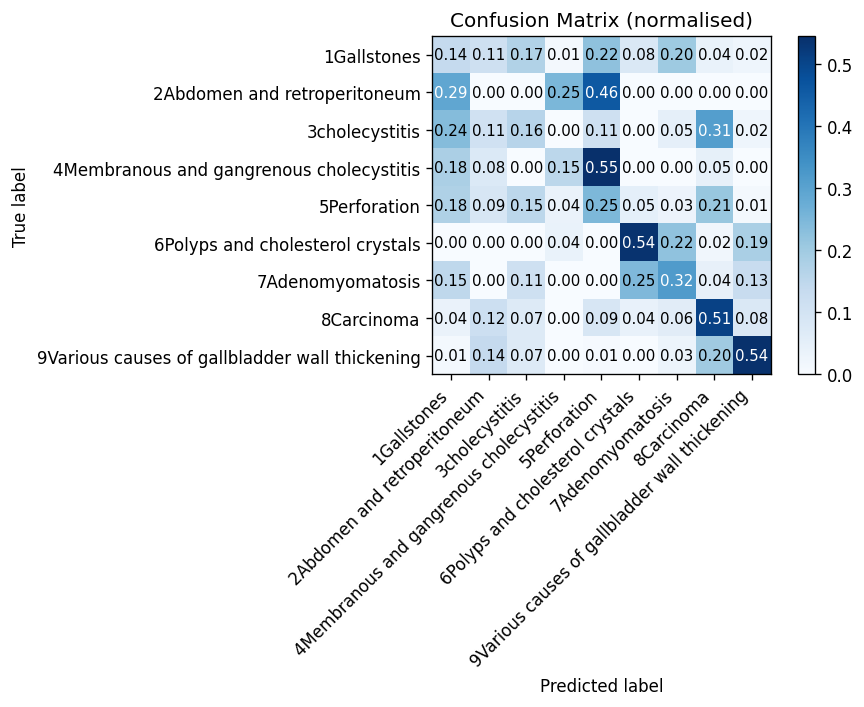

[SAVE] /content/drive/MyDrive/AI/Project_Summer_Module/ghostnet_fold5_test_eval/confusion_matrix.png


In [ ]:
#7. Confusion Matrix (normalised)

def plot_confusion_matrix(cm, classes, normalize=True, cmap="Blues", save_path=None):
    if normalize:
        with np.errstate(all='ignore'):
            cm = cm.astype("float") / cm.sum(axis=1, keepdims=True)
            cm = np.nan_to_num(cm)

    fig, ax = plt.subplots(figsize=(8, 6))
    im = ax.imshow(cm, interpolation="nearest", cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    ax.set(
        xticks=np.arange(cm.shape[1]), yticks=np.arange(cm.shape[0]),
        xticklabels=classes, yticklabels=classes,
        ylabel="True label", xlabel="Predicted label",
        title=f"Confusion Matrix{' (normalised)' if normalize else ''}"
    )
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

    fmt = ".2f" if normalize else "d"
    thresh = cm.max() / 2.0
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        ax.text(j, i, format(cm[i, j], fmt),
                ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black", fontsize=9)
    fig.tight_layout()
    if save_path:
        fig.savefig(save_path, bbox_inches="tight", dpi=200)
    plt.show()

cm_png = f"{OUT_DIR}/confusion_matrix.png"
plot_confusion_matrix(cm, class_names, normalize=True, save_path=cm_png)
print(f"[SAVE] {cm_png}")


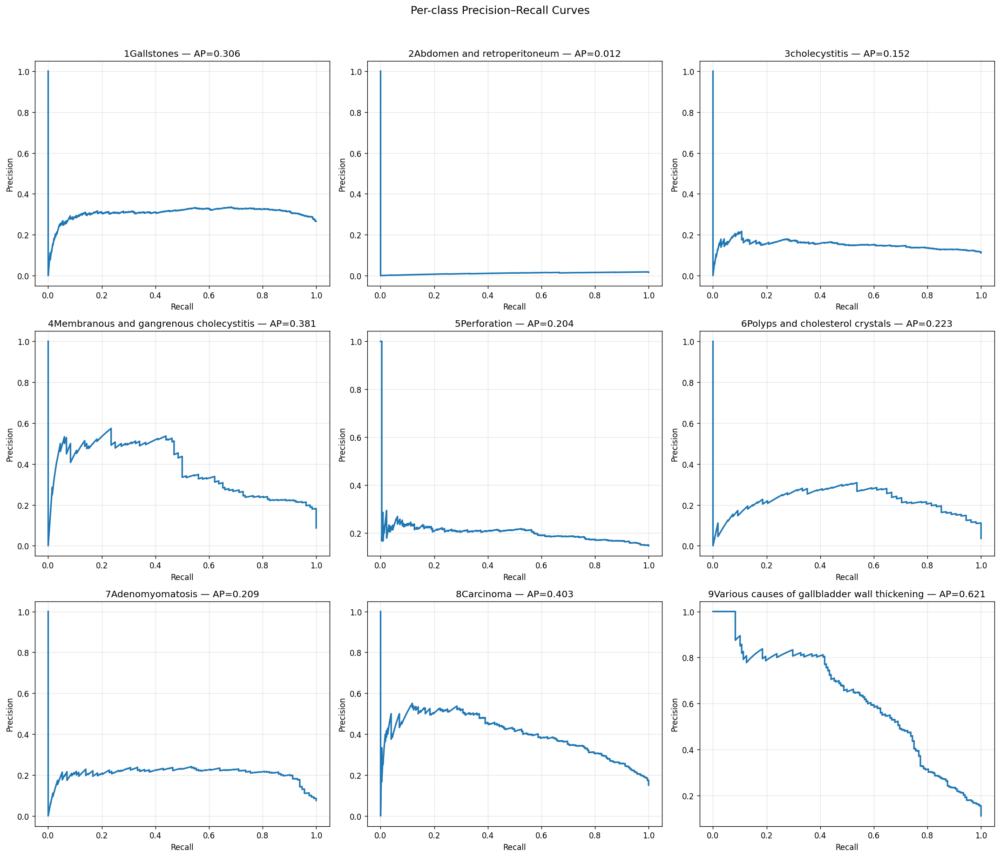

[SAVE] /content/drive/MyDrive/AI/Project_Summer_Module/ghostnet_fold5_test_eval/pr_curves_per_class.png


In [ ]:
#8. Precision–Recall Curves per class (+ AP)

y_prob = probs.numpy()
y_true_1hot = np.zeros((len(y_true_np), num_classes), dtype=np.int32)
y_true_1hot[np.arange(len(y_true_np)), y_true_np] = 1

rows = math.ceil(num_classes/3)
fig, axes = plt.subplots(rows, 3, figsize=(18, 5*rows))
axes = axes.ravel()

ap_scores = []
for c in range(num_classes):
    precision, recall, _ = precision_recall_curve(y_true_1hot[:, c], y_prob[:, c])
    ap = average_precision_score(y_true_1hot[:, c], y_prob[:, c])
    ap_scores.append(ap)

    ax = axes[c]
    ax.plot(recall, precision, lw=2)
    ax.set_title(f"{class_names[c]} — AP={ap:.3f}")
    ax.set_xlabel("Recall"); ax.set_ylabel("Precision")
    ax.grid(True, alpha=0.3)

#Hide any extra subplots
for k in range(num_classes, len(axes)):
    axes[k].axis("off")

plt.suptitle("Per-class Precision–Recall Curves", fontsize=14, y=1.02)
plt.tight_layout()
pr_png = f"{OUT_DIR}/pr_curves_per_class.png"
plt.savefig(pr_png, bbox_inches="tight", dpi=200)
plt.show()
print(f"[SAVE] {pr_png}")


In [ ]:
#CELL: summary dump
summary = {
    "macro_f1": float(np.mean(metrics_df['f1'])),
    "num_classes": num_classes,
    "classes": class_names,
    "ap_per_class": {cls: float(ap) for cls, ap in zip(class_names, ap_scores)},
}
with open(os.path.join(OUT_DIR, "summary.json"), "w") as f:
    json.dump(summary, f, indent=2)

print(json.dumps(summary, indent=2))
print("\nArtifacts saved in:", OUT_DIR)


{
  "macro_f1": 0.27235412861030045,
  "num_classes": 9,
  "classes": [
    "1Gallstones",
    "2Abdomen and retroperitoneum",
    "3cholecystitis",
    "4Membranous and gangrenous cholecystitis",
    "5Perforation",
    "6Polyps and cholesterol crystals",
    "7Adenomyomatosis",
    "8Carcinoma",
    "9Various causes of gallbladder wall thickening"
  ],
  "ap_per_class": {
    "1Gallstones": 0.30647950265508916,
    "2Abdomen and retroperitoneum": 0.011888429436848667,
    "3cholecystitis": 0.15187624301992922,
    "4Membranous and gangrenous cholecystitis": 0.38110899997767467,
    "5Perforation": 0.20446076145897035,
    "6Polyps and cholesterol crystals": 0.22317037014031887,
    "7Adenomyomatosis": 0.20916088197886112,
    "8Carcinoma": 0.4028190516093209,
    "9Various causes of gallbladder wall thickening": 0.6205317827096083
  }
}

Artifacts saved in: /content/drive/MyDrive/AI/Project_Summer_Module/ghostnet_fold5_test_eval


In [ ]:
#Turn all nn.ReLU(inplace=True) into nn.ReLU(inplace=False)
import torch.nn as nn

def disable_inplace_relu(module: nn.Module):
    for name, child in module.named_children():
        if isinstance(child, nn.ReLU) and getattr(child, "inplace", False):
            setattr(module, name, nn.ReLU(inplace=False))
        else:
            disable_inplace_relu(child)

disable_inplace_relu(model)
model.eval()  # keep eval mode for CAM
print("[OK] Switched all in-place ReLU to out-of-place for CAM.")


[OK] Switched all in-place ReLU to out-of-place for CAM.


In [ ]:
#Grad-CAM++ (hook-safe version: no backward hooks)

import os, numpy as np, torch, torch.nn as nn, torch.nn.functional as F, cv2


def find_last_conv_layer(m):
    last = None
    for mod in m.modules():
        if isinstance(mod, nn.Conv2d):
            last = mod
    return last

target_layer = find_last_conv_layer(model)   #re-grab after patch
#(re)register the forward hook

#ImageNet de-normalisation for overlays
IMAGENET_MEAN = np.array([0.485, 0.456, 0.406]).reshape(1,1,3)
IMAGENET_STD  = np.array([0.229, 0.224, 0.225]).reshape(1,1,3)
def denorm(img_t: torch.Tensor) -> np.ndarray:
    """img_t: (3,H,W) -> float RGB [0..1]"""
    img = img_t.permute(1,2,0).cpu().numpy()
    img = (img * IMAGENET_STD + IMAGENET_MEAN).clip(0,1)
    return img

#forward hook to capture feature maps (no detach; we need grads)
_fmaps = None
def _f_hook(_, __, output):
    global _fmaps
    _fmaps = output  #keeps graph so autograd.grad can flow

_fh = target_layer.register_forward_hook(_f_hook)

@torch.no_grad()
def collect_path_to_tensor(loader):
    m = {}
    for imgs, _, paths in loader:
        for t, p in zip(imgs, paths):
            m[p] = t  #normalised (3,H,W)
    return m

#Map each test image path to its input tensor (for display and re-run)
path_to_tensor = collect_path_to_tensor(test_loader)

def gradcam_pp_single(x: torch.Tensor, class_idx: int) -> np.ndarray:
    """
    x: (1,3,H,W) normalised, on DEVICE
    class_idx: target class index for CAM
    return: (H,W) CAM in [0,1]
    """
    global _fmaps
    _fmaps = None

    #Forward: populate _fmaps via hook (keep grads enabled)
    with torch.enable_grad():
        logits = model(x)                 #(1, C)
        score = logits[0, class_idx]      #scalar

        #grads w.r.t. hooked activations
        assert _fmaps is not None, "Hook did not capture activations."
        grads = torch.autograd.grad(score, _fmaps, retain_graph=False, create_graph=False)[0]

        A = _fmaps                        #(1, K, h, w)
        g = grads
        g2, g3 = g * g, g * g * g
        eps = 1e-7

        #Grad-CAM++ weights
        alpha = g2 / (2.0 * g2 + A * g3 + eps)
        w = (alpha * torch.clamp(g, min=0.0)).sum(dim=(2, 3))  #(1, K)

        cam = torch.einsum("nk,nkhw->nhw", w, A)               #(1, h, w)
        cam = torch.clamp(cam, min=0.0)[0]                     #(h, w)

        cam = F.interpolate(cam.unsqueeze(0).unsqueeze(0),
                            size=(x.shape[2], x.shape[3]),
                            mode="bilinear", align_corners=False)[0, 0]

    cam = cam.detach().cpu().numpy()                           #detach before numpy()
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-7)
    return cam


#Choose a few confident examples (correct and incorrect)
prob_max, _ = probs.max(dim=1)
correct_mask = (y_pred == y_true)
incorrect_mask = ~correct_mask

K = 6
sel_correct = (torch.where(correct_mask)[0]
               [prob_max[correct_mask].topk(min(K, correct_mask.sum().item())).indices].tolist()
               if correct_mask.any() else [])
sel_incorrect = (torch.where(incorrect_mask)[0]
                 [prob_max[incorrect_mask].topk(min(K, incorrect_mask.sum().item())).indices].tolist()
                 if incorrect_mask.any() else [])
chosen = sel_correct + sel_incorrect
print(f"[CAM++] Visualising {len(chosen)} images "
      f"({len(sel_correct)} correct + {len(sel_incorrect)} incorrect).")

cam_dir = os.path.join(OUT_DIR, "gradcampp")
os.makedirs(cam_dir, exist_ok=True)

#Generate and save overlays
for idx in chosen:
    p = img_paths[idx]
    t = path_to_tensor[p]                  #(3,H,W) normalised
    x = t.unsqueeze(0).to(DEVICE)

    cam = gradcam_pp_single(x, int(y_pred[idx].item()))  #predicted class
    base_rgb = denorm(t)                                   #(H,W,3), [0,1]

    heat = (cam * 255).astype(np.uint8)
    heat = cv2.applyColorMap(heat, cv2.COLORMAP_JET)[:, :, ::-1] / 255.0  #RGB [0..1]
    overlay = (0.5 * base_rgb + 0.5 * heat).clip(0, 1)
    overlay_u8 = (overlay * 255).astype(np.uint8)

    pred_c = int(y_pred[idx].item())
    true_c = int(y_true[idx].item())
    fname  = f"campp_pred-{class_names[pred_c]}_true-{class_names[true_c]}_{os.path.basename(p)}.png"
    out_p  = os.path.join(cam_dir, fname)
    cv2.imwrite(out_p, cv2.cvtColor(overlay_u8, cv2.COLOR_RGB2BGR))
    print("[SAVE]", out_p)

#clean the hook
_fh.remove()
print(f"[DONE] Grad-CAM++ overlays saved to: {cam_dir}")


[CAM++] Visualising 12 images (6 correct + 6 incorrect).
[SAVE] /content/drive/MyDrive/AI/Project_Summer_Module/ghostnet_fold5_test_eval/gradcampp/campp_pred-9Various causes of gallbladder wall thickening_true-9Various causes of gallbladder wall thickening_i15 (15).png.png
[SAVE] /content/drive/MyDrive/AI/Project_Summer_Module/ghostnet_fold5_test_eval/gradcampp/campp_pred-9Various causes of gallbladder wall thickening_true-9Various causes of gallbladder wall thickening_i15 (18).png.png
[SAVE] /content/drive/MyDrive/AI/Project_Summer_Module/ghostnet_fold5_test_eval/gradcampp/campp_pred-9Various causes of gallbladder wall thickening_true-9Various causes of gallbladder wall thickening_i15 (13).png.png
[SAVE] /content/drive/MyDrive/AI/Project_Summer_Module/ghostnet_fold5_test_eval/gradcampp/campp_pred-9Various causes of gallbladder wall thickening_true-9Various causes of gallbladder wall thickening_i15 (14).png.png
[SAVE] /content/drive/MyDrive/AI/Project_Summer_Module/ghostnet_fold5_test_

In [ ]:
#10. Tiny machine-readable summary

summary = {
    "macro_f1": macro_f1,
    "num_classes": int(num_classes),
    "classes": class_names,
    "ap_per_class": {cls: float(ap) for cls, ap in zip(class_names, ap_scores)}
}
with open(f"{OUT_DIR}/summary.json", "w") as f:
    json.dump(summary, f, indent=2)

print(json.dumps(summary, indent=2))
print(f"\n[ALL DONE] Outputs saved in: {OUT_DIR}")


{
  "macro_f1": 0.27235412861030045,
  "num_classes": 9,
  "classes": [
    "1Gallstones",
    "2Abdomen and retroperitoneum",
    "3cholecystitis",
    "4Membranous and gangrenous cholecystitis",
    "5Perforation",
    "6Polyps and cholesterol crystals",
    "7Adenomyomatosis",
    "8Carcinoma",
    "9Various causes of gallbladder wall thickening"
  ],
  "ap_per_class": {
    "1Gallstones": 0.30647950265508916,
    "2Abdomen and retroperitoneum": 0.011888429436848667,
    "3cholecystitis": 0.15187624301992922,
    "4Membranous and gangrenous cholecystitis": 0.38110899997767467,
    "5Perforation": 0.20446076145897035,
    "6Polyps and cholesterol crystals": 0.22317037014031887,
    "7Adenomyomatosis": 0.20916088197886112,
    "8Carcinoma": 0.4028190516093209,
    "9Various causes of gallbladder wall thickening": 0.6205317827096083
  }
}

[ALL DONE] Outputs saved in: /content/drive/MyDrive/AI/Project_Summer_Module/ghostnet_fold5_test_eval
